In [1]:
import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import pprint
import re
import gensim
import gensim.corpora as corpora
import os
from gensim.utils import simple_preprocess
from nltk.corpus import stopwords

In [2]:
df = pd.read_csv("../../amazon_reviews_us_Grocery_v1_00.tsv", sep='\t', quoting=3).sample(200000)
df = df[["product_id", "review_body"]]
df

,product_id,review_body
314559,B004SFRTDY,Good product and good price. They did what th...
734526,B0000CH4G9,"Always good, rich, smooth. :)"
74768,B00KWX64Y6,Absolutely gorgeous! I was hesitant to send t...
581019,B000NT35O6,Good stuff!!!
1215532,B002J9J8EY,i love jif peanut butter but this is disgustin...
...,...,...
1944569,B004473PAW,I've got to say these are the best I've ever e...
1946700,B003RM9SA6,"Great Flavor. This product makes cakes, smoot..."
1574402,B00B737P8E,"This product was received promptly, they work ..."
1523627,B000S4EICE,i grew up with homemade spaetzle. i learned fr...


In [3]:
data = df.dropna()

In [4]:
data['review_body'] = data['review_body'].map(lambda x: re.sub('[,\.!?]', '', x))
data['review_body'] = data['review_body'].map(lambda x: x.lower())
data

<ipython-input-4-5af7daf56c54>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_body'] = data['review_body'].map(lambda x: re.sub('[,\.!?]', '', x))
<ipython-input-4-5af7daf56c54>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['review_body'] = data['review_body'].map(lambda x: x.lower())


,product_id,review_body
314559,B004SFRTDY,good product and good price they did what the...
734526,B0000CH4G9,always good rich smooth :)
74768,B00KWX64Y6,absolutely gorgeous i was hesitant to send th...
581019,B000NT35O6,good stuff
1215532,B002J9J8EY,i love jif peanut butter but this is disgustin...
...,...,...
1944569,B004473PAW,i've got to say these are the best i've ever e...
1946700,B003RM9SA6,great flavor this product makes cakes smoothi...
1574402,B00B737P8E,this product was received promptly they work w...
1523627,B000S4EICE,i grew up with homemade spaetzle i learned fro...


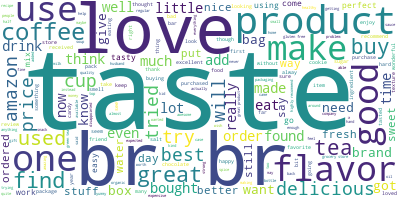

In [5]:
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(data['review_body'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

In [42]:
stop_words = stopwords.words('english')
stop_words.extend(['br'])
def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))
def remove_stopwords(texts):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]
data_filtered = data.review_body.values.tolist()
data_words = list(sent_to_words(data_filtered))
# remove stop words
data_words = remove_stopwords(data_words)
pprint.pprint(data_words[0][:30])
#np.array(data_words[0], dtype=object).shape

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


['good', 'product', 'good', 'price', 'said', 'would']


In [53]:
new_data = data_words

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [58]:
def get_adjectives(text):
    tagged = nltk.pos_tag(text, tagset='universal')
    review_a = [word for (word, tag) in tagged if tag == 'ADJ']
    return review_a

new_data = list(map(lambda x: get_adjectives(x), new_data))

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[['good'],
 ['good'],
 ['gorgeous', 'hesitant', 'great', 'wonderful', 'great'],
 ['good'],
 [],
 ['pasta'],
 ['rich'],
 ['new',
  'many',
  'available',
  'tried',
  'fresh',
  'great',
  'new',
  'sure',
  'many',
  'many',
  'regular',
  'regular',
  'overall'],
 ['good', 'good', 'new'],
 ['good',
  'easy',
  'uneaten',
  'picky',
  'old',
  'easy',
  'vegetable',
  'fresh',
  'vegetable',
  'fresh',
  'great',
  'able',
  'much',
  'healthy',
  'nutritious'],
 ['tasty'],
 ['hesitant',
  'negative',
  'new',
  'different',
  'entire',
  'expensive',
  'many',
  'different',
  'last',
  'nice',
  'acceptable',
  'good',
  'several',
  'many',
  'update',
  'many',
  'local',
  'rural',
  'different',
  'last',
  'higher',
  'good'],
 ['disappointed', 'large', 'great'],
 ['cheap', 'several', 'good', 'green'],
 ['much', 'whole', 'worse', 'whole', 'whole', 'big', 'enough'],
 ['great'],
 ['good', 'red', 'olive', 'red', 'delicious', 'extra', 'olive'],
 ['great', 'healthy', 'little'],
 ['go

 ['big'],
 ['healthy', 'unhealthy', 'great', 'tasty', 'real', 'healthy'],
 ['full', 'willing', 'bottle', 'happy'],
 ['good'],
 [],
 ['unbelievable', 'last', 'indescribable', 'fat', 'athletic'],
 ['awful',
  'metallic',
  'real',
  'hot',
  'little',
  'cool',
  'weak',
  'little',
  'bent',
  'great',
  'hot',
  'initial',
  'main'],
 ['healthy'],
 [],
 ['great', 'loose', 'long'],
 ['good'],
 ['good', 'good', 'large'],
 ['great'],
 ['particular', 'biggest', 'black'],
 ['vegan', 'favorite', 'bad'],
 ['local', 'soft', 'delicious', 'free'],
 ['much'],
 ['great'],
 [],
 ['excellent', 'much', 'softer', 'excellent', 'green'],
 ['much'],
 ['regular', 'french', 'stronger', 'regular'],
 ['sweet', 'nice', 'great'],
 ['great'],
 ['delicious', 'expensive'],
 ['happy'],
 ['el',
  'decent',
  'hot',
  'many',
  'hot',
  'different',
  'possible',
  'hot',
  'great',
  'reliable',
  'ntilde',
  'excellent',
  'good',
  'red',
  'hot',
  'mixed',
  'green',
  'garlic',
  'hottest',
  'green',
  'diffe

 ['great'],
 ['small'],
 ['great'],
 ['local'],
 ['safe'],
 [],
 ['great'],
 [],
 ['cious'],
 ['happy', 'happy', 'last', 'long', 'possible'],
 ['great', 'much', 'bad', 'great', 'right', 'white'],
 [],
 [],
 [],
 ['fine', 'last', 'weird', 'several'],
 ['delicious', 'similar'],
 ['big'],
 ['best'],
 ['great', 'old'],
 ['good'],
 ['close'],
 ['sweet',
  'hard',
  'cheap',
  'little',
  'salt',
  'little',
  'oh',
  'many',
  'big',
  'great',
  'little',
  'high',
  'single',
  'last',
  'several',
  'overall',
  'great'],
 ['entire', 'stronger', 'superior', 'great', 'best'],
 ['great', 'best'],
 [],
 ['original', 'hot', 'mary', 'original', 'great'],
 ['low'],
 [],
 ['several', 'old'],
 ['able', 'large', 'separate'],
 ['best'],
 ['white'],
 ['great', 'several', 'satisfactory', 'great', 'great'],
 ['mixed', 'high', 'terrible', 'strong', 'good', 'due', 'full', 'strong'],
 ['perfect', 'great'],
 [],
 ['healthy', 'best', 'unhealthy'],
 [],
 ['great'],
 ['able', 'great', 'unique', 'free'],
 ['

  'various',
  'hot',
  'best',
  'good',
  'little',
  'dominant'],
 ['great', 'fresh', 'happy'],
 ['creamy', 'great'],
 ['local', 'costly', 'amazon', 'additional', 'small'],
 [],
 ['green'],
 ['fresh', 'soft'],
 ['reliable', 'good', 'small', 'moderate'],
 ['illness',
  'natural',
  'original',
  'many',
  'top',
  'bad',
  'dose',
  'diet',
  'strict',
  'nauseous',
  'higher',
  'good'],
 ['good',
  'healthy',
  'different',
  'similar',
  'good',
  'unsuccessful',
  'single',
  'reliable',
  'soft',
  'worth',
  'sure',
  'extra',
  'dependable',
  'poor'],
 ['forgot', 'german', 'good', 'new', 'annual'],
 ['best',
  'usa',
  'difficult',
  'hot',
  'cold',
  'multiple',
  'little',
  'key',
  'lime',
  'white',
  'deep',
  'free'],
 ['overall', 'good'],
 ['compatible'],
 ['easy', 'wish', 'cheaper'],
 ['easy', 'delicious', 'great', 'best'],
 ['huge', 'refillable', 'new', 'refillable', 'little', 'refillable', 'big'],
 ['usda', 'organic', 'red', 'tasty', 'garlic', 'preservative'],
 ['

  'happy',
  'free',
  'artificial',
  'perfect',
  'little',
  'much',
  'free'],
 ['greatbeen', 'mystic', 'great'],
 ['diet'],
 ['great'],
 ['good', 'strong'],
 [],
 ['huge', 'sunflower', 'sweet', 'smooth'],
 ['expensive', 'nice', 'attractive', 'indian', 'real', 'great'],
 [],
 ['many', 'best'],
 ['specific', 'picky', 'better', 'bad', 'fresh'],
 [],
 ['small', 'final', 'little', 'expensive'],
 ['easy',
  'happy',
  'nitty',
  'gritty',
  'right',
  'dry',
  'white',
  'huge',
  'various',
  'unique',
  'good',
  'many',
  'sweet',
  'pear',
  'old',
  'crumble',
  'nice',
  'regular',
  'whole'],
 ['great'],
 [],
 ['possible', 'special', 'outstanding'],
 ['jumbo', 'jumbo', 'great'],
 ['wrong',
  'southeastern',
  'cheese',
  'excellent',
  'individual',
  'warm',
  'different',
  'great',
  'single'],
 ['able'],
 ['outstanding'],
 ['many', 'delicious'],
 ['wonderful'],
 ['diastatic'],
 ['high', 'fat', 'high', 'healthy', 'good', 'healthy', 'local'],
 ['delicious'],
 ['difficult', 'lea

 ['best'],
 ['great'],
 ['agree', 'separate', 'big'],
 ['different'],
 [],
 ['good'],
 ['crazy', 'ecstatic', 'much', 'several', 'great'],
 ['costly', 'columbian', 'wish', 'better', 'good'],
 ['excellent', 'extract', 'several', 'previous'],
 ['good', 'inexpensive', 'blackbean', 'local'],
 ['diabetic', 'regular', 'bad'],
 ['good'],
 ['low', 'low', 'little', 'good'],
 ['healthy'],
 [],
 ['fish', 'healthiest', 'great', 'real', 'great'],
 ['best'],
 ['hard'],
 ['basic', 'slow', 'fresh', 'last', 'reasonable', 'local', 'tiny', 'little'],
 ['delicious', 'next'],
 ['good'],
 ['great', 'great', 'natural', 'bad'],
 ['lowest', 'free'],
 ['nice'],
 ['delicious'],
 ['second', 'great', 'great'],
 ['good', 'local'],
 ['great', 'hard', 'great'],
 ['several', 'little', 'high', 'high', 'individual', 'much'],
 ['allergic', 'handy', 'easy'],
 ['great', 'several', 'entire', 'great'],
 ['flavorful', 'good'],
 ['reluctant',
  'negative',
  'organic',
  'regular',
  'much',
  'bigger',
  'organic',
  'deliciou

 [],
 [],
 ['similar', 'organic', 'natural', 'saltier', 'sure', 'saltier', 'big'],
 ['smaller'],
 ['low', 'many'],
 ['great'],
 ['dental', 'great', 'good'],
 ['favorite', 'good'],
 ['turkish', 'good', 'nice', 'fresh'],
 [],
 [],
 ['daily'],
 ['great'],
 ['true'],
 [],
 ['great'],
 [],
 [],
 ['soft', 'good', 'successful'],
 ['free',
  'several',
  'biggest',
  'big',
  'old',
  'easier',
  'open',
  'difficult',
  'open',
  'third',
  'big',
  'long',
  'different'],
 [],
 ['cafe',
  'larger',
  'oz',
  'delicious',
  'large',
  'flavorful',
  'least',
  'brewed',
  'large',
  'happy'],
 ['many', 'indescribable', 'low'],
 [],
 ['great'],
 ['local', 'grand', 'old'],
 ['light', 'heavy', 'different', 'free'],
 ['greek', 'healthy'],
 ['fabulous',
  'diet',
  'little',
  'fried',
  'possible',
  'delicious',
  'small',
  'dish',
  'little',
  'last',
  'small'],
 ['high',
  'rich',
  'distinct',
  'buttery',
  'american',
  'italian',
  'superior',
  'regular',
  'white'],
 ['receive', 'prev

 ['nice'],
 ['good'],
 ['worried',
  'hot',
  'fresh',
  'full',
  'nice',
  'easy',
  'tear',
  'great',
  'good',
  'able',
  'competitive'],
 ['great', 'easy', 'quick', 'outstanding'],
 ['favorite', 'several', 'delicious', 'great'],
 ['good'],
 ['great'],
 ['much', 'enjoyable', 'prime'],
 ['gross'],
 ['huge', 'little', 'heavy'],
 ['similar', 'fresh'],
 ['chemical'],
 ['free'],
 ['excellent', 'free'],
 ['delicious', 'great', 'prompt', 'many'],
 ['good'],
 ['crucial',
  'wondrous',
  'good',
  'able',
  'wonderful',
  'chinese',
  'short',
  'happy',
  'everyday',
  'chinese',
  'popular',
  'native',
  'perpetual',
  'abundant',
  'sweet',
  'unusual',
  'hot',
  'rich',
  'available'],
 ['great', 'good'],
 ['sticky'],
 ['favorite', 'nice', 'special', 'flavorful', 'several'],
 ['fantastic', 'great', 'atlantic'],
 ['great'],
 ['good'],
 [],
 [],
 ['automatic'],
 ['outrageous', 'outrageous', 'free', 'great'],
 ['present', 'bad', 'huge', 'bad', 'longer', 'great', 'bad'],
 ['local', 'sec

  'large',
  'green',
  'obvious',
  'great',
  'green',
  'green',
  'daily',
  'wonderful',
  'creamy',
  'great',
  'true',
  'first',
  'wish',
  'prime',
  'usps'],
 ['best', 'rich', 'full', 'intense', 'large'],
 ['expensive',
  'gotten',
  'decent',
  'dry',
  'fondant',
  'white',
  'next',
  'white',
  'able',
  'white'],
 ['several', 'high', 'good', 'local'],
 ['huge', 'strong', 'interesting', 'natural'],
 ['healthy',
  'various',
  'delicious',
  'full',
  'nice',
  'several',
  'different',
  'vegetable',
  'natural',
  'content',
  'nutritional',
  'kcal',
  'cold',
  'different',
  'suitable',
  'low',
  'wide',
  'additional',
  'useful'],
 ['fresh'],
 ['fresh'],
 [],
 ['green', 'small', 'sloppy', 'live'],
 ['palatable', 'expensive'],
 [],
 ['great', 'low', 'great'],
 ['great', 'little', 'expensive'],
 ['great'],
 ['pleasant',
  'usual',
  'delicious',
  'better',
  'lean',
  'fantastic',
  'zippy',
  'full'],
 [],
 ['diabetic'],
 ['special', 'delicious', 'late', 'perfect

 ['open',
  'rich',
  'happy',
  'electric',
  'soft',
  'fine',
  'free',
  'pleasurable',
  'strong'],
 ['japanese', 'higher'],
 ['loose', 'happy', 'fair', 'unusual'],
 ['unacceptable'],
 ['good'],
 ['perfect', 'great', 'amazing', 'little'],
 [],
 ['best'],
 ['old', 'easy', 'wonderful'],
 ['great', 'great', 'hot'],
 ['good', 'huge', 'terrible', 'heavy', 'different', 'available'],
 ['smaller', 'big', 'white'],
 ['bad', 'whole', 'hard', 'gross'],
 ['columbian', 'regular', 'poorest', 'unpalatable'],
 ['free', 'nice', 'hot', 'good'],
 ['white', 'good'],
 [],
 [],
 ['best'],
 ['good', 'best', 'easy', 'different'],
 [],
 ['good', 'free', 'different'],
 ['great', 'hard'],
 [],
 [],
 ['diet',
  'dee',
  'raw',
  'little',
  'apprehensive',
  'raw',
  'delicious',
  'great',
  'great'],
 ['delicious', 'good'],
 ['ive', 'mixed', 'last', 'meal', 'ive', 'many', 'first'],
 [],
 ['good'],
 [],
 [],
 [],
 ['new', 'different'],
 [],
 ['fabulous'],
 ['hot', 'sandwich', 'central', 'indian', 'great', '

 ['little'],
 [],
 ['hungry', 'guilty', 'negative', 'higher', 'ready', 'reasonable'],
 ['much',
  'terrible',
  'open',
  'bad',
  'good',
  'better',
  'jenny',
  'lean',
  'white',
  'green',
  'ready',
  'free',
  'little',
  'much',
  'old',
  'less',
  'true'],
 ['older', 'basic'],
 [],
 ['alternative',
  'detectable',
  'impossible',
  'careful',
  'detectable',
  'sweeten',
  'aware',
  'interested',
  'strong',
  'possible'],
 [],
 [],
 ['good', 'full', 'strong'],
 ['cheapest'],
 ['great'],
 ['great', 'unpleasant', 'great', 'raw'],
 ['good', 'expensive'],
 ['bad'],
 [],
 [],
 ['good', 'fresh', 'delicate', 'beneficial', 'many', 'bad', 'good'],
 ['good'],
 [],
 ['last'],
 ['real', 'authentic', 'real'],
 ['great', 'delicious', 'softer', 'sugary'],
 ['different', 'bad', 'great'],
 ['allergic', 'scan'],
 ['sweet', 'sour'],
 ['free',
  'free',
  'free',
  'free',
  'real',
  'great',
  'able',
  'several',
  'expensive',
  'regular',
  'nice',
  'great',
  'free',
  'free'],
 ['pinea

 ['diabetic', 'happy', 'happy'],
 [],
 ['much'],
 ['fresh', 'soft'],
 ['great'],
 ['green',
  'first',
  'japanese',
  'good',
  'second',
  'expensive',
  'green',
  'real',
  'asian',
  'prime',
  'cheaper',
  'prime',
  'little'],
 ['good', 'local'],
 ['small', 'smaller', 'least', 'apprised'],
 ['bad', 'gross', 'thankful', 'give', 'little'],
 ['familiar', 'different', 'many'],
 ['good'],
 [],
 ['great', 'last', 'white', 'delicious'],
 ['best', 'small', 'great', 'additional'],
 ['like',
  'german',
  'rich',
  'great',
  'easier',
  'little',
  'german',
  'love',
  'german',
  'best'],
 ['great', 'expensive', 'much'],
 ['good'],
 ['fantastic', 'clean', 'red'],
 ['great'],
 [],
 ['little'],
 [],
 [],
 ['little', 'dry'],
 ['handy', 'sweet', 'great'],
 ['local', 'free', 'much', 'real', 'good', 'free', 'safe'],
 ['similar', 'white'],
 ['essential',
  'dish',
  'szechuan',
  'real',
  'broad',
  'various',
  'western',
  'japanese',
  'asian'],
 ['good'],
 ['impossible', 'local'],
 ['enj

 [],
 ['great', 'little'],
 ['good', 'good'],
 ['excellent', 'good', 'difficult', 'many', 'happy'],
 ['best', 'big', 'high', 'incredible', 'great', 'gigantic'],
 ['gluten',
  'diet',
  'good',
  'free',
  'less',
  'stellar',
  'last',
  'great',
  'quick',
  'easy',
  'great',
  'simple',
  'next'],
 ['favorite', 'easy', 'wish', 'entire'],
 [],
 ['acceptable', 'cheap', 'additional', 'united'],
 ['familiar',
  'poppy',
  'happy',
  'unwashed',
  'natural',
  'extra',
  'short',
  'better',
  'whole',
  'good',
  'next',
  'best'],
 ['great', 'nice', 'great'],
 ['great', 'equal'],
 ['great', 'great'],
 ['high'],
 [],
 ['green', 'good'],
 ['good'],
 ['nice'],
 ['red', 'available', 'much', 'last'],
 ['excellent', 'weaker'],
 ['good', 'safe', 'wholesome', 'great', 'free'],
 ['extra', 'old'],
 ['higher', 'common'],
 [],
 ['hot'],
 ['full'],
 ['particular',
  'red',
  'last',
  'ingredient',
  'large',
  'nasty',
  'false',
  'true',
  'upset',
  'free',
  'antibiotic',
  'free'],
 ['great']

  'open',
  'frozen',
  'tropical',
  'delicious',
  'expensive',
  'great',
  'able',
  'local',
  'sour',
  'bad'],
 [],
 ['regular'],
 [],
 ['organic', 'diet', 'old', 'ambitious'],
 ['many', 'best'],
 [],
 ['bought', 'african', 'local'],
 ['golean', 'best', 'healthy'],
 ['great'],
 ['occasional', 'great', 'great'],
 ['hot', 'nose', 'hot', 'nose', 'little', 'dry'],
 ['small', 'easier'],
 ['small'],
 [],
 ['different',
  'unique',
  'regular',
  'certain',
  'particular',
  'flavorful',
  'different',
  'fine',
  'new'],
 ['delicious', 'fragrant', 'much', 'great'],
 ['fabulous', 'great', 'great'],
 ['great', 'little'],
 ['super', 'fresh', 'old'],
 ['sour', 'little', 'heavy', 'sour', 'real'],
 [],
 ['larger',
  'available',
  'heavy',
  'large',
  'heavy',
  'low',
  'cal',
  'vary',
  'regular',
  'fresh',
  'delicious',
  'original',
  'guilty',
  'good',
  'good',
  'great',
  'healthy',
  'less',
  'best',
  'last'],
 ['impressed', 'good', 'natural'],
 ['red', 'free'],
 ['good'],
 

  'hot',
  'good',
  'careful',
  'hot',
  'dangerous',
  'dry',
  'hot',
  'much',
  'less',
  'surface',
  'fresh',
  'dry',
  'dry',
  'dry',
  'fresh',
  'delicious',
  'dangerous',
  'raw',
  'greek',
  'great',
  'light',
  'healthy',
  'bad',
  'delicious',
  'dangerous',
  'raw',
  'greek',
  'great',
  'light',
  'healthy',
  'bad'],
 ['old'],
 ['mixed', 'slight'],
 [],
 ['liquid', 'great', 'nice'],
 ['least', 'black', 'sweet'],
 ['live'],
 [],
 ['secret', 'everclear', 'hot'],
 ['dry', 'many', 'little', 'broken'],
 [],
 ['great', 'large'],
 ['good'],
 ['good'],
 ['good'],
 ['best'],
 ['delicious'],
 ['good',
  'hot',
  'nice',
  'rich',
  'smallest',
  'sure',
  'sure',
  'loose',
  'empty',
  'sensitive',
  'solid',
  'vegetable',
  'dry',
  'natural',
  'artificial'],
 ['good'],
 [],
 ['bitter', 'sweet', 'sweet', 'special', 'right', 'strawish', 'high', 'free'],
 ['good'],
 ['many', 'many', 'whole', 'good'],
 ['good'],
 ['best'],
 ['purple'],
 ['best', 'rich', 'huge'],
 ['goo

  'favorite',
  'innovative',
  'good',
  'healthy'],
 ['favorite', 'hot', 'able'],
 [],
 ['similar'],
 [],
 [],
 ['whole', 'good', 'strong', 'good', 'happy'],
 ['loose'],
 ['fat', 'wonderful', 'several'],
 ['least', 'great'],
 ['new', 'biodegradable', 'super', 'great'],
 ['total'],
 ['good', 'bad', 'hot'],
 ['good', 'next'],
 ['single', 'local', 'incredible', 'real', 'good'],
 ['best'],
 ['best'],
 ['free'],
 ['good', 'many', 'easier', 'used', 'sweet', 'gravy', 'many'],
 ['happy'],
 [],
 ['good'],
 ['raw', 'organic'],
 ['good', 'real', 'good'],
 ['super', 'great', 'great'],
 ['good', 'able'],
 ['good'],
 ['due', 'albanese', 'best'],
 [],
 [],
 [],
 ['unbelievable'],
 ['great', 'great', 'great', 'first'],
 ['available', 'good', 'economical', 'free'],
 ['easy'],
 ['regular'],
 [],
 ['great', 'natural'],
 ['mickey', 'great'],
 ['happy', 'nice', 'reasonable', 'huge'],
 ['nice', 'large', 'impossible'],
 [],
 ['best'],
 ['great', 'good', 'fewer', 'good'],
 ['many', 'good'],
 ['new', 'local'

 ['come', 'great', 'great'],
 ['additional', 'cheaper', 'larger'],
 [],
 [],
 ['joint', 'wonderful', 'stronger', 'affect'],
 ['good',
  'recent',
  'strong',
  'great',
  'stronger',
  'bad',
  'whole',
  'good',
  'nice',
  'little',
  'gluten',
  'free',
  'free'],
 ['lemonade', 'traditional', 'new'],
 ['light', 'smaller', 'stronger', 'next'],
 ['good'],
 ['best'],
 [],
 [],
 ['great', 'impossible'],
 ['much', 'wonderful', 'ok', 'tough', 'red', 'big'],
 ['hard', 'last', 'lower'],
 ['best'],
 ['san', 'vegetarian', 'fantastic', 'san', 'best'],
 ['great'],
 ['good'],
 ['disappointed'],
 ['good'],
 ['chinese'],
 [],
 ['easy',
  'tastiest',
  'much',
  'ready',
  'tasty',
  'much',
  'cheaper',
  'great',
  'natural'],
 ['great', 'fresh', 'delicious', 'difficult', 'spanish', 'good', 'outstanding'],
 ['great', 'free', 'impossible'],
 ['exceptional'],
 [],
 ['healthy', 'weird', 'low', 'hot'],
 ['petal'],
 ['great', 'nice'],
 ['delicious', 'full'],
 ['old', 'big', 'great'],
 ['little', 'conc

  'little',
  'extra',
  'sweet',
  'sweet',
  'sticky',
  'bad'],
 ['easy', 'big', 'fresh', 'hot', 'good', 'great'],
 ['good'],
 ['different', 'expensive'],
 [],
 ['nutritious'],
 [],
 [],
 [],
 ['delicious', 'fresh'],
 ['big',
  'wonderful',
  'full',
  'small',
  'fine',
  'delicious',
  'raw',
  'wonderful',
  'great',
  'moroccan',
  'great'],
 ['iive'],
 ['great', 'great'],
 ['san', 'assistant', 'hard', 'thin', 'impressive', 'attractive', 'safe'],
 ['good', 'large', 'nice'],
 ['interested', 'good', 'different', 'available', 'serious'],
 ['fresh'],
 ['flakiest'],
 ['good'],
 ['top', 'main'],
 ['everyday', 'great', 'usual', 'many', 'esoteric', 'great', 'full'],
 ['strong'],
 ['caprese', 'little'],
 ['second'],
 ['great'],
 [],
 ['little',
  'finish',
  'fabulous',
  'memorable',
  'unleash',
  'spoonful',
  'little',
  'long'],
 ['great', 'smooth', 'great'],
 ['white'],
 ['cheaper', 'little'],
 ['good'],
 ['great', 'good'],
 ['live', 'wrong', 'best', 'overall'],
 ['grown', 'great',

 ['green',
  'good',
  'delicious',
  'clear',
  'red',
  'next',
  'write',
  'whole',
  'horrible',
  'great',
  'overall',
  'lose'],
 ['last', 'nice', 'able', 'old', 'favorite', 'alternative', 'many', 'happy'],
 ['great'],
 ['delicious', 'microwavable'],
 ['great',
  'little',
  'younger',
  'dry',
  'natural',
  'sure',
  'overnight',
  'longest',
  'little'],
 ['pouch', 'open'],
 ['best',
  'turkish',
  'turkish',
  'real',
  'turkish',
  'least',
  'thought',
  'turkish',
  'authentic',
  'smallest',
  'much'],
 [],
 ['many', 'happy', 'good'],
 ['disappointed'],
 ['picky', 'italian', 'difficult'],
 ['economical', 'short'],
 ['great', 'favorite', 'big'],
 ['good', 'old', 'important', 'mucous', 'mucous'],
 ['cheaper', 'great'],
 ['great', 'turkish', 'last'],
 [],
 ['best'],
 ['big', 'red', 'red', 'red', 'last', 'last', 'new'],
 ['good', 'pleased', 'significant', 'good'],
 [],
 ['liked', 'black', 'excellent', 'black'],
 ['extra'],
 ['good', 'great'],
 ['free'],
 [],
 ['indian'],
 [

 ['good'],
 ['excellent', 'ready', 'wrong', 'adjacent', 'open'],
 [],
 ['great'],
 ['table',
  'low',
  'spoonful',
  'awful',
  'brown',
  'hot',
  'little',
  'axle',
  'good',
  'affordable',
  'real',
  'good'],
 [],
 [],
 ['fresh'],
 ['best', 'strong'],
 ['good'],
 ['good', 'strong', 'last', 'smaller'],
 ['top', 'several'],
 ['organic', 'wrong', 'sweet', 'regular'],
 ['little'],
 ['great', 'future', 'artificial', 'least', 'little'],
 ['steady',
  'good',
  'tiny',
  'aromatic',
  'strong',
  'earthy',
  'clean',
  'fresh',
  'great',
  'true',
  'essential',
  'natural',
  'great',
  'free',
  'full',
  'great',
  'healthy'],
 ['best'],
 ['original'],
 ['great'],
 ['sweet', 'sour', 'green', 'hot'],
 ['great', 'hard'],
 ['refillable', 'single'],
 ['flavorful', 'flavorful', 'ethiopian', 'similar', 'much'],
 ['good', 'tropical', 'nice', 'great', 'extra', 'free'],
 [],
 [],
 ['total'],
 [],
 [],
 [],
 ['incredible'],
 ['tried',
  'several',
  'different',
  'old',
  'expensive',
  'di

 ['delicious'],
 ['many', 'horrible', 'much', 'possible', 'bad'],
 ['great', 'popcorn', 'large'],
 ['great', 'great'],
 ['good'],
 ['last',
  'local',
  'good',
  'much',
  'real',
  'great',
  'good',
  'whole',
  'sure',
  'next'],
 [],
 ['ridiculous', 'good'],
 ['big'],
 ['useful'],
 ['second', 'happy', 'many'],
 [],
 ['good'],
 [],
 ['hot'],
 ['unique',
  'inexpensive',
  'much',
  'australian',
  'hard',
  'least',
  'extra',
  'addictive',
  'able',
  'finish',
  'willpower',
  'critical',
  'thick',
  'full',
  'least',
  'many',
  'mixed',
  'first',
  'super',
  'sweet',
  'natural',
  'real',
  'last',
  'dangerous',
  'easier'],
 ['good'],
 ['tried',
  'indian',
  'great',
  'rich',
  'good',
  'easy',
  'alternative',
  'healthy',
  'indian'],
 ['much'],
 ['update', 'stupid'],
 ['nice', 'aromatic'],
 ['great'],
 ['addictive'],
 [],
 ['surprised', 'high', 'artificial', 'live', 'big', 'huge', 'small'],
 ['white', 'nice', 'white'],
 ['happy'],
 [],
 ['natural', 'many', 'whole'

 ['delicious'],
 ['high'],
 ['great'],
 ['affordable',
  'small',
  'resealable',
  'great',
  'long',
  'open',
  'umm',
  'beneficial',
  'healthy'],
 ['great', 'quick', 'sweet', 'natural'],
 ['secret', 'free', 'large', 'secret', 'bad'],
 ['hot'],
 ['good', 'personal', 'natural', 'whole', 'great'],
 ['next', 'fresh', 'best'],
 ['good',
  'much',
  'shorter',
  'top',
  'good',
  'american',
  'unreasonable',
  'chinese'],
 [],
 ['great', 'best'],
 [],
 ['happy'],
 [],
 ['similar'],
 ['good'],
 ['small', 'expensive', 'first', 'whole'],
 ['little',
  'several',
  'french',
  'entire',
  'french',
  'green',
  'cheaper',
  'true',
  'expensive'],
 [],
 ['good', 'local'],
 ['best'],
 ['vco',
  'black',
  'rare',
  'high',
  'whole',
  'lauric',
  'unknown',
  'omega',
  'unknown',
  'fresh',
  'unrefined',
  'unrefined',
  'able',
  'raw',
  'fresh',
  'due',
  'many',
  'many',
  'extra',
  'extra',
  'olive',
  'many',
  'extra',
  'extra',
  'illegal',
  'extra',
  'extra',
  'differe

 ['tried', 'several', 'favorite'],
 ['great', 'intact', 'important', 'great'],
 ['good'],
 ['diabetic', 'social'],
 [],
 ['classic', 'ganocafe', 'black', 'classic', 'wrong', 'wrong'],
 ['diet', 'personal'],
 ['disappointed', 'open', 'happy'],
 ['good', 'healthy'],
 [],
 ['tea', 'wonderful', 'reasonable'],
 ['black', 'great'],
 ['high'],
 ['instant'],
 ['tasty', 'great'],
 ['bought',
  'asian',
  'good',
  'good',
  'good',
  'mixed',
  'relish',
  'special',
  'sriracha',
  'korean'],
 ['great'],
 ['arrive'],
 ['tasty', 'original', 'ready', 'good'],
 ['last',
  'many',
  'new',
  'good',
  'true',
  'ready',
  'many',
  'happy',
  'happy',
  'happy',
  'new'],
 ['great', 'real', 'easy'],
 ['bigger', 'available', 'smaller'],
 [],
 ['great', 'good'],
 ['old', 'fantastic'],
 ['instant', 'hot', 'great'],
 ['professional', 'single', 'noticable'],
 ['nearest', 'least', 'happy', 'expensive'],
 ['perfect', 'delicious', 'full'],
 ['open'],
 ['warm', 'special', 'high'],
 ['tasty', 'aromatic', 'g

 ['present',
  'cool',
  'special',
  'favorite',
  'hot',
  'robust',
  'earthy',
  'nd',
  'favorite',
  'dual',
  'hot',
  'cheese',
  'hot',
  'hot',
  'hot'],
 ['special',
  'live',
  'nationwide',
  'ready',
  'quick',
  'good',
  'single',
  'good',
  'italian',
  'good',
  'single'],
 ['available', 'usa', 'great'],
 ['many', 'healthy', 'horrible', 'tasty'],
 ['small', 'great'],
 ['tasty', 'natural'],
 ['receive', 'noodle', 'smaller', 'noodle', 'available', 'small'],
 ['good', 'good'],
 ['excellent', 'healthier', 'cheaper'],
 ['due', 'red', 'great'],
 ['disappointed'],
 ['last'],
 ['last', 'seattle'],
 ['wonderful',
  'stable',
  'table',
  'easy',
  'wish',
  'cheaper',
  'prime',
  'favorite',
  'easy'],
 ['high'],
 ['strong'],
 ['next'],
 ['rich',
  'dangerous',
  'much',
  'dangerous',
  'good',
  'bad',
  'major',
  'omega',
  'high',
  'omega',
  'omega',
  'fatty',
  'nutritional',
  'reasonable',
  'omega',
  'diet',
  'important',
  'high',
  'high',
  'vegetable',
  'f

 ['want', 'complete'],
 [],
 ['larger', 'healthy', 'nice'],
 ['quick', 'short', 'small'],
 ['new', 'great'],
 [],
 ['overall', 'good'],
 ['delicious', 'larger'],
 ['light', 'natural', 'old', 'organic'],
 [],
 ['strong', 'hard'],
 ['delicious', 'great', 'gluten', 'free'],
 ['special'],
 ['good'],
 ['steep', 'great'],
 [],
 ['incredible', 'cold', 'free'],
 [],
 ['great', 'excellent', 'small', 'available'],
 ['good'],
 ['wonderful', 'doable', 'new', 'great'],
 ['delicious'],
 [],
 ['bad', 'super'],
 ['great'],
 ['unhappy'],
 ['good', 'strong', 'black', 'real'],
 ['added', 'hot', 'great'],
 ['good'],
 ['ten', 'clean', 'little'],
 ['free', 'free', 'free', 'french', 'free', 'good', 'free'],
 ['good', 'little', 'substantial'],
 ['great', 'natural', 'addictive', 'nasty', 'little'],
 ['good', 'great', 'single'],
 [],
 ['excellent', 'reasonable', 'best'],
 [],
 ['french', 'various', 'strong', 'good', 'mixed', 'different'],
 ['good'],
 ['negative',
  'bad',
  'good',
  'free',
  'free',
  'free',

  'wild',
  'aware',
  'massive',
  'amenable',
  'wild',
  'significant',
  'gullible',
  'public',
  'small',
  'bad',
  'viet',
  'nam',
  'diminutive',
  'heavy',
  'exclusive',
  'local',
  'best',
  'environmental',
  'wild',
  'ok',
  'unique',
  'wild',
  'characteristic',
  'delicious',
  'different',
  'vertebral',
  'various',
  'clean',
  'bad',
  'characteristic',
  'aqueous',
  'natural',
  'characteristic',
  'delicious',
  'different',
  'vertebral',
  'various',
  'clean',
  'bad',
  'characteristic',
  'aqueous',
  'natural'],
 ['great', 'good'],
 [],
 ['great'],
 ['rich'],
 ['super', 'great'],
 ['mistaken', 'real', 'many', 'gorgeous', 'able'],
 ['good'],
 ['many'],
 ['wrong'],
 ['similar', 'similar', 'soft'],
 ['much', 'nice', 'single'],
 ['low', 'right', 'incredible'],
 ['good'],
 [],
 ['secret', 'several', 'short', 'fewest', 'unpopped', 'extra', 'full', 'wrong'],
 ['perfect', 'aromatic'],
 ['hard', 'sugarfree', 'good'],
 ['strong', 'best'],
 ['best'],
 ['excellent'

 ['healthy'],
 ['shipment', 'early'],
 ['last', 'oldest', 'great'],
 ['great'],
 ['wonderful', 'available', 'reasonable', 'special'],
 ['good',
  'good',
  'whole',
  'greasy',
  'top',
  'able',
  'little',
  'solid',
  'afraid',
  'rid'],
 ['salad', 'usual'],
 ['little', 'cafe', 'little', 'intense', 'typical', 'super', 'bigger'],
 ['strong'],
 ['great'],
 ['great'],
 [],
 ['little', 'last', 'pleased', 'best', 'strong', 'little', 'weak', 'new'],
 ['fresh', 'good', 'important'],
 ['great'],
 ['great', 'green'],
 ['tasty'],
 ['strong', 'black'],
 ['light', 'many', 'soft', 'special'],
 ['high', 'local'],
 ['wrong', 'big', 'many', 'better'],
 ['good'],
 ['delicious', 'low', 'big', 'new'],
 ['pecan'],
 ['good'],
 ['strongest'],
 ['disappointed', 'best'],
 [],
 ['last', 'able', 'available'],
 ['golden',
  'good',
  'good',
  'advisable',
  'real',
  'good',
  'fresh',
  'regular',
  'french'],
 ['diet', 'complete'],
 ['good'],
 ['last', 'several', 'disposable', 'easier', 'excellent', 'great

 ['american', 'different', 'enjoyable', 'overall', 'best'],
 ['many'],
 ['flavorful', 'regular', 'delicious', 'great'],
 ['swear', 'delicious'],
 ['enjoy', 'sweet', 'enough', 'sweet', 'daily'],
 ['large', 'wrong'],
 ['crazy', 'good', 'better', 'top', 'easy', 'delicous', 'wrong'],
 ['best', 'whole', 'local'],
 ['entire', 'french', 'strong'],
 ['great'],
 ['best'],
 ['vegan', 'hardest', 'true'],
 ['great', 'due', 'diuretic'],
 ['popcorn', 'favorite'],
 ['great'],
 ['good'],
 ['bubble', 'hard', 'great'],
 ['great'],
 ['large', 'larger', 'great'],
 [],
 ['soft'],
 ['natural'],
 ['delightful'],
 ['whole', 'nice', 'best', 'consistent', 'great', 'terrible', 'green', 'weak'],
 ['synthetic',
  'real',
  'actual',
  'deceptive',
  'offensive',
  'negative',
  'interesting',
  'urbani',
  'different',
  'urbani',
  'real',
  'wrong',
  'direct',
  'urbani',
  'natural',
  'urbani',
  'different',
  'unaffiliated',
  'irrelevant',
  'second',
  'sure',
  'suspicious',
  'obvious',
  'funny',
  'ex

  'organic',
  'higher',
  'organic',
  'organic',
  'good'],
 ['good'],
 ['great'],
 ['great'],
 ['particular', 'mixed', 'good', 'single'],
 [],
 ['good'],
 ['good'],
 ['worst', 'whole', 'crappy'],
 ['much'],
 ['oatmeal', 'real', 'low', 'due'],
 ['much', 'unpleasant'],
 [],
 ['unhappy', 'full', 'intact', 'seal', 'full'],
 ['nice'],
 ['delicious', 'cheaper', 'good', 'weak', 'strong'],
 ['fantastic', 'much'],
 ['great'],
 [],
 [],
 ['strong'],
 ['great', 'healthy'],
 ['great'],
 [],
 ['bad'],
 ['great', 'classic'],
 ['gorgeous'],
 [],
 ['good', 'many', 'artificial', 'best', 'little', 'light'],
 [],
 ['great',
  'free',
  'prime',
  'great',
  'fresh',
  'military',
  'civilian',
  'different',
  'best'],
 [],
 ['low',
  'available',
  'actual',
  'actual',
  'good',
  'great',
  'generous',
  'flier',
  'good',
  'good',
  'many'],
 ['second'],
 ['good', 'low', 'low', 'different'],
 ['excellent'],
 ['good'],
 [],
 ['great', 'large', 'great', 'fresh'],
 ['wonderful', 'low'],
 ['nice'],
 

  'hot',
  'hot',
  'worth',
  'nail',
  'great',
  'hot',
  'hot',
  'delicious',
  'sure',
  'cold'],
 [],
 [],
 [],
 [],
 [],
 ['high'],
 ['next'],
 ['extra', 'good'],
 ['free', 'double', 'great', 'different', 'regular'],
 ['small', 'extra', 'final'],
 ['least'],
 ['great', 'easy'],
 ['soft', 'easy', 'expensive'],
 ['turmeric', 'different', 'personal'],
 ['small', 'good'],
 ['strong'],
 ['natural'],
 ['best'],
 ['outstanding',
  'delicious',
  'smaller',
  'likely',
  'least',
  'earthy',
  'rich',
  'powerful'],
 ['great', 'great'],
 ['dark',
  'white',
  'good',
  'nearby',
  'fresh',
  'easy',
  'green',
  'black',
  'organic',
  'white',
  'good',
  'good',
  'fine',
  'educational'],
 ['good', 'noticeable', 'vegetable', 'great'],
 ['fabulous'],
 ['wonderful', 'hot', 'great', 'iced'],
 ['steady',
  'nice',
  'social',
  'albanese',
  'high',
  'bigger',
  'bigger',
  'mon',
  'little',
  'gummie',
  'albanese',
  'great',
  'great',
  'good'],
 ['excellent', 'great'],
 [],
 ['gr

 ['leaf', 'balsamic', 'outstanding', 'many', 'different', 'great'],
 ['great'],
 ['big'],
 ['numerous', 'best'],
 ['natural', 'great', 'sticky', 'sticky', 'good', 'hot', 'black', 'direct'],
 ['special', 'strong', 'strong'],
 ['great', 'better'],
 ['essential'],
 ['great'],
 ['good'],
 ['whole'],
 ['strong', 'short'],
 ['great'],
 ['great', 'good'],
 ['loose'],
 ['whole', 'strong'],
 ['big', 'strong', 'disappointed', 'dry'],
 ['unrefined',
  'golden',
  'green',
  'olive',
  'high',
  'essential',
  'diet',
  'diet',
  'avoid',
  'excessive',
  'light',
  'tight',
  'easy'],
 ['perfect', 'white'],
 ['green', 'happy'],
 ['best'],
 ['white', 'organic'],
 ['authentic'],
 ['great', 'good'],
 ['good', 'great'],
 ['poisonous', 'fewer', 'nasty'],
 ['excellent', 'raw', 'raw'],
 ['high',
  'several',
  'essential',
  'rich',
  'essential',
  'raw',
  'little',
  'tasty',
  'little'],
 [],
 ['weak', 'acceptable', 'swiss'],
 ['sudden',
  'little',
  'mega',
  'next',
  'single',
  'important',
  '

  'free',
  'last',
  'able',
  'new',
  'old',
  'lower',
  'personal'],
 ['excellent'],
 ['great', 'much', 'cheaper', 'great'],
 ['greek', 'flavorful'],
 ['good'],
 ['little', 'less', 'organic'],
 [],
 ['fresh'],
 ['perfect', 'great', 'live'],
 ['good'],
 ['great', 'healthy', 'unsulfured', 'sulfur', 'essential'],
 ['free'],
 ['great'],
 ['awesome', 'free'],
 ['great'],
 ['green', 'edible'],
 ['wish', 'cheaper', 'sweet', 'free', 'small'],
 ['thin', 'good'],
 ['great', 'usual', 'great'],
 ['stronger', 'last'],
 ['many',
  'appropriate',
  'new',
  'several',
  'individual',
  'great',
  'regular',
  'super',
  'daily',
  'extra',
  'great'],
 ['delicious',
  'good',
  'olive',
  'delicious',
  'good',
  'hard',
  'separate',
  'similar',
  'short',
  'least',
  'healthy'],
 ['good'],
 ['great', 'exceptional'],
 ['fresh'],
 [],
 ['natural',
  'herbal',
  'actual',
  'second',
  'best',
  'second',
  'actual',
  'nervous',
  'safe',
  'natural'],
 ['fantastic', 'small', 'french'],
 ['goo

  'essential',
  'flexible',
  'sharp'],
 ['dark', 'white', 'larger', 'brown', 'dry', 'good', 'several', 'full', 'good'],
 ['subtle',
  'fine',
  'hot',
  'healthy',
  'comfortable',
  'full',
  'hungry',
  'sweet',
  'powerful',
  'healthy'],
 [],
 ['sticky',
  'wonderful',
  'usual',
  'great',
  'iskeep',
  'great',
  'stickycan',
  'new'],
 ['great', 'great', 'electric'],
 ['good', 'best'],
 [],
 [],
 ['next'],
 [],
 ['new'],
 ['great', 'frosty', 'great'],
 ['lindt', 'little', 'rich'],
 ['easier'],
 ['rich', 'best'],
 ['favorite', 'soft'],
 ['hot'],
 [],
 ['favorite'],
 ['good'],
 ['old'],
 ['real'],
 ['much',
  'mexican',
  'big',
  'mexican',
  'mexican',
  'best',
  'super',
  'lighter',
  'nice'],
 ['tasty', 'best'],
 ['low'],
 ['wide',
  'good',
  'great',
  'good',
  'weak',
  'great',
  'whole',
  'free',
  'necessary',
  'good',
  'great',
  'weak'],
 ['smaller'],
 ['great'],
 ['good'],
 ['greatest', 'many', 'decent', 'delicious', 'biggest', 'biggest', 'best'],
 ['rich', 'u

  'natural',
  'retail',
  'green',
  'organic',
  'fine',
  'natural'],
 ['excelant', 'best', 'little', 'extra'],
 ['vegan',
  'organic',
  'wonderful',
  'great',
  'organic',
  'organic',
  'organic',
  'wrong',
  'excellent',
  'great'],
 [],
 [],
 ['wonderful', 'happy', 'able'],
 [],
 ['nice', 'little', 'different'],
 ['small'],
 [],
 ['avid', 'new', 'great', 'black', 'best', 'bitter', 'delicious', 'happy'],
 ['tasty', 'great'],
 ['great', 'delicious'],
 ['great', 'hot', 'good', 'open'],
 ['pleased', 'delicious'],
 [],
 ['super',
  'careful',
  'good',
  'good',
  'bavarian',
  'little',
  'long',
  'affordable'],
 ['good', 'edible', 'free'],
 ['best', 'hot', 'hot'],
 ['japanese'],
 ['sure', 'basic', 'sure', 'healthy', 'great'],
 [],
 ['good'],
 ['various'],
 ['new', 'free'],
 ['much', 'full', 'strong'],
 ['good'],
 ['great', 'flavorful', 'large', 'little', 'thin', 'tough'],
 ['equal', 'better', 'big', 'resealable', 'many'],
 ['good'],
 ['sure',
  'individual',
  'fantastic',
  's

 ['live', 'great'],
 [],
 ['expensive'],
 ['many'],
 ['hot', 'full', 'delicious'],
 ['bad'],
 ['bad'],
 ['calm', 'little'],
 ['great', 'free'],
 ['tried', 'several', 'best'],
 [],
 [],
 ['next', 'unmarked'],
 ['asian', 'white'],
 [],
 ['effective'],
 [],
 ['low', 'special', 'last'],
 ['bad', 'traditional', 'indian'],
 ['free', 'full'],
 ['gotten', 'different', 'great', 'first', 'asian', 'little'],
 ['easier', 'great'],
 ['bigger', 'great'],
 ['artificial'],
 ['great'],
 ['advertised'],
 [],
 ['full',
  'hungry',
  'many',
  'glad',
  'little',
  'hesitant',
  'many',
  'bad',
  'first',
  'large',
  'bad',
  'full',
  'bad',
  'little',
  'gritty'],
 [],
 ['great', 'great'],
 ['delicious'],
 ['tried', 'little'],
 [],
 ['great', 'sure', 'little'],
 ['false'],
 ['good', 'best', 'fresh'],
 ['crystal', 'great', 'soft', 'good'],
 ['pleased'],
 ['delicious', 'ready', 'local'],
 [],
 [],
 [],
 ['european', 'smoothest', 'nice', 'smooth', 'european', 'grand'],
 ['authentic'],
 ['good'],
 ['next

 ['free', 'old', 'last', 'next'],
 [],
 ['happy', 'larger'],
 ['great', 'rid', 'artificial', 'fantastic', 'great', 'alternative'],
 [],
 ['good', 'jewish', 'little', 'nice', 'little'],
 ['good'],
 ['couple', 'several', 'several', 'strange', 'middle', 'crazy', 'impossible'],
 ['good'],
 ['best'],
 ['interested', 'additional'],
 ['nice'],
 ['sure', 'bad', 'natural'],
 ['best'],
 ['least', 'overall', 'little'],
 ['favorite', 'rich', 'great'],
 ['good'],
 [],
 ['good', 'old'],
 ['great'],
 ['weird', 'great'],
 ['much'],
 ['great', 'high', 'great', 'pregnant', 'enjoyable'],
 ['high', 'wonderful', 'fresh', 'wonderful'],
 ['excellent', 'expensive'],
 ['much'],
 [],
 [],
 ['good'],
 ['great', 'real'],
 [],
 ['great'],
 ['skeptical', 'dark', 'white', 'much'],
 ['much'],
 [],
 ['strong', 'irish'],
 [],
 ['good'],
 ['delicious', 'fanatic'],
 [],
 ['nice'],
 ['strong'],
 ['unsweetened', 'good'],
 ['different', 'sweet'],
 ['bad', 'acceptable'],
 [],
 ['delicious'],
 ['bold',
  'available',
  'simil

 ['pleased', 'large', 'short'],
 ['clean', 'free'],
 ['great', 'much'],
 ['single'],
 ['sunflower',
  'low',
  'high',
  'hard',
  'local',
  'many',
  'smokey',
  'favorite',
  'incredible',
  'great'],
 ['happy'],
 ['able'],
 ['able'],
 ['gotten', 'nice'],
 ['strong'],
 ['good', 'ridiculous', 'true', 'realistic'],
 ['nice'],
 ['great', 'great', 'fresh', 'many', 'garlic', 'easier', 'fresh'],
 ['next'],
 [],
 ['sure', 'sweet'],
 ['great'],
 ['unique', 'old'],
 [],
 [],
 ['raw', 'daily'],
 ['several', 'strong'],
 ['favorite', 'unpleasant', 'thin', 'good'],
 ['pleased'],
 ['complete'],
 [],
 [],
 ['happy', 'hard', 'local', 'reasonable'],
 ['fresh'],
 ['great', 'busy', 'happy'],
 [],
 ['good'],
 ['great'],
 ['worst', 'french', 'cheese', 'bad', 'little', 'cheese', 'old'],
 ['full'],
 ['best'],
 ['unhappy',
  'strange',
  'sure',
  'horrible',
  'whole',
  'free',
  'normal',
  'next',
  'white',
  'great'],
 ['close'],
 ['inexpensive',
  'artificial',
  'local',
  'great',
  'expensive',
 

  'perfect',
  'bad',
  'nutritional',
  'unnecessary'],
 ['delicious', 'important', 'good', 'healthy'],
 ['natural', 'important'],
 ['fresh', 'great', 'alternative', 'real', 'artificial', 'natural'],
 ['fibrous', 'whole'],
 ['residue', 'last', 'full'],
 ['individual', 'nice', 'whole', 'intense', 'great'],
 ['good'],
 ['several', 'green', 'strong'],
 ['many', 'great', 'able', 'lemon', 'olive', 'great'],
 ['sinful', 'ate', 'whole', 'empty', 'little', 'bad', 'good'],
 [],
 ['great'],
 ['great', 'new'],
 ['great', 'great', 'easy'],
 ['numerous',
  'high',
  'cal',
  'good',
  'high',
  'good',
  'strong',
  'pecan',
  'low',
  'soft',
  'soggy',
  'cal',
  'impossible',
  'golden',
  'cal',
  'high',
  'good',
  'free',
  'french',
  'healthy',
  'pecan',
  'current',
  'healthy',
  'maple',
  'pecan',
  'current'],
 ['happy', 'best'],
 [],
 [],
 ['mixed'],
 ['best',
  'strong',
  'powerful',
  'super',
  'magical',
  'united',
  'midwest',
  'black',
  'digestive'],
 [],
 ['bad', 'good']

  'economical',
  'larger',
  'total',
  'little',
  'hamburger',
  'helper',
  'traditional',
  'less',
  'little',
  'involved',
  'fresh'],
 ['great', 'free', 'fresh', 'longer', 'great'],
 ['sweet', 'full'],
 ['good'],
 ['open', 'happy'],
 [],
 ['organic', 'synthetic', 'arrive', 'difficult'],
 ['different', 'large', 'great'],
 ['good', 'great', 'good'],
 ['impossible', 'expensive'],
 ['fondant', 'softer', 'worst', 'good'],
 ['great'],
 ['vital', 'free', 'internal'],
 ['unable', 'mixed', 'much', 'harder', 'fine', 'great', 'soft', 'great'],
 [],
 ['good'],
 ['good', 'clear', 'resealable', 'handy', 'better'],
 ['old', 'black', 'healthy', 'free', 'real'],
 ['gorgeous', 'delicious', 'healthy'],
 ['impressed',
  'first',
  'mexican',
  'different',
  'good',
  'actual',
  'delicious',
  'big'],
 [],
 ['pleased', 'sour', 'sour', 'wonderful', 'sour'],
 ['big', 'new', 'alive', 'great', 'great', 'great', 'hot', 'new'],
 [],
 [],
 ['dry'],
 [],
 ['great', 'suggest', 'old'],
 ['serious', 'many'

 [],
 ['delicious'],
 ['pleased'],
 ['second', 'third', 'delicious'],
 ['high', 'nutritious'],
 ['aromatic', 'true'],
 ['great', 'fast', 'new'],
 ['personal'],
 ['huge',
  'good',
  'sweet',
  'raisinish',
  'largest',
  'good',
  'strong',
  'strong',
  'little',
  'secret',
  'open',
  'large'],
 [],
 [],
 ['good'],
 ['flavorful', 'delicious', 'local', 'unable', 'great', 'entire'],
 ['great', 'free'],
 ['particular'],
 ['happy', 'big', 'fantastic', 'next'],
 [],
 ['great', 'easy'],
 ['great', 'great'],
 [],
 ['average', 'eating', 'baked', 'great'],
 ['true', 'nectarine', 'flavorful', 'alternative', 'diet'],
 ['tree', 'small'],
 [],
 [],
 ['delicious'],
 ['ardent', 'unpleasant'],
 ['hard', 'local', 'great'],
 ['delicious', 'healthiest', 'fresh'],
 ['great', 'purpose', 'olive'],
 ['bad',
  'horrible',
  'much',
  'worse',
  'wrong',
  'brown',
  'ok',
  'unbearable',
  'everyday',
  'easy'],
 ['negative', 'bad', 'black', 'larger', 'total', 'much', 'affordable'],
 ['many', 'good'],
 ['g

  'sweet',
  'mean',
  'great',
  'hot',
  'great',
  'mix',
  'many',
  'different',
  'natural',
  'great',
  'much',
  'last',
  'long',
  'daily',
  'open'],
 ['good', 'good', 'many', 'early'],
 ['normal', 'easier'],
 ['high', 'good', 'high', 'nice', 'french'],
 ['great'],
 ['real'],
 [],
 ['dry', 'several', 'great'],
 ['smaller', 'old', 'real'],
 ['great', 'high'],
 ['big', 'best'],
 ['good', 'great', 'passable'],
 ['larger', 'better'],
 ['best'],
 [],
 [],
 ['overall', 'soft'],
 ['available', 'much', 'available'],
 [],
 ['different', 'good'],
 ['delicious'],
 [],
 ['needless', 'dry', 'free', 'salivary', 'driest'],
 ['happy'],
 ['good', 'fresh', 'great', 'live'],
 ['weak', 'low', 'high', 'weak', 'essential'],
 ['delicious', 'expensive', 'small', 'available', 'expensive'],
 [],
 ['green', 'real', 'green', 'commercial', 'last', 'least', 'last'],
 ['good'],
 ['good'],
 [],
 ['great',
  'sleep',
  'routine',
  'strong',
  'give',
  'nice',
  'complex',
  'strong',
  'calm'],
 ['except

  'delicious',
  'appropriate',
  'low'],
 [],
 ['good'],
 ['organic', 'raw', 'natural', 'great', 'less', 'regular'],
 ['good'],
 ['open', 'closest', 'real'],
 ['great', 'undergoing', 'easy'],
 ['big', 'small', 'small', 'great'],
 ['free', 'instant', 'great', 'healthy'],
 ['several'],
 ['bad'],
 [],
 [],
 ['good'],
 ['good', 'first', 'additional', 'many', 'many', 'unbeatable'],
 [],
 ['good'],
 ['best', 'single', 'hot', 'slice', 'american'],
 ['best'],
 ['sour'],
 ['good', 'bad', 'sure', 'old'],
 ['rich', 'aromatic'],
 ['fine',
  'next',
  'last',
  'cheese',
  'strong',
  'great',
  'free',
  'expensive',
  'available',
  'good',
  'strong',
  'soft'],
 ['happy', 'great'],
 [],
 ['great', 'sure'],
 ['green', 'good'],
 ['soft'],
 ['co', 'smaller', 'small', 'local'],
 ['addictive', 'arrive', 'various', 'best'],
 [],
 ['good'],
 ['fresh', 'great'],
 ['delicious'],
 ['real', 'happy'],
 ['afraid', 'great', 'strong'],
 ['many', 'old'],
 ['fantastic', 'best', 'extra', 'olive', 'fabulous', 'n

 ['extra',
  'several',
  'french',
  'drinkable',
  'extra',
  'organic',
  'black',
  'new',
  'green',
  'strong',
  'larger',
  'green',
  'great',
  'green',
  'higher',
  'favorite',
  'regular',
  'big',
  'nice',
  'new',
  'wrong',
  'available'],
 [],
 ['delicious'],
 ['awesome', 'hot', 'nice', 'hot', 'good'],
 ['much'],
 ['dark', 'great', 'great', 'nice', 'small'],
 ['delicious', 'several'],
 ['good'],
 ['hot'],
 ['healthy', 'affordable'],
 ['great'],
 ['little'],
 ['favorite', 'special', 'least', 'healthy'],
 ['special', 'better', 'normal'],
 ['able'],
 ['free',
  'diet',
  'several',
  'large',
  'special',
  'thin',
  'wonderful',
  'diet',
  'diet',
  'best',
  'free',
  'free',
  'double',
  'large'],
 ['great', 'great', 'effective'],
 ['wooden', 'nearest', 'individual', 'great'],
 [],
 [],
 ['much', 'new', 'happy'],
 ['want',
  'french',
  'curious',
  'intense',
  'familiar',
  'helpful',
  'give',
  'fresh',
  'analogous'],
 [],
 ['celestial', 'celestial', 'delicious

  'low'],
 ['fresh', 'great'],
 ['happy', 'unreal', 'special', 'delicious'],
 ['favorite', 'available', 'free'],
 ['great',
  'great',
  'light',
  'wish',
  'fantastic',
  'favorite',
  'general',
  'many'],
 [],
 [],
 ['great',
  'espresso',
  'bean',
  'superautomatic',
  'wonderful',
  'excellent',
  'wonderful'],
 ['pear', 'similar', 'acceptable'],
 [],
 ['good', 'aware', 'sole', 'great', 'good', 'healthy'],
 ['best'],
 ['perfect', 'bad'],
 ['important', 'careful', 'separate'],
 ['last', 'last', 'last', 'wrong', 'first', 'certain'],
 ['great'],
 ['ready', 'ready', 'unfathomable'],
 ['fresh', 'whole', 'great'],
 ['able', 'able', 'great'],
 ['much', 'great', 'light', 'clean', 'last', 'clear'],
 ['little', 'little', 'low'],
 ['best'],
 ['outstanding'],
 ['easy'],
 ['clear'],
 ['last', 'last'],
 [],
 ['happy'],
 [],
 ['precious',
  'attractive',
  'empty',
  'olive',
  'olive',
  'poor',
  'good',
  'small',
  'olive',
  'small',
  'olive',
  'wonderful',
  'beautiful',
  'organic'],


 ['fat',
  'wonderful',
  'unadulterated',
  'next',
  'available',
  'unadulterated',
  'prime',
  'acceptable',
  'cleaner',
  'white'],
 [],
 [],
 ['healthy', 'delicious', 'good'],
 ['hot', 'low'],
 ['good'],
 ['big', 'unusual', 'small'],
 ['nastiest',
  'particular',
  'double',
  'fat',
  'free',
  'several',
  'many',
  'happy',
  'hard'],
 ['bitter', 'exceptional'],
 ['happy'],
 [],
 ['little'],
 ['high',
  'good',
  'excellent',
  'nice',
  'great',
  'sweeten',
  'hot',
  'top',
  'great'],
 ['soft', 'low'],
 ['best'],
 ['best', 'due'],
 ['sweet', 'great', 'good', 'free'],
 ['best'],
 [],
 ['torn',
  'several',
  'canadian',
  'simple',
  'french',
  'nice',
  'nutritional',
  'scary',
  'many',
  'much',
  'frozen',
  'french',
  'local'],
 ['major'],
 [],
 ['good', 'good'],
 ['healthy',
  'great',
  'healthy',
  'tasty',
  'free',
  'unhealthy',
  'great',
  'cold',
  'low',
  'great'],
 ['many',
  'great',
  'eat',
  'several',
  'diet',
  'great',
  'queasy',
  'least',
  

 ['old',
  'vegetarian',
  'healthy',
  'free',
  'lifelong',
  'reminiscent',
  'traditional',
  'cheese',
  'great',
  'delicious'],
 ['dark', 'great', 'good'],
 [],
 [],
 [],
 [],
 [],
 ['little', 'natural', 'good', 'little'],
 ['old', 'black'],
 ['much', 'cheaper', 'much'],
 [],
 ['excellent', 'great'],
 ['good', 'good'],
 ['good'],
 ['several', 'delicious'],
 ['good'],
 ['great'],
 [],
 ['good', 'black', 'much', 'irish'],
 ['aerial',
  'finest',
  'earth',
  'aerial',
  'fresh',
  'clear',
  'unbelievable',
  'mental',
  'aerial',
  'green',
  'aerial',
  'enjoyable',
  'able',
  'aerial',
  'aerial',
  'young',
  'conscious',
  'aerial',
  'mixed',
  'watermuch',
  'cheaper',
  'highest'],
 ['cheese', 'good', 'expensive', 'real', 'cheese', 'cheese', 'swiss'],
 ['great', 'hard', 'strong', 'hot', 'first'],
 [],
 ['good'],
 ['able'],
 ['wonderful', 'hot'],
 ['green'],
 ['horrible'],
 ['huge', 'great'],
 [],
 ['strong'],
 [],
 ['many', 'strong', 'bad', 'steep'],
 ['great', 'easy', 'r

 ['high', 'expensive', 'high', 'open'],
 ['best'],
 ['degradable', 'good'],
 ['delicious'],
 ['new',
  'new',
  'huge',
  'good',
  'belgian',
  'free',
  'mixed',
  'huge',
  'red',
  'detectable',
  'minimum',
  'outside',
  'different'],
 [],
 ['best'],
 [],
 ['hard'],
 ['good', 'wish', 'white'],
 ['sure', 'wonderful', 'intentional', 'available', 'update', 'full'],
 ['wonderful', 'local'],
 ['regular', 'available', 'local', 'available'],
 ['strong'],
 ['great'],
 ['tried', 'little', 'stronger', 'great', 'tried', 'great'],
 ['free'],
 ['best'],
 ['celestial', 'tiny', 'outstanding'],
 ['good', 'expensive', 'local'],
 ['full', 'little'],
 ['excellent', 'great'],
 ['delicious'],
 ['belgian', 'great', 'various', 'zest', 'basic', 'full'],
 ['good'],
 ['organic', 'good'],
 ['strong', 'positive'],
 ['special', 'little', 'great'],
 ['good', 'happy'],
 ['high', 'full', 'regular', 'rapid', 'accessible', 'reasonable'],
 ['bad',
  'small',
  'palmful',
  'good',
  'restrictive',
  'heavy',
  'ha

  'yellow',
  'microwavable',
  'real'],
 ['great'],
 ['delicious'],
 ['happy'],
 ['vern', 'nice', 'different', 'popular'],
 ['good'],
 ['good', 'strong'],
 ['guilty'],
 ['nice', 'great', 'spent', 'smaller'],
 [],
 ['great', 'able'],
 [],
 ['super', 'nice', 'subtle'],
 ['perfect', 'great'],
 ['great'],
 ['strong'],
 ['decent', 'smaller'],
 ['impossible'],
 ['great', 'fantastic'],
 ['full'],
 ['delicious', 'good'],
 ['good'],
 ['delicious', 'great', 'middle', 'ethical'],
 ['sweet', 'little'],
 [],
 ['regular', 'great'],
 ['strong', 'strong'],
 [],
 ['low', 'huge'],
 ['thin', 'available', 'best'],
 ['good'],
 ['constant', 'corporate'],
 ['much'],
 [],
 [],
 ['great', 'super', 'hard', 'larger', 'nice', 'happy'],
 [],
 ['great', 'glad', 'longest', 'italian'],
 [],
 ['perfect', 'sick', 'ok', 'sure', 'good', 'many'],
 ['great'],
 [],
 ['awesome', 'sure', 'best'],
 ['last', 'local'],
 ['best'],
 ['great'],
 ['great', 'great'],
 [],
 [],
 ['soft',
  'soft',
  'real',
  'tasty',
  'real',
  'so

  'sweet',
  'little',
  'subtle',
  'last'],
 ['total'],
 ['favorite',
  'weak',
  'smooth',
  'bitter',
  'nice',
  'top',
  'larger',
  'oz',
  'second',
  'best',
  'update',
  'hot',
  'whole',
  'full',
  'large',
  'tiny',
  'able',
  'bad',
  'great'],
 ['skeptical', 'great', 'wish', 'bigger'],
 ['special', 'artificial', 'busy', 'overall', 'great', 'little'],
 ['tiny', 'larger', 'wabash', 'white', 'much', 'white'],
 ['good',
  'full',
  'black',
  'similar',
  'several',
  'particular',
  'regular',
  'black',
  'high',
  'much'],
 ['good', 'sticky', 'public'],
 ['delicious', 'several'],
 [],
 ['excellent', 'little', 'unsure', 'free'],
 ['healthy', 'free'],
 ['good'],
 ['happy'],
 ['great', 'sweet', 'natural', 'low'],
 ['good'],
 [],
 ['great'],
 [],
 ['much'],
 ['worth', 'delicious', 'great', 'eclectic'],
 ['much', 'cheaper', 'good', 'great'],
 ['great'],
 [],
 [],
 [],
 ['great', 'much', 'healthier'],
 ['many'],
 ['best'],
 ['skeptical', 'first'],
 ['rich', 'strong', 'full'],

 [],
 ['overall', 'good', 'huge'],
 ['indian', 'dry', 'big', 'indian', 'small'],
 ['great'],
 [],
 [],
 ['child',
  'american',
  'italian',
  'rich',
  'fabulous',
  'complete',
  'glad',
  'whole',
  'able',
  'italian',
  'san',
  'special',
  'small',
  'geographic',
  'italy',
  'american',
  'great',
  'american'],
 ['nice', 'strong', 'little'],
 [],
 ['white', 'reasonable', 'happy'],
 ['great'],
 ['delicious'],
 ['great', 'strong'],
 ['delicious'],
 [],
 ['tried', 'several', 'good'],
 [],
 ['artificial',
  'much',
  'several',
  'free',
  'little',
  'artificial',
  'last',
  'gross',
  'bubble',
  'big',
  'reasonable',
  'actual',
  'short'],
 ['horrible', 'good', 'able'],
 [],
 ['happy', 'greyish', 'black'],
 ['hot',
  'green',
  'green',
  'quilt',
  'irish',
  'least',
  'good',
  'small',
  'single',
  'new',
  'full',
  'additional',
  'unhappy',
  'additional'],
 [],
 ['obvious', 'liquid', 'smaller'],
 ['genuine', 'little', 'little', 'delicious'],
 ['best'],
 ['cheese',


  'green',
  'beneficial',
  'popular',
  'traditional',
  'natural',
  'natural',
  'stereotypical',
  'healthy',
  'alternative',
  'traditional',
  'free'],
 ['good'],
 [],
 ['next', 'worried', 'red', 'nice', 'nice', 'hot', 'dry', 'good', 'little'],
 ['zatarian',
  'new',
  'strong',
  'horseradish',
  'many',
  'seal',
  'intact',
  'horseradish',
  'many'],
 [],
 ['hot', 'hot', 'noticeable', 'fish', 'freshest', 'fish', 'low'],
 [],
 ['hard', 'good', 'last', 'good'],
 [],
 ['pleased', 'domestic'],
 ['great'],
 [],
 ['old'],
 ['stevia', 'several', 'good', 'easier', 'old'],
 ['great', 'hard', 'entire'],
 ['second', 'bad'],
 ['little'],
 ['uneatable'],
 ['nice'],
 ['big', 'different'],
 ['curious'],
 ['extravagant', 'large'],
 ['closest'],
 [],
 ['whole'],
 ['great'],
 ['terrible', 'green', 'terrible'],
 ['update', 'last', 'good', 'great', 'fish', 'eatable'],
 ['good', 'delicious', 'old', 'old'],
 [],
 ['wonderful', 'happy', 'available'],
 ['prid', 'several'],
 [],
 [],
 ['delicious',

  'little',
  'micro',
  'digestive',
  'whole',
  'whole',
  'easy',
  'fine',
  'good'],
 ['typical', 'american', 'massive', 'little', 'subtle', 'little'],
 ['perfect', 'quick', 'easy', 'cheaper'],
 ['bread', 'local', 'cheaper', 'great'],
 ['little', 'extra', 'difficult', 'local'],
 ['delicious', 'great'],
 [],
 [],
 ['regular', 'lid'],
 ['good'],
 [],
 ['great', 'best', 'new', 'soft', 'available'],
 ['tried', 'sure', 'delicious'],
 ['good', 'complete', 'high'],
 ['ordinary', 'traditional'],
 [],
 [],
 ['indian'],
 [],
 ['great'],
 ['lyon', 'january', 'hard', 'great', 'full', 'old'],
 [],
 [],
 ['small', 'able'],
 ['great'],
 ['true'],
 ['tonic'],
 ['nutritious', 'potential', 'negative', 'secondary', 'true'],
 ['third', 'great', 'great', 'nice'],
 [],
 ['horrible', 'horrible', 'horrible', 'positive', 'sure', 'real', 'real'],
 ['best'],
 ['full', 'super', 'several', 'single'],
 ['creative', 'black'],
 ['great',
  'much',
  'lighter',
  'red',
  'poor',
  'red',
  'red',
  'overall',
 

  'acceptable',
  'aware',
  'superior',
  'natural',
  'good'],
 [],
 ['high',
  'electric',
  'local',
  'snappy',
  'clean',
  'whole',
  'french',
  'large',
  'fresh',
  'sure',
  'heavy',
  'big'],
 [],
 ['healthy'],
 ['seasonal',
  'january',
  'great',
  'available',
  'next',
  'willing',
  'available',
  'individual',
  'fabulous',
  'last',
  'welcome',
  'next'],
 ['fantastic',
  'major',
  'big',
  'nice',
  'sweet',
  'sweet',
  'little',
  'burnt',
  'natural',
  'great',
  'good'],
 ['red', 'great', 'happy'],
 ['great'],
 ['best'],
 [],
 ['new', 'worth', 'different', 'pouch', 'sticky'],
 ['free',
  'next',
  'delicious',
  'little',
  'hard',
  'live',
  'different',
  'fantastic',
  'delicious',
  'expensive',
  'possible',
  'european'],
 [],
 ['delicious', 'initial'],
 ['yellow', 'organic', 'great', 'garlic', 'black'],
 ['great'],
 ['different', 'expensive'],
 ['great'],
 ['much', 'cheaper', 'huge', 'smaller', 'last'],
 ['whole'],
 ['great', 'best'],
 ['different', '

  'high',
  'good',
  'french',
  'american',
  'african',
  'extra'],
 ['touch', 'healthy', 'mixed', 'green', 'daily'],
 ['best', 'several', 'delicious'],
 ['good', 'different', 'several', 'different', 'uncommon', 'many'],
 ['able'],
 ['fine'],
 ['big'],
 ['disappointed'],
 ['heavy',
  'alternative',
  'olive',
  'easy',
  'stiff',
  'olive',
  'huge',
  'great',
  'heavy',
  'last'],
 ['favorite', 'little'],
 ['strong', 'black'],
 ['delicious'],
 ['many'],
 ['many', 'large'],
 ['professional'],
 ['good',
  'little',
  'high',
  'terrible',
  'artificial',
  'drinkable',
  'tasty',
  'next'],
 ['pouch', 'higher', 'good', 'whole', 'happy', 'second', 'bad'],
 ['wonderful'],
 ['smart', 'best', 'geese', 'able', 'nasty', 'third'],
 ['good', 'old', 'nutty', 'old', 'white'],
 ['pleased'],
 ['delicious',
  'sweet',
  'hard',
  'nutritious',
  'dry',
  'daily',
  'fat',
  'overall',
  'great',
  'substantial',
  'able'],
 ['healthy'],
 ['best', 'great', 'fresh'],
 ['torn', 'great'],
 ['good', 

  'significant',
  'small',
  'cheap',
  'easy',
  'light',
  'necessary',
  'cheap',
  'third'],
 [],
 ['great'],
 ['good', 'low', 'free'],
 ['legit', 'outstanding', 'true'],
 [],
 [],
 ['good'],
 ['wonderful', 'strong', 'wrong', 'apologetic', 'new', 'short'],
 [],
 ['weaker', 'cafe', 'least', 'sucralose'],
 ['continuous', 'due', 'slow', 'great'],
 [],
 ['strong', 'big'],
 ['wonderful', 'good'],
 ['great', 'full'],
 ['comparable'],
 ['beautiful', 'convenient', 'best', 'regular'],
 ['likely', 'automatic'],
 [],
 [],
 ['great', 'consistent'],
 [],
 ['great', 'small', 'good', 'entire'],
 [],
 ['live'],
 ['traditional', 'noodle', 'flat', 'local'],
 ['western', 'new', 'big', 'able', 'happy'],
 [],
 [],
 ['great', 'true'],
 ['terrible'],
 ['good'],
 ['afraid', 'huge'],
 ['tasty', 'easy', 'simple', 'free'],
 ['green',
  'high',
  'green',
  'rich',
  'green',
  'higher',
  'real',
  'green',
  'strong',
  'green',
  'similar'],
 ['alternative', 'good', 'reasonable', 'good', 'awful', 'expensi

  'finish',
  'great',
  'fresh',
  'good',
  'smaller',
  'terrible',
  'disappointed',
  'great',
  'terrible',
  'disappointed',
  'great'],
 ['good'],
 ['different', 'local'],
 ['full', 'tasteful', 'nice'],
 ['great'],
 ['last'],
 ['pleased', 'little', 'everyday', 'reasonable'],
 ['happy', 'best', 'original', 'much'],
 ['able', 'secret', 'succesful', 'great', 'available'],
 ['small'],
 ['nice'],
 ['worth'],
 ['good'],
 ['great', 'overall', 'little', 'careful', 'great', 'pappy', 'bad', 'best'],
 ['perfect'],
 ['areive', 'undetectable'],
 ['good'],
 ['open'],
 ['free', 'prime', 'local'],
 [],
 ['good'],
 ['ordinary'],
 ['tasty', 'good', 'white'],
 [],
 ['much'],
 ['good', 'great', 'strong', 'weak'],
 ['great', 'pricethese', 'last', 'difficult', 'conventional'],
 ['new', 'new', 'much', 'usual'],
 [],
 [],
 [],
 ['green', 'black'],
 ['many', 'much', 'entire', 'great'],
 ['impressed'],
 ['live', 'deep', 'floppy', 'top', 'good', 'good', 'delicious'],
 ['low', 'metallic', 'cheaper', 'wort

  'original',
  'delicious',
  'least',
  'seattle'],
 [],
 ['great', 'quick', 'small'],
 [],
 ['great'],
 [],
 ['best', 'clear', 'clean', 'many', 'great'],
 ['good'],
 ['many', 'creative', 'great', 'white'],
 ['horrible', 'nutritious', 'happy', 'high', 'last', 'affordable'],
 ['great', 'red'],
 ['great', 'open'],
 [],
 ['great', 'microwaveable', 'enough', 'full', 'guilty'],
 ['free', 'low', 'huge', 'free', 'free', 'free'],
 [],
 ['good', 'best', 'bad', 'good', 'best'],
 ['great', 'natural', 'natural', 'strong'],
 [],
 ['indispensible', 'similar', 'great', 'expensive'],
 ['great', 'double'],
 ['good'],
 ['great'],
 ['small', 'healthy', 'low', 'fanatic'],
 ['good'],
 ['vegan',
  'natural',
  'great',
  'economical',
  'wonderful',
  'great',
  'great',
  'great',
  'vegan',
  'helpful'],
 ['green', 'numerous', 'happy'],
 ['hot', 'awesome', 'french'],
 ['black', 'good', 'black', 'generic', 'black'],
 ['extract', 'super', 'great', 'first'],
 ['wonderful', 'unique', 'secret', 'delicious', 

  'careful',
  'entire',
  'guilty'],
 ['excellent'],
 ['aromatic',
  'favorite',
  'native',
  'perfect',
  'subtle',
  'fish',
  'little',
  'amazing'],
 ['healthy'],
 [],
 ['strong', 'little', 'shaky', 'best'],
 ['excited',
  'good',
  'tough',
  'expensive',
  'normal',
  'brown',
  'oatmeal',
  'little',
  'happy',
  'healthy'],
 ['good', 'big', 'green', 'white', 'least', 'sensitive', 'strong'],
 [],
 ['scan'],
 ['additive'],
 [],
 ['good', 'fantastic', 'precious'],
 ['great', 'eat', 'clean', 'able', 'free'],
 ['little'],
 ['good'],
 ['favorite'],
 ['favorite', 'new'],
 ['great'],
 ['bad', 'last', 'many', 'disposable'],
 ['older',
  'whole',
  'english',
  'full',
  'healthy',
  'nice',
  'whole',
  'full',
  'likely',
  'sugary',
  'able',
  'healthy'],
 ['full', 'steady', 'great', 'numular', 'french', 'great'],
 ['surprised', 'good', 'small', 'good'],
 ['possible', 'good'],
 ['organic', 'free', 'full', 'true'],
 [],
 [],
 ['great'],
 ['great', 'great'],
 ['great'],
 ['sweet', 'l

 ['great', 'decent', 'old'],
 ['equivalent', 'better'],
 ['tiny', 'last'],
 ['good'],
 ['organic', 'best', 'pecan'],
 [],
 ['great', 'low'],
 ['rich', 'great', 'strong', 'french'],
 ['ocean',
  'white',
  'great',
  'real',
  'better',
  'soft',
  'hard',
  'unhealthy',
  'rid',
  'total',
  'fat',
  'ascorbic',
  'natural'],
 ['delicious'],
 ['good'],
 ['several'],
 ['delicious'],
 ['gross', 'small'],
 [],
 ['best'],
 [],
 ['little', 'cheaper', 'much', 'commercial', 'expensive', 'excellent'],
 [],
 [],
 ['big', 'previous', 'little', 'great', 'nutritious'],
 ['good'],
 ['good'],
 ['expensive'],
 ['soft'],
 ['stuck', 'additional', 'full'],
 ['many',
  'many',
  'best',
  'pure',
  'natural',
  'unobtrusive',
  'grand',
  'high',
  'great'],
 ['excellent', 'great'],
 [],
 ['various', 'artificial', 'organic', 'favorite', 'great', 'great'],
 ['old', 'regular', 'great'],
 ['great', 'great'],
 ['great'],
 ['excellent',
  'high',
  'great',
  'fresh',
  'open',
  'little',
  'stale',
  'littl

  'willing',
  'complete',
  'great',
  'alternative',
  'specific',
  'willing',
  'complete',
  'great',
  'alternative'],
 ['delicious'],
 ['bitter', 'ok', 'diabetic'],
 [],
 ['many', 'nescafe', 'simple', 'fantastic', 'delicious'],
 ['local', 'western', 'least'],
 [],
 ['flavorful', 'original', 'tropical', 'familiar', 'wish'],
 [],
 ['third', 'last'],
 [],
 ['local', 'great'],
 [],
 ['generous'],
 ['good', 'great', 'sure', 'powerful'],
 ['absolute', 'favorite', 'local', 'special', 'last', 'long', 'little'],
 ['cheese', 'many'],
 ['stronger'],
 ['low', 'main'],
 ['chemex',
  'ritual',
  'functional',
  'neutral',
  'clean',
  'hot',
  'loose',
  'strong',
  'fine',
  'clean',
  'occasional',
  'weirdly',
  'clean',
  'free',
  'thin',
  'occasional',
  'due',
  'sudden'],
 ['free', 'low', 'great'],
 ['good'],
 ['good'],
 ['whole', 'new', 'good'],
 ['good', 'local', 'asian', 'nice', 'little', 'able', 'good'],
 [],
 ['favorite', 'last', 'great'],
 ['small', 'small', 'small', 'bubble', 

  'swedish',
  'popular',
  'successful',
  'famous',
  'high',
  'good',
  'wrong',
  'excellent',
  'good',
  'low',
  'good',
  'hungry',
  'high',
  'good',
  'healthy',
  'interested',
  'good',
  'successful',
  'personal',
  'able',
  'good',
  'single',
  'good',
  'diet',
  'personal',
  'important',
  'simple',
  'automatic',
  'practical',
  'realistic',
  'diet',
  'practical',
  'readable',
  'insightful',
  'inspirational',
  'complete',
  'last',
  'old',
  'fro',
  'substantial',
  'cardiovascular',
  'myriad',
  'mental',
  'psychological',
  'best',
  'low'],
 [],
 ['second'],
 ['limited'],
 ['tasty', 'low'],
 ['good'],
 [],
 ['big'],
 ['happy'],
 [],
 ['best'],
 ['good'],
 ['rich',
  'least',
  'acidic',
  'acidic',
  'first',
  'real',
  'hot',
  'lose',
  'little',
  'sharp'],
 ['sure', 'black', 'fantastic', 'healthy'],
 ['great', 'additional'],
 ['delicious'],
 ['vietnamese', 'good'],
 ['delicious', 'vegetarian'],
 [],
 ['good'],
 ['many', 'different'],
 ['interna

  'short'],
 [],
 ['small', 'smaller', 'decent', 'small', 'gross'],
 ['good'],
 ['great',
  'great',
  'first',
  'skeptical',
  'perfect',
  'better',
  'top',
  'regular',
  'huge',
  'good'],
 ['great'],
 ['huge', 'much', 'cheaper'],
 ['last'],
 ['high', 'weigh', 'little'],
 ['great', 'healthy'],
 ['worse', 'green', 'southern'],
 ['awesome', 'different'],
 [],
 ['small'],
 [],
 [],
 ['great'],
 ['anxious'],
 ['delicious'],
 [],
 ['great', 'used', 'daily', 'great'],
 ['thin', 'much'],
 ['local'],
 ['spoonful', 'green'],
 ['overall', 'hormonal', 'physical', 'good', 'sharp'],
 ['delicious'],
 ['good'],
 ['great'],
 ['old', 'little'],
 ['tasty', 'little', 'nice', 'real'],
 ['funny', 'tasty', 'different', 'less', 'least'],
 ['different'],
 ['worth'],
 ['great'],
 ['good'],
 ['free', 'good', 'lower'],
 ['cheap', 'current', 'great'],
 ['fine', 'human', 'tedious'],
 ['great', 'new', 'great'],
 ['best'],
 ['true'],
 [],
 ['great'],
 [],
 ['good'],
 ['good', 'fresh', 'hard', 'wonderful', 'hig

  'frozen',
  'little',
  'electric',
  'spectacular'],
 [],
 ['new', 'decent', 'many'],
 ['healthy', 'african', 'american', 'significant', 'healthy'],
 ['good', 'cheaper', 'automatic', 'free', 'bigger'],
 ['sandwich', 'different'],
 [],
 [],
 ['indian', 'large'],
 ['least'],
 [],
 ['great', 'colombian'],
 ['great', 'great'],
 ['best'],
 ['low',
  'low',
  'high',
  'able',
  'great',
  'faq',
  'deep',
  'high',
  'great',
  'low',
  'open'],
 [],
 [],
 ['regular', 'free', 'great'],
 ['great', 'spread', 'free', 'cheese', 'sweet', 'sweet', 'natural'],
 ['delicious', 'expensive'],
 [],
 [],
 ['easy'],
 [],
 ['good', 'many', 'due', 'many'],
 ['hard'],
 [],
 [],
 ['instant', 'bad', 'big'],
 [],
 ['tree', 'allergic', 'several', 'affordable', 'available', 'local'],
 [],
 ['several', 'available', 'english'],
 ['fresh', 'swedish', 'fish', 'little', 'different'],
 ['best'],
 ['high', 'high'],
 ['crystal', 'light', 'hard', 'least', 'hard'],
 ['irish'],
 ['jalapeno', 'awesome', 'typical'],
 ['ja

 ['pleased', 'stronger'],
 ['perfect', 'easy', 'free', 'social'],
 ['good'],
 ['much', 'terrible'],
 ['great', 'great'],
 ['little', 'grainy', 'best', 'good'],
 ['able', 'available', 'good'],
 ['rich'],
 ['great', 'great'],
 ['wide',
  'excellent',
  'mexican',
  'much',
  'good',
  'natural',
  'topical',
  'several',
  'diabetic',
  'topical',
  'red',
  'integral',
  'clear',
  'red',
  'high',
  'red',
  'daily',
  'lower',
  'red'],
 ['hard'],
 [],
 ['used', 'natural', 'many', 'favorable', 'good'],
 ['free', 'red', 'fresh', 'important', 'many'],
 ['great'],
 ['southern'],
 ['great', 'available'],
 ['good'],
 ['great', 'nice'],
 ['much', 'last'],
 ['small'],
 ['tasty', 'numerous', 'fresh', 'important'],
 ['frozen', 'hot', 'free', 'frozen', 'certain', 'hot'],
 ['good', 'red'],
 ['hot'],
 ['good'],
 ['good'],
 ['best'],
 ['nice', 'organic', 'bigger'],
 ['bread', 'small', 'small', 'great'],
 ['last', 'fine', 'normal'],
 ['local', 'local'],
 ['super', 'easy', 'healthy'],
 ['stale', 'ha

  'whole',
  'larger',
  'small',
  'small',
  'nonfat',
  'greek',
  'great',
  'single',
  'double',
  'small',
  'regular',
  'hard',
  'top',
  'free',
  'free',
  'diet',
  'local'],
 ['great', 'great'],
 [],
 ['larger', 'yellow', 'white', 'overall'],
 ['delicious', 'addictive'],
 ['good', 'small'],
 ['live', 'nice', 'soft', 'fresh', 'high'],
 [],
 ['good', 'old'],
 [],
 ['fabulous'],
 ['alterative', 'outrageous', 'good', 'free', 'bad'],
 ['good'],
 ['low', 'high'],
 ['gormet', 'excellent', 'givalia', 'great', 'reasonable', 'great'],
 ['quick', 'easy', 'classic'],
 [],
 [],
 ['satisfied'],
 ['thick', 'white'],
 ['uncle',
  'tuscan',
  'fondle',
  'white',
  'tuscan',
  'odd',
  'new',
  'dearest',
  'old',
  'red',
  'willing',
  'liquid'],
 ['live',
  'midwest',
  'special',
  'free',
  'free',
  'organic',
  'possible',
  'best',
  'local',
  'great'],
 ['free'],
 ['expensive',
  'alternative',
  'normal',
  'best',
  'huge',
  'french',
  'first',
  'french',
  'drinkable',
  '

  'organic',
  'whole',
  'organic',
  'organic',
  'organic',
  'best',
  'long',
  'next',
  'incredible'],
 ['many', 'classic', 'rich', 'handle', 'whole', 'big'],
 ['sure'],
 ['great'],
 ['good', 'best'],
 ['mixed', 'gentle', 'much'],
 ['good', 'cheaper'],
 ['good'],
 ['additional'],
 ['gourmet',
  'different',
  'many',
  'good',
  'great',
  'assortment',
  'little',
  'medical',
  'medical'],
 ['difficult', 'affordable'],
 ['happy'],
 ['great'],
 [],
 [],
 ['delicious'],
 ['natural', 'many', 'natural', 'good', 'large', 'long', 'great'],
 [],
 ['scrumptious', 'great'],
 ['hot', 'great'],
 [],
 ['happy', 'green', 'wrong'],
 ['wonderful', 'great', 'able'],
 ['great', 'healthy'],
 ['favorite', 'local', 'columbian'],
 [],
 ['italian'],
 ['good'],
 ['whole',
  'easy',
  'great',
  'nutritious',
  'great',
  'great',
  'healthful',
  'good'],
 ['heavy'],
 ['delicious', 'fancy'],
 ['able', 'local', 'delicious', 'sweet', 'great', 'rhe', 'natural', 'full'],
 ['good'],
 ['strong', 'wrong', 

 ['local'],
 ['luscious'],
 ['real', 'organic', 'free', 'low', 'delicious'],
 ['want', 'horseradish', 'gross', 'less', 'gross'],
 [],
 ['good'],
 ['great', 'last', 'usual', 'usual'],
 [],
 ['bad', 'obvious', 'nice'],
 ['great'],
 ['delicious'],
 ['great', 'good', 'hard', 'free'],
 ['impressed', 'good', 'less', 'flat'],
 [],
 [],
 [],
 [],
 ['expensive'],
 ['great'],
 ['little', 'fisherman', 'quibble', 'great'],
 ['little', 'concerned', 'big'],
 [],
 ['hot'],
 [],
 ['small'],
 [],
 ['new', 'less', 'red'],
 [],
 ['important', 'rid'],
 ['different'],
 [],
 [],
 ['hard', 'best', 'old'],
 ['critical', 'terrible', 'huge', 'uncomfortable', 'good', 'happy'],
 ['huge', 'scrumptious'],
 ['good'],
 ['bad', 'old', 'great', 'single'],
 [],
 [],
 [],
 ['good'],
 ['best'],
 ['strong', 'great', 'less', 'caffeine', 'true'],
 ['great', 'great', 'best', 'good'],
 ['tasty'],
 ['total', 'much'],
 ['various', 'free'],
 ['good'],
 ['great', 'bad'],
 ['best', 'fresh', 'great'],
 [],
 ['hot'],
 ['quick', 'easy

  'much',
  'daily',
  'sure',
  'gritty',
  'healthy',
  'healthy',
  'easier',
  'much',
  'familiar',
  'digestive',
  'close',
  'daily',
  'important',
  'third',
  'double',
  'certain',
  'usual',
  'good',
  'last',
  'motivated',
  'good',
  'last',
  'motivated',
  'finish',
  'good'],
 ['good'],
 ['best', 'wrong'],
 [],
 ['huge', 'glorious'],
 ['great'],
 ['big', 'delicious', 'bubble', 'best'],
 [],
 ['free', 'clear', 'healthy'],
 ['good'],
 ['happy', 'less'],
 ['artificial', 'good'],
 ['difficult', 'double', 'whole', 'lid'],
 ['great', 'beautiful', 'true', 'red', 'happy'],
 ['best'],
 ['easy', 'open', 'red', 'small', 'cheese'],
 ['healthy'],
 ['meant',
  'particular',
  'pocky',
  'small',
  'mixed',
  'creamy',
  'quick',
  'different',
  'important',
  'different',
  'great'],
 ['great', 'good'],
 ['good'],
 ['hot'],
 ['good', 'great', 'big'],
 [],
 ['delicious',
  'easy',
  'wheatfree',
  'wholesale',
  'appropriate',
  'wholesale',
  'expensive',
  'retail',
  'best'],


 ['disappointed'],
 ['delicious', 'little'],
 [],
 ['many', 'free', 'best', 'light', 'ocean', 'best', 'sweet', 'aromatic'],
 ['real', 'suppose'],
 [],
 ['much', 'olive'],
 ['best', 'happy', 'last'],
 ['vegetable', 'rich'],
 ['flavorful', 'strong'],
 ['great', 'best'],
 [],
 ['good', 'real'],
 ['great'],
 [],
 ['newcomer',
  'white',
  'fat',
  'natural',
  'palatable',
  'free',
  'least',
  'able',
  'affordable',
  'grand',
  'last',
  'many',
  'next',
  'expensive',
  'last',
  'traditional',
  'black',
  'lowest',
  'beneficial',
  'common',
  'white',
  'low',
  'green',
  'black',
  'southern',
  'usa',
  'black',
  'suggest',
  'white',
  'green',
  'little'],
 ['many',
  'many',
  'full',
  'major',
  'wish',
  'smaller',
  'larger',
  'international'],
 ['full'],
 ['good'],
 [],
 ['last', 'good', 'good'],
 ['many',
  'korean',
  'read',
  'excellent',
  'individual',
  'open',
  'fresh',
  'due',
  'large'],
 ['free'],
 ['entire'],
 [],
 ['good', 'good'],
 ['black', 'last', '

 [],
 ['true',
  'fresh',
  'free',
  'reusable',
  'bubble',
  'true',
  'available',
  'minor',
  'indigenous',
  'usa',
  'black',
  'nutritious',
  'full',
  'critical',
  'similar',
  'hard',
  'critical'],
 ['great'],
 ['larger', 'delicious'],
 ['rich'],
 ['clean', 'excellent'],
 [],
 ['great', 'delicious', 'great'],
 ['good'],
 ['ultimate', 'happy'],
 ['main', 'new', 'great'],
 ['larger'],
 ['able'],
 ['delicious', 'bold', 'easy'],
 [],
 ['diet', 'good', 'strong', 'much', 'second', 'ironic'],
 ['favorite', 'free', 'great', 'reasonable', 'low'],
 ['good'],
 ['great', 'fine', 'little', 'long'],
 ['raw',
  'whole',
  'nutritional',
  'important',
  'good',
  'fine',
  'nice',
  'rich',
  'natural',
  'unpolluted',
  'rich',
  'distinctive'],
 [],
 ['good'],
 ['small', 'next', 'local', 'expensive'],
 [],
 [],
 ['front',
  'real',
  'british',
  'many',
  'bad',
  'many',
  'slow',
  'possible',
  'red',
  'wonderful',
  'worth',
  'little',
  'complex'],
 ['good', 'small'],
 [],
 ['

 [],
 [],
 ['bad', 'happy'],
 ['good'],
 [],
 ['great'],
 ['delicious', 'rich', 'hot', 'solid'],
 [],
 ['larger', 'large'],
 [],
 ['tasty', 'particular', 'great'],
 ['low'],
 [],
 ['overall', 'great', 'extra'],
 ['flavorful', 'festive', 'fresh', 'nice', 'hot', 'seasonal', 'fresh'],
 ['old', 'concerned', 'whole', 'great'],
 ['much', 'cheaper'],
 ['wary', 'good'],
 ['nice'],
 ['nutritional', 'strong'],
 ['different'],
 ['artificial'],
 [],
 ['great'],
 ['general', 'little', 'great', 'blue', 'high', 'good'],
 ['delicious', 'big'],
 ['good'],
 ['hard',
  'able',
  'due',
  'high',
  'diet',
  'delicious',
  'late',
  'direct',
  'functional',
  'optimal',
  'organic',
  'soluble',
  'digestive',
  'many',
  'highest',
  'healthy'],
 ['surprised', 'good', 'hot', 'big'],
 ['good'],
 ['fine', 'regular', 'returnable', 'young'],
 ['good'],
 [],
 ['best'],
 ['green', 'vouch', 'pecan', 'much'],
 ['fresh', 'great'],
 [],
 [],
 ['good'],
 ['best'],
 ['good'],
 ['last', 'next', 'next'],
 ['hot'],
 [

 ['able', 'happy', 'sensitive'],
 ['orgaic'],
 ['original', 'first', 'little', 'hard', 'little', 'stale', 'tasty'],
 ['rich', 'expensive', 'new', 'original'],
 ['great'],
 ['expensive', 'less', 'sweet'],
 ['last', 'many', 'present', 'many', 'italian', 'great', 'high'],
 ['impressed',
  'different',
  'great',
  'culinary',
  'great',
  'organic',
  'upfront',
  'usda',
  'organic',
  'great',
  'flavorful',
  'strong',
  'prominent',
  'flavorful',
  'great',
  'full'],
 ['happy', 'many'],
 [],
 ['bad',
  'alternative',
  'healthy',
  'best',
  'mediterranean',
  'good',
  'basic',
  'hard',
  'dietary',
  'good',
  'similar',
  'good'],
 ['lower'],
 [],
 ['great', 'best'],
 ['delicious', 'english', 'fantastic', 'black', 'great'],
 ['good'],
 ['open',
  'great',
  'great',
  'artificial',
  'good',
  'wrong',
  'weak',
  'little',
  'actual',
  'single',
  'entire',
  'rich',
  'good',
  'good',
  'weak'],
 ['tiny', 'sweet'],
 ['regular', 'little'],
 ['easy'],
 ['cheese',
  'cheese',
 

 ['excellent', 'great'],
 ['favorite', 'least', 'curry', 'easy', 'quick', 'hot'],
 ['great'],
 [],
 ['best'],
 [],
 ['fine', 'best', 'total', 'good', 'able', 'old'],
 ['nice'],
 ['little', 'different'],
 [],
 ['skeptical', 'possible', 'many', 'secret', 'great'],
 ['delicious'],
 ['great', 'favorite', 'southern'],
 [],
 ['fabulous'],
 ['good', 'small', 'full'],
 ['great', 'light', 'free'],
 ['expensive', 'healthy', 'affordable'],
 ['delicious'],
 ['great'],
 ['great'],
 ['great', 'regular'],
 ['great'],
 [],
 ['excellent', 'israeli', 'couscous', 'couscous'],
 [],
 ['able', 'healthy'],
 ['sweetness', 'several'],
 ['small'],
 ['many'],
 ['good'],
 ['delicious', 'mixed', 'great'],
 ['best'],
 [],
 ['different'],
 ['original', 'white', 'new', 'partial', 'actual'],
 ['great', 'high'],
 [],
 ['great', 'sweet', 'small', 'individual'],
 ['particular', 'vary', 'full'],
 ['delicious', 'healthy'],
 ['great', 'good'],
 ['wonderful', 'soft', 'open', 'useful', 'lower'],
 ['liked', 'entire', 'great'],

 ['recent'],
 [],
 ['bright', 'black', 'fresh', 'whole'],
 ['least'],
 ['bp', 'ive'],
 ['many', 'good', 'good', 'natural', 'strong'],
 ['old', 'bitter', 'little', 'bitter', 'expensive', 'willing'],
 ['least', 'popped', 'hard', 'true', 'true', 'red'],
 [],
 ['impressed'],
 ['bigger'],
 ['residue', 'stronger'],
 ['organic'],
 ['good', 'good', 'free'],
 ['nice', 'several', 'different'],
 [],
 ['second'],
 ['good'],
 [],
 ['lyle',
  'golden',
  'able',
  'many',
  'fresh',
  'golden',
  'many',
  'fabulous',
  'british'],
 ['orginal'],
 ['great', 'whole', 'great', 'mild', 'sensitive'],
 [],
 ['great'],
 [],
 ['red',
  'red',
  'red',
  'unexpected',
  'stable',
  'distinct',
  'many',
  'good',
  'wild',
  'good',
  'fresh',
  'fresh',
  'nice',
  'fresh',
  'easier',
  'good',
  'good',
  'strong'],
 ['local', 'higher', 'great', 'green', 'great'],
 ['great', 'british'],
 ['good', 'nice', 'little'],
 ['green', 'fresh', 'clean', 'hot'],
 ['large'],
 ['good'],
 ['soft', 'best'],
 ['great', '

 ['sharp'],
 ['aremuch', 'lower'],
 ['unsweetened', 'gross'],
 ['old', 'quick', 'pricey', 'great', 'last'],
 ['great', 'healthy'],
 ['low', 'sensitive', 'better', 'little', 'extra'],
 ['little', 'expensive'],
 ['best'],
 ['good',
  'skeptic',
  'organic',
  'similar',
  'much',
  'personal',
  'high',
  'natural',
  'healthy'],
 ['great', 'little'],
 ['fresh'],
 ['big', 'great'],
 ['empty'],
 ['good', 'good'],
 [],
 ['equal',
  'little',
  'great',
  'careful',
  'full',
  'expensive',
  'heavy',
  'little',
  'green',
  'harmful',
  'little',
  'big',
  'little',
  'viable'],
 [],
 [],
 ['second', 'favorite', 'little', 'fibrous'],
 ['great', 'great'],
 ['many', 'free', 'easy'],
 ['good', 'strong', 'typical', 'italian'],
 ['free', 'new', 'little', 'cold', 'good', 'french', 'last', 'robust'],
 ['robust', 'dark', 'little', 'great', 'great'],
 ['good'],
 ['great', 'free', 'big', 'strong', 'white'],
 ['fresh', 'good', 'many', 'big'],
 ['great', 'able', 'different', 'sure', 'free'],
 [],
 [

  'best',
  'american'],
 ['high', 'great', 'online', 'free', 'full', 'digestive', 'large'],
 ['great', 'teouble'],
 ['best', 'american', 'swiss'],
 ['great', 'raw'],
 ['whole', 'commercial'],
 ['great', 'last'],
 [],
 ['last',
  'great',
  'oz',
  'american',
  'secondary',
  'overall',
  'worth',
  'white',
  'good'],
 ['commercial'],
 ['white', 'delicious'],
 ['fresh', 'best'],
 ['enjoyable'],
 ['good'],
 ['affordable', 'delicious'],
 ['great', 'huge', 'great'],
 ['best'],
 ['light', 'french', 'french'],
 ['great'],
 ['refillable', 'refillable', 'thin', 'first', 'second', 'inevitable'],
 ['large', 'big', 'great'],
 ['wonderful', 'good'],
 ['organic'],
 ['different', 'enjoyable', 'green', 'strong'],
 ['happy', 'local'],
 [],
 ['tasty', 'great'],
 [],
 ['perfect', 'moroccan', 'fresh', 'great'],
 ['short',
  'great',
  'wonderful',
  'rare',
  'high',
  'fructose',
  'genuine',
  'french',
  'small'],
 ['natural', 'little'],
 [],
 ['good',
  'smooth',
  'excellent',
  'floral',
  'many

 ['german',
  'chocolatier',
  'high',
  'european',
  'fine',
  'apparent',
  'clear',
  'delicious',
  'smallish',
  'lid',
  'white',
  'nice',
  'special',
  'good',
  'likely'],
 [],
 [],
 ['best', 'strong'],
 ['new',
  'huge',
  'red',
  'best',
  'great',
  'wonderful',
  'green',
  'green',
  'wonderful',
  'strong',
  'black'],
 ['good', 'worst'],
 [],
 ['good', 'healthy', 'aware', 'typical'],
 ['expensive', 'different', 'organic', 'great'],
 ['great', 'recipe', 'separate', 'difficult'],
 ['local', 'healthy'],
 [],
 ['great'],
 ['great'],
 [],
 ['big', 'natural', 'able', 'natural', 'prime', 'great', 'fresh', 'great'],
 ['favorite', 'easy', 'little', 'best'],
 ['last', 'double'],
 ['basic'],
 [],
 ['great'],
 ['happy'],
 [],
 ['popular', 'able'],
 [],
 [],
 ['great', 'local'],
 ['big'],
 ['strong', 'strong'],
 ['peaceful',
  'impecable',
  'swallow',
  'nuclear',
  'large',
  'little',
  'extra',
  'healthy',
  'natural',
  'bad'],
 [],
 ['best'],
 ['second'],
 ['advertised'],


 ['good'],
 [],
 [],
 ['real', 'better', 'american', 'sucrose', 'white', 'high', 'small'],
 ['brilliant', 'white', 'clean', 'little', 'bottle', 'local', 'great'],
 ['great', 'fresh', 'little', 'top'],
 ['last', 'horrible', 'assemble'],
 ['great', 'free'],
 [],
 ['available'],
 [],
 ['zippy', 'little', 'natural'],
 ['available', 'excite', 'frozen', 'little'],
 [],
 ['black', 'good', 'great', 'right', 'loose', 'black'],
 ['fresh'],
 ['many', 'individual', 'little'],
 ['good',
  'awesome',
  'good',
  'pleasant',
  'sure',
  'right',
  'easy',
  'ready',
  'less',
  'leave'],
 ['tried',
  'several',
  'little',
  'pricey',
  'least',
  'cheaper',
  'alternative',
  'thin',
  'thick',
  'good'],
 ['black'],
 ['good', 'ive', 'several', 'expensive', 'highest'],
 ['good'],
 ['happy'],
 ['american'],
 ['good'],
 ['best'],
 ['everyday', 'little', 'expensive', 'available', 'expensive'],
 ['diabetic', 'good', 'diabetic', 'good', 'free', 'soft'],
 ['many',
  'little',
  'different',
  'fresh',
  '

 ['good'],
 ['excellent'],
 ['great'],
 ['rich', 'best'],
 ['similar', 'lower', 'local', 'healthy'],
 ['fresh'],
 ['great', 'nice', 'different'],
 ['diabetic', 'equal', 'larger', 'spoonful', 'great'],
 ['whole', 'easier'],
 [],
 [],
 ['best',
  'mixed',
  'tasty',
  'expensive',
  'cheaper',
  'small',
  'pouch',
  'pouch',
  'popcorn',
  'large',
  'great',
  'popcorn',
  'small',
  'less',
  'furikake',
  'much',
  'cheaper',
  'unnecessary'],
 ['excellent', 'green', 'hard', 'able'],
 ['great'],
 ['black', 'much', 'strong', 'good', 'great', 'bag', 'second', 'steep', 'full'],
 ['new', 'new', 'special', 'successful', 'good', 'great', 'available'],
 ['good', 'expensive'],
 ['happy'],
 ['wish', 'big', 'better', 'next'],
 ['great'],
 ['equal'],
 ['small',
  'local',
  'viennese',
  'daily',
  'rich',
  'high',
  'local',
  'major',
  'viennese',
  'extra',
  'extra',
  'second',
  'huge',
  'best',
  'inferior',
  'major',
  'third',
  'horrible',
  'write',
  'premium',
  'local',
  'wil

  'original',
  'great',
  'fast',
  'fantastic',
  'great'],
 ['delicious'],
 ['great'],
 ['good'],
 ['able', 'normal', 'returnable'],
 ['great', 'great', 'much', 'little', 'great'],
 ['higher', 'many', 'serious', 'good'],
 ['small',
  'hot',
  'cool',
  'full',
  'red',
  'current',
  'little',
  'bottle',
  'great',
  'white',
  'hot',
  'hot',
  'fellar',
  'young',
  'hot',
  'great',
  'hot',
  'good',
  'great',
  'add',
  'smokiness',
  'hot',
  'hot',
  'hot'],
 ['good'],
 ['big'],
 ['great'],
 ['expensive'],
 ['okay', 'squeamish', 'noticeable', 'next'],
 ['best', 'healthy'],
 ['diet', 'bad'],
 ['partial', 'yummiest', 'great', 'fair', 'low'],
 ['good', 'last'],
 ['fabulous', 'low'],
 ['delicious', 'italian'],
 ['delicious'],
 ['update',
  'free',
  'older',
  'fine',
  'several',
  'old',
  'aside',
  'current',
  'great',
  'new',
  'new',
  'full',
  'regular',
  'favorite',
  'rich',
  'much',
  'unique',
  'ordinary',
  'soft',
  'pouch',
  'bottom',
  'conventional',
  'c

 ['clear',
  'former',
  'early',
  'specific',
  'indigenous',
  'chinese',
  'heavy',
  'superior',
  'superior',
  'grand',
  'available',
  'white'],
 ['happy'],
 ['least', 'ten', 'teas', 'great', 'best', 'happy', 'little'],
 ['culinary', 'various', 'green', 'black', 'natural'],
 [],
 ['hawaiian'],
 ['wrong', 'visible', 'wonderful', 'better'],
 ['good'],
 ['infusingi', 'live', 'rural', 'difficult'],
 ['tired', 'sugary', 'organic', 'great', 'herbal'],
 ['great', 'available', 'expensive'],
 ['great'],
 [],
 ['least', 'favorite', 'happy', 'good', 'single'],
 [],
 [],
 ['fresh', 'many', 'extra', 'wonderful', 'many'],
 ['good'],
 ['pleased'],
 ['great', 'wonderful'],
 ['nice'],
 [],
 ['great'],
 ['great'],
 ['full'],
 ['great', 'shipper', 'great', 'great'],
 ['great', 'ive'],
 ['fresh'],
 ['great', 'sad', 'usual'],
 [],
 [],
 ['live'],
 ['natural', 'big', 'black', 'hard'],
 ['organic', 'free', 'great', 'little', 'small'],
 ['tried', 'several', 'different', 'weak', 'strong'],
 ['weak'],


  'usa',
  'many',
  'positive',
  'rampant',
  'extra',
  'alternative',
  'similar',
  'hot',
  'good',
  'last',
  'syrup',
  'sweet',
  'little'],
 [],
 [],
 ['suppose'],
 ['real', 'different'],
 ['great', 'great'],
 ['small', 'white', 'nice', 'small', 'regular'],
 [],
 ['green', 'happy'],
 ['great', 'little'],
 ['flimsy'],
 ['easy', 'full'],
 ['healthy'],
 ['good'],
 ['grassy', 'creamy', 'wonderful'],
 ['whole', 'best', 'free', 'free'],
 [],
 ['good', 'good', 'little', 'thin', 'drinkable', 'white'],
 ['active', 'regular'],
 ['real',
  'authentic',
  'ferrous',
  'ferrous',
  'folic',
  'natural',
  'impossible',
  'good',
  'expensive',
  'special'],
 ['significant', 'full', 'nice', 'little', 'full'],
 ['old', 'great', 'happy', 'full'],
 ['red'],
 ['much'],
 ['good'],
 ['little'],
 ['wrong', 'strong'],
 ['good'],
 ['small', 'good'],
 [],
 ['good', 'good'],
 ['great'],
 ['great'],
 ['little', 'strong'],
 [],
 ['good'],
 [],
 [],
 ['delicious'],
 ['excellent', 'brown', 'sticky', 'wh

 ['great', 'great'],
 ['fresh'],
 [],
 ['large'],
 ['great'],
 ['bad', 'edible', 'fishy', 'full', 'edible'],
 ['green',
  'upscale',
  'single',
  'pleased',
  'full',
  'single',
  'happy',
  'large',
  'flavorful',
  'good',
  'small'],
 [],
 ['nice'],
 ['best'],
 [],
 ['good'],
 ['much', 'free'],
 ['ridiculous', 'recognizable'],
 ['shipment',
  'delicious',
  'second',
  'third',
  'fourth',
  'crumblier',
  'drier',
  'next',
  'main',
  'good'],
 ['impressed', 'hot', 'hot', 'old'],
 ['delicious', 'hot', 'strong'],
 ['expensive',
  'chinese',
  'honest',
  'chinese',
  'sure',
  'sure',
  'amazon',
  'sure',
  'comfortable',
  'oolong',
  'little'],
 ['great'],
 ['higher', 'last', 'big'],
 ['great', 'little', 'small'],
 [],
 ['little', 'extra', 'full', 'great'],
 ['regular', 'big', 'similar'],
 ['small', 'last', 'long'],
 ['good'],
 ['red', 'organic'],
 ['flavorful', 'regular', 'nice', 'different', 'free', 'personal'],
 ['healthy', 'great'],
 ['several',
  'disappointed',
  'severa

 ['good'],
 ['healthful', 'little'],
 ['excellent', 'great'],
 ['ordered',
  'sure',
  'little',
  'little',
  'inner',
  'seal',
  'greasy',
  'top',
  'hot',
  'wonderful',
  'actual',
  'little',
  'firmer',
  'good',
  'hard',
  'larger',
  'small',
  'different',
  'different',
  'sure',
  'normal',
  'nice',
  'organic',
  'fresh',
  'little',
  'natural',
  'new',
  'friendly',
  'sure',
  'famous',
  'least',
  'scoops',
  'dough',
  'unfussy',
  'sure',
  'famous',
  'least',
  'scoops',
  'dough'],
 ['fantastic'],
 ['little', 'hesitant', 'fantastic'],
 ['great', 'expensive', 'affordable', 'great', 'careful', 'open', 'great'],
 ['delicious'],
 ['similar', 'great'],
 ['different', 'effective', 'full'],
 ['bright', 'turmeric', 'fresh', 'healthy', 'great'],
 ['awsome',
  'raw',
  'favorite',
  'raw',
  'organic',
  'raw',
  'raw',
  'organic',
  'regular',
  'raw',
  'many',
  'nutritional',
  'raw',
  'great'],
 ['healthy', 'little', 'cinnamon', 'great'],
 ['horrible'],
 ['fanta

 ['daily', 'hot', 'much'],
 ['little'],
 ['ecstatic'],
 ['wonderful', 'best'],
 [],
 ['excellent', 'lighter', 'regular', 'whole'],
 ['great', 'great'],
 ['least', 'low', 'cal'],
 [],
 ['hot', 'expensive'],
 ['good'],
 ['cheap', 'mixed', 'nutritional', 'original', 'big'],
 ['standard',
  'full',
  'double',
  'french',
  'rich',
  'delicious',
  'biggest',
  'full',
  'united',
  'available',
  'single',
  'little'],
 ['big', 'free', 'black', 'current', 'reasonable', 'small', 'affordable'],
 ['free', 'available'],
 [],
 [],
 ['best'],
 ['delicious', 'great'],
 ['great', 'better'],
 ['gastric', 'regular'],
 ['new', 'disappointed'],
 ['many', 'many', 'fresh', 'clean', 'fresh', 'nice', 'great'],
 ['good'],
 ['sorry', 'dry', 'tough', 'healthy', 'general'],
 ['hot', 'least', 'good', 'dry', 'white'],
 ['several', 'easy'],
 ['great'],
 ['everyday', 'least'],
 ['stronger', 'great'],
 ['good'],
 ['free'],
 ['noticeable', 'enjoyed', 'little', 'great', 'great'],
 ['little', 'long', 'little'],
 [],

 ['great', 'quick', 'nutritious'],
 ['great', 'great', 'regular'],
 ['inedible'],
 [],
 ['true', 'german', 'happy', 'able', 'best', 'allow', 'little', 'warm', 'real'],
 ['happy', 'bad'],
 ['tiny', 'good'],
 ['green', 'huge', 'regular', 'great'],
 ['good'],
 ['good'],
 ['sure', 'handy'],
 ['local'],
 ['fresh'],
 ['much'],
 ['perfect', 'natural'],
 ['flavourful', 'hot', 'little'],
 [],
 [],
 ['great'],
 ['clear',
  'little',
  'little',
  'sugary',
  'nutritional',
  'delicious',
  'delicious',
  'little',
  'due',
  'diet',
  'clear',
  'delicious',
  'healthy'],
 ['delicious'],
 ['great'],
 [],
 ['black', 'common', 'white', 'green', 'black', 'best', 'everyday', 'first'],
 ['update',
  'whole',
  'pleasant',
  'whole',
  'great',
  'local',
  'great',
  'strong',
  'nice',
  'weak',
  'strong',
  'certain',
  'similar',
  'classic',
  'much',
  'full'],
 ['little', 'nice', 'digestible', 'free'],
 [],
 ['great', 'hard', 'local'],
 ['small', 'great', 'great'],
 ['great'],
 ['terrible', 'r

 ['fresh', 'daily'],
 ['great'],
 ['great', 'great'],
 ['similar', 'fong', 'green', 'similar', 'happy', 'old'],
 ['little', 'healthy'],
 ['delicious'],
 ['delicious'],
 ['nice'],
 ['much', 'better', 'colombian'],
 ['fewer', 'much', 'suitable'],
 ['decorative'],
 ['good'],
 ['available', 'least', 'southern', 'possible', 'italian'],
 ['unknown', 'bad', 'important'],
 ['great', 'good'],
 ['healthy'],
 ['live', 'full'],
 ['great', 'great'],
 ['unbelievable', 'good', 'healthy', 'good', 'similar'],
 ['brian', 'young'],
 ['big', 'main', 'biggest', 'lifelong', 'constant', 'great', 'great'],
 ['good', 'good', 'delicious', 'best'],
 ['next', 'full'],
 [],
 ['fabulous', 'good', 'able'],
 ['little'],
 ['raw'],
 ['local', 'willing', 'new', 'popcorn', 'addictive', 'seasonal', 'new'],
 ['best'],
 ['able', 'fresh'],
 ['black', 'rich', 'strong', 'early'],
 [],
 ['wonderful', 'best'],
 ['hard'],
 ['strong', 'good', 'strong'],
 ['second', 'exact', 'great', 'economical'],
 ['reusable'],
 [],
 ['whole', 'n

 ['finish',
  'top',
  'open',
  'empty',
  'write',
  'successful',
  'huge',
  'cheaper',
  'much',
  'update',
  'update',
  'empty',
  'good',
  'important',
  'easy',
  'clean',
  'little',
  'excellent',
  'excellent',
  'excellent',
  'strong',
  'flavorful',
  'easier',
  'update',
  'many',
  'easy',
  'lid',
  'little',
  'worse',
  'open',
  'usable'],
 ['great', 'gluten', 'free', 'regular', 'real'],
 ['liked', 'apparent'],
 ['great', 'local', 'great', 'delicious'],
 ['great', 'good', 'several'],
 ['good'],
 ['easy'],
 ['local'],
 ['big'],
 ['best', 'small'],
 ['wonderful', 'fabulous', 'happy'],
 ['similar', 'great'],
 [],
 ['fancy',
  'flavorful',
  'full',
  'black',
  'equivalent',
  'loose',
  'expensive',
  'small',
  'expensive',
  'good',
  'old',
  'delicious',
  'free'],
 [],
 ['green',
  'anniversary',
  'new',
  'new',
  'funny',
  'good',
  'new',
  'good',
  'green',
  'great',
  'many',
  'new'],
 ['worth', 'old'],
 ['real'],
 ['free', 'free', 'regular'],
 ['un

  'columbian',
  'different',
  'heavy',
  'hot',
  'upward',
  'big',
  'timothy',
  'useful',
  'different'],
 ['awesome', 'natural'],
 ['good'],
 ['little', 'thin'],
 ['good',
  'great',
  'favorite',
  'hard',
  'great',
  'creamy',
  'healthy',
  'healthy',
  'full',
  'much'],
 [],
 [],
 ['good'],
 ['regular',
  'last',
  'new',
  'last',
  'natural',
  'previous',
  'website',
  'natural',
  'dietary',
  'representative',
  'natural',
  'identifiable',
  'natural'],
 ['good', 'strong', 'delicious', 'strong'],
 ['hooked', 'scottish', 'lower', 'little'],
 ['awesome', 'wrong', 'great'],
 [],
 ['great'],
 ['good', 'delicious', 'rich', 'robust', 'hot', 'delicious'],
 ['distinguishable', 'delicious'],
 [],
 ['last'],
 [],
 ['pinch',
  'realm',
  'sweet',
  'orgasmic',
  'soft',
  'nose',
  'nostalgic',
  'second',
  'pleasurable',
  'warm',
  'instant',
  'negative',
  'ready',
  'universe',
  'complete',
  'short'],
 ['good', 'healthy'],
 ['birthday', 'potential', 'old', 'tiny', 'reg

 ['impressed',
  'full',
  'prime',
  'fresh',
  'first',
  'apparent',
  'wide',
  'natural',
  'high',
  'artificial',
  'individual',
  'impressive',
  'attractive',
  'practical',
  'top',
  'powerful',
  'strong',
  'full',
  'delicious',
  'easier',
  'good',
  'strong',
  'distinct',
  'fresh',
  'delicious',
  'great',
  'many',
  'familiar',
  'first',
  'wide',
  'great',
  'many',
  'different',
  'familiar',
  'new',
  'short',
  'strong',
  'distinct',
  'fresh',
  'delicious',
  'great',
  'many',
  'familiar',
  'first',
  'wide',
  'great',
  'many',
  'different',
  'familiar',
  'new'],
 ['red'],
 ['strong', 'hate', 'daily', 'different'],
 ['actual', 'great'],
 ['usa', 'major'],
 ['soft', 'full'],
 ['happy'],
 ['good'],
 [],
 ['eden', 'great'],
 ['new',
  'hard',
  'best',
  'bad',
  'local',
  'good',
  'old',
  'stronger',
  'usual',
  'nice',
  'sweet',
  'old'],
 ['delicious', 'easy', 'easy', 'high'],
 ['great'],
 ['good'],
 [],
 ['real', 'strong'],
 ['good'],
 ['

 ['best'],
 ['cold', 'due', 'bad', 'due', 'positive'],
 [],
 ['walden', 'easy', 'hard', 'open'],
 [],
 ['strong'],
 ['best', 'happy'],
 ['edible',
  'second',
  'strange',
  'due',
  'certain',
  'skeptical',
  'great',
  'wrong',
  'wonderful',
  'bad'],
 ['able', 'considerable', 'individual'],
 ['hard', 'individual', 'wish', 'great', 'happy'],
 ['good'],
 ['solid', 'smaller', 'higher', 'little', 'great'],
 ['great'],
 [],
 ['able', 'able', 'able'],
 ['delicious'],
 [],
 ['distinct', 'sweet', 'great', 'strong'],
 [],
 ['main', 'gal', 'necessary', 'good', 'different', 'available', 'free'],
 ['wonderful', 'high'],
 ['good'],
 ['dry', 'dry'],
 ['delicious'],
 ['disappointed'],
 ['good', 'best'],
 ['real', 'tiny', 'fantastic'],
 ['delicious'],
 ['hot',
  'hottest',
  'hottest',
  'hot',
  'handle',
  'sure',
  'good',
  'vegetable',
  'acetic',
  'delicious',
  'many',
  'ethnic',
  'best'],
 [],
 ['unhappy'],
 ['good'],
 [],
 ['great', 'great', 'healthy'],
 ['good'],
 ['favorite', 'white

  'regular',
  'open',
  'resealable',
  'nice',
  'fine',
  'much'],
 ['mild',
  'extra',
  'olive',
  'olive',
  'perfect',
  'little',
  'black',
  'whole',
  'good',
  'fresh',
  'wonderful',
  'regular'],
 ['handful', 'local', 'entire'],
 ['regular'],
 ['sensitive', 'good', 'different'],
 [],
 ['great'],
 ['dark', 'hot', 'best', 'regular', 'hot', 'good', 'hot'],
 ['dark', 'different', 'little', 'initial', 'right', 'equal', 'fair', 'great'],
 ['whole', 'happy'],
 ['general'],
 ['small'],
 ['good'],
 ['best'],
 ['little', 'great'],
 ['wonderful', 'hard'],
 ['best', 'happy'],
 [],
 ['sad', 'good', 'open'],
 ['whole'],
 ['great', 'large'],
 ['second', 'lucky', 'great', 'easy', 'new', 'lucky', 'happy'],
 ['hot', 'less'],
 ['complex',
  'good',
  'decent',
  'san',
  'great',
  'closer',
  'creamy',
  'extraneous',
  'good'],
 ['second', 'enough'],
 ['mean',
  'favorite',
  'tropical',
  'fresh',
  'young',
  'central',
  'right',
  'next',
  'beautiful',
  'tropical',
  'best',
  'many

  'little',
  'garlic',
  'italian',
  'parmesan',
  'nice',
  'little',
  'italian',
  'white',
  'minimal',
  'many',
  'many',
  'possible',
  'dry',
  'less',
  'mix',
  'expensive',
  'perfect',
  'basic'],
 ['excellent',
  'bad',
  'able',
  'proverbial',
  'middle',
  'ocean',
  'good',
  'many',
  'many',
  'free'],
 ['entire', 'big', 'great'],
 ['cheese', 'terrible', 'gross', 'artificial', 'next', 'gross'],
 ['good', 'different'],
 [],
 [],
 ['great'],
 [],
 ['green', 'wonderful'],
 ['highest',
  'loose',
  'leaf',
  'japanese',
  'green',
  'available',
  'japanese',
  'lucky',
  'upgrade',
  'typical',
  'new'],
 ['siberian',
  'great',
  'thermal',
  'hot',
  'easy',
  'open',
  'easy',
  'available',
  'asian'],
 ['best', 'sweet', 'great', 'great'],
 ['high', 'fructose', 'good'],
 ['good', 'easy', 'difficult', 'unmelted'],
 ['great', 'soft'],
 ['favorite', 'tasty', 'good'],
 ['low', 'trick', 'neutral', 'little', 'grassy'],
 [],
 ['ok', 'clean', 'major'],
 ['good', 'organic

 [],
 ['first', 'black', 'good', 'black', 'low', 'delicious'],
 ['best'],
 ['open',
  'thin',
  'white',
  'bubble',
  'clear',
  'wide',
  'open',
  'single',
  'entire',
  'safe',
  'foreign'],
 ['good'],
 ['many'],
 ['soda', 'several', 'best'],
 ['good'],
 ['sweet',
  'stick',
  'cheap',
  'little',
  'perfect',
  'great',
  'quick',
  'easy',
  'give'],
 ['strong'],
 ['good', 'good', 'happy'],
 ['local', 'flavorful', 'fantastic'],
 ['large'],
 ['good'],
 ['delicious', 'great'],
 ['great'],
 ['addictivecan'],
 ['great', 'green'],
 ['classic',
  'good',
  'high',
  'overall',
  'little',
  'small',
  'small',
  'rare',
  'nibble',
  'bad'],
 ['second', 'best', 'favorite'],
 ['several', 'happy', 'smaller'],
 ['great', 'great', 'little', 'rich'],
 ['great'],
 [],
 ['wonderful',
  'free',
  'small',
  'separate',
  'soft',
  'hard',
  'pouch',
  'open',
  'big',
  'whole',
  'many',
  'healthy'],
 ['safe', 'big'],
 ['good', 'many', 'available'],
 ['white', 'whole', 'available', 'extra',

  'wide',
  'thin',
  'garlic',
  'little',
  'nice',
  'rich',
  'fresh'],
 ['free', 'gross', 'better', 'great', 'healthy', 'free'],
 ['good', 'soft', 'free', 'fine', 'little', 'main'],
 ['great', 'less', 'gassy'],
 ['fresh'],
 ['great', 'good', 'french'],
 [],
 ['small', 'large'],
 ['large', 'great'],
 ['vegemite', 'australian'],
 ['good', 'sweet', 'strong', 'chilled', 'nice', 'hot', 'several'],
 ['sour', 'sour', 'sure', 'sour', 'yellow'],
 [],
 ['expensive', 'better'],
 ['big'],
 [],
 ['good', 'great'],
 ['great', 'good', 'many', 'different', 'good'],
 ['hot', 'hot', 'safe'],
 ['many', 'different', 'double'],
 ['bold',
  'black',
  'giftable',
  'available',
  'freshest',
  'usual',
  'old',
  'blue',
  'whole',
  'deep',
  'black',
  'visible',
  'bold',
  'lime',
  'sweet',
  'varietal',
  'black',
  'rich',
  'full',
  'little',
  'lighter',
  'usual',
  'strong',
  'low',
  'popular',
  'expensive',
  'real',
  'luxurious'],
 ['good', 'strong'],
 ['green', 'available', 'great'],

  'sure',
  'delicious',
  'organic',
  'delectable',
  'full',
  'organic',
  'natural',
  'organic',
  'black',
  'organic',
  'natural',
  'local',
  'big'],
 ['healthy'],
 ['good'],
 ['best'],
 [],
 ['generic', 'better'],
 ['great',
  'big',
  'great',
  'subtle',
  'white',
  'correct',
  'egyptian',
  'delicious'],
 [],
 ['great'],
 ['cheaper'],
 ['little'],
 ['much', 'huge', 'regular', 'actual'],
 [],
 ['local'],
 [],
 ['great',
  'healthy',
  'larger',
  'smaller',
  'manageable',
  'little',
  'snappy',
  'regular',
  'bad',
  'little',
  'different',
  'great',
  'low',
  'diet',
  'net',
  'many',
  'nutritional'],
 ['unusable'],
 ['good', 'high'],
 ['little', 'skeptical', 'happy'],
 [],
 ['last', 'january', 'several', 'next', 'good'],
 ['unique', 'diet', 'many'],
 ['picky', 'great'],
 [],
 ['omg', 'wish', 'unbelievable', 'high'],
 ['best', 'hot', 'chinese', 'much'],
 ['gross', 'available', 'nauseous'],
 ['great',
  'intestinal',
  'major',
  'sensitive',
  'much',
  'simila

  'black',
  'great',
  'nice',
  'rid',
  'upset',
  'bad',
  'update',
  'additional'],
 ['next'],
 ['great', 'noodle', 'noodle', 'someday', 'real', 'great'],
 ['drive', 'central', 'available'],
 ['happy', 'good'],
 ['artificial', 'natural'],
 ['bad', 'real', 'many', 'different'],
 ['tried', 'local'],
 ['little'],
 ['international', 'available'],
 ['tiny', 'numerous', 'enjoyable'],
 ['good'],
 [],
 ['weak', 'hot', 'bad'],
 ['old', 'great', 'many'],
 ['great', 'good'],
 ['great'],
 ['scrumptious'],
 ['write', 'bad', 'bad', 'active', 'fine', 'hot', 'different', 'great'],
 ['awesome', 'best'],
 ['similar'],
 ['bad', 'sure', 'hot'],
 ['nice'],
 ['great', 'rich'],
 ['full', 'tasty', 'different'],
 ['essential'],
 [],
 ['high', 'low', 'bright', 'german'],
 ['great', 'common'],
 ['good'],
 ['good'],
 [],
 [],
 ['free',
  'real',
  'quest',
  'udi',
  'local',
  'fantastic',
  'fantastic',
  'great',
  'garlic',
  'udi',
  'frozen',
  'white',
  'free',
  'good',
  'big',
  'english',
  'goo

 ['regular', 'full'],
 [],
 ['great'],
 ['amazing', 'black'],
 ['nasty'],
 ['favorite', 'authentic'],
 ['tough', 'unedible'],
 ['best', 'light', 'white', 'healthy'],
 ['quick', 'full', 'good', 'little', 'easy', 'much', 'free'],
 ['great'],
 ['best', 'single'],
 ['great'],
 [],
 ['great'],
 ['nice'],
 ['new', 'healthy', 'daily', 'early', 'least', 'great', 'great', 'delicious'],
 ['uneasy', 'good'],
 ['great', 'healthy'],
 ['great', 'much', 'cheaper', 'fresh'],
 ['good'],
 ['good', 'little', 'bigger'],
 ['fresh',
  'delicious',
  'great',
  'great',
  'souvenir',
  'seattle',
  'cherish',
  'new'],
 ['delicious'],
 ['want', 'little', 'aware'],
 ['perfect', 'best', 'next', 'different'],
 ['weak', 'last', 'long'],
 ['easy', 'happy', 'free', 'korean', 'ease', 'korean', 'good'],
 ['much'],
 ['delicious', 'available'],
 [],
 ['healthy', 'good', 'low', 'best'],
 [],
 ['pleased', 'bigger', 'nice', 'less', 'make', 'little'],
 [],
 ['horrible', 'good', 'unpalatable'],
 [],
 ['bad'],
 ['great'],
 

 ['best', 'french', 'great'],
 ['excellent', 'bad', 'easier', 'good'],
 ['soft', 'soft', 'old'],
 [],
 ['excellent',
  'red',
  'primary',
  'expensive',
  'several',
  'great',
  'passable',
  'red'],
 ['good', 'full', 'full'],
 ['delicious'],
 ['great', 'great'],
 ['larger'],
 ['delicious', 'high'],
 ['full'],
 [],
 ['great'],
 ['organic',
  'great',
  'perfect',
  'small',
  'healthy',
  'healthier',
  'easy',
  'sweet',
  'healthy'],
 ['toffee', 'second', 'old', 'sugary', 'delicious'],
 ['good', 'happy', 'great'],
 ['good', 'edible', 'gross', 'nasty', 'gross'],
 ['good'],
 ['many', 'different', 'delicious'],
 ['sweeten', 'great', 'hot'],
 ['sure', 'bad'],
 ['old', 'good'],
 ['easier'],
 ['local', 'bad'],
 ['successful'],
 ['free', 'high', 'usual', 'similar', 'regular', 'free'],
 ['good'],
 ['great'],
 ['red', 'green', 'terrible', 'giant', 'outside', 'good', 'current'],
 ['sour', 'delicious'],
 ['outside', 'complete'],
 ['good'],
 [],
 ['good'],
 ['pleased', 'available'],
 ['great',

  'genuine',
  'usable',
  'least',
  'favorite',
  'outstanding',
  'bad',
  'little'],
 ['great', 'great'],
 ['generous'],
 ['full'],
 ['great', 'cheaper'],
 ['favorite', 'hot', 'high', 'high', 'great', 'hot'],
 ['high', 'sucralose', 'natural', 'worst', 'wrong'],
 ['horrible'],
 ['original',
  'original',
  'creamier',
  'normal',
  'popcorn',
  'consistent',
  'good'],
 [],
 ['many', 'dead'],
 ['great'],
 ['good', 'due', 'different', 'stronger'],
 ['many', 'able', 'right', 'little'],
 [],
 ['terrible'],
 ['great', 'affordable'],
 ['perfect', 'much'],
 ['cant',
  'hot',
  'easy',
  'warm',
  'careful',
  'next',
  'hot',
  'hot',
  'hot',
  'scientific',
  'certain'],
 [],
 [],
 [],
 ['sample', 'wish'],
 ['poor'],
 ['many', 'famous', 'small', 'smallish', 'big', 'delicious', 'certain', 'much'],
 ['great'],
 ['great'],
 ['unknown', 'last', 'great', 'reasonable', 'next'],
 [],
 ['regular'],
 ['whole', 'many', 'last', 'hungry', 'whole'],
 ['little', 'great', 'heavier'],
 ['local',
  'asi

  'accompany',
  'new',
  'diet',
  'bad',
  'red',
  'horrible',
  'free',
  'bad',
  'horrible',
  'worse'],
 [],
 ['good'],
 ['much', 'distinct', 'dish', 'huge', 'much', 'best', 'certain', 'mexican'],
 ['great'],
 [],
 ['great', 'fresh', 'full', 'small'],
 ['great'],
 ['sweet', 'soft'],
 ['perfect', 'alternative', 'alternative', 'chinese', 'chinese', 'fresh'],
 ['previous',
  'different',
  'sweet',
  'tazo',
  'different',
  'tazo',
  'natural',
  'different',
  'small',
  'normal'],
 ['strong'],
 ['great', 'good'],
 ['fresh'],
 ['italian', 'best', 'sweet'],
 ['cheapest',
  'disappointed',
  'young',
  'young',
  'less',
  'pop',
  'sweet',
  'natural',
  'sweet',
  'competitive',
  'expensive'],
 [],
 ['good'],
 ['ready', 'good', 'free', 'little', 'small'],
 ['little', 'unusual', 'outstanding', 'great'],
 ['huge', 'fresh', 'old'],
 ['little', 'hot', 'favorable'],
 ['fresh'],
 ['raw', 'delicious'],
 ['small', 'least'],
 ['organic',
  'free',
  'promotional',
  'free',
  'healthy',


  'fresh',
  'nutritious',
  'delicious',
  'delicious',
  'old',
  'empty',
  'small',
  'reputable',
  'high',
  'fresh',
  'nutritious',
  'fresh',
  'nutritious',
  'delicious',
  'delicious',
  'old',
  'empty',
  'organic',
  'conventional'],
 ['numerous'],
 ['good'],
 ['great', 'arrive'],
 ['biggest', 'economical'],
 [],
 ['cupdid', 'full', 'suitable', 'certain'],
 ['familiar', 'great'],
 ['best'],
 ['second', 'distinguishable', 'cold', 'healthy'],
 ['organic', 'little', 'sweet', 'great'],
 ['functional'],
 ['bad'],
 ['able',
  'good',
  'higher',
  'disappointed',
  'able',
  'utilize',
  'certain',
  'able'],
 ['scrumptious', 'small'],
 [],
 [],
 ['great', 'mixed', 'good'],
 [],
 ['pleased', 'big'],
 ['delicious'],
 ['great', 'expensive'],
 ['olive', 'full', 'great'],
 [],
 ['fantastic', 'great', 'much'],
 ['good', 'good', 'true'],
 ['wish', 'many', 'wild', 'good'],
 ['website', 'aware', 'various', 'good'],
 ['great', 'many', 'worth', 'wish', 'bigger'],
 ['high', 'competitive'

  'sure',
  'hot',
  'weak'],
 [],
 ['good', 'free'],
 [],
 ['good'],
 ['previous', 'great', 'original'],
 ['low'],
 ['able'],
 ['whole', 'mixed', 'worst', 'new', 'original'],
 [],
 ['good'],
 ['best'],
 ['best', 'pleased'],
 ['good'],
 ['australian', 'available', 'easy'],
 ['favorite', 'celestial', 'recyclable', 'compostable', 'overall'],
 ['great'],
 [],
 ['great', 'vegan', 'authentic'],
 ['nice'],
 [],
 ['great', 'different', 'little', 'loose'],
 ['large'],
 ['healthy'],
 ['strong'],
 [],
 ['good', 'second', 'third', 'fourth'],
 ['normal', 'delicious', 'great', 'best', 'gluten', 'free', 'due', 'new'],
 ['great'],
 [],
 [],
 [],
 ['little', 'sweet'],
 ['great'],
 [],
 ['tasty', 'delicious', 'italian', 'wish', 'italian'],
 ['great', 'delicious'],
 ['good'],
 ['wonderful', 'complete'],
 [],
 ['great', 'quick', 'great', 'soft'],
 ['much'],
 ['great', 'red', 'great'],
 ['great', 'small'],
 ['great', 'good'],
 [],
 ['little', 'old', 'undrinkable'],
 ['good', 'big', 'great'],
 ['instant', 

  'complete',
  'complete',
  'complex',
  'good',
  'free',
  'free',
  'high',
  'next',
  'wide',
  'vegan',
  'rid',
  'many',
  'great',
  'devoid',
  'nasty',
  'careful',
  'rid',
  'many',
  'great',
  'devoid',
  'nasty',
  'careful'],
 ['asian'],
 ['favorite', 'tiny', 'top', 'chinese', 'spanish'],
 [],
 ['classic', 'first'],
 ['happy'],
 ['decent', 'japanese', 'green', 'several', 'good'],
 ['intact'],
 ['nice'],
 ['good', 'massive', 'better'],
 ['crumble', 'overall', 'good'],
 ['great'],
 [],
 ['coastarican'],
 ['bad', 'authentic'],
 ['great', 'personal', 'great', 'easiest', 'able', 'great', 'residue', 'last'],
 ['good', 'great'],
 ['multiple', 'green', 'green', 'many', 'green'],
 [],
 ['natural'],
 ['good'],
 ['possible'],
 ['great', 'future'],
 ['healthy'],
 ['expensive', 'single'],
 ['little',
  'best',
  'english',
  'generous',
  'teaspoonful',
  'write',
  'little',
  'expensive'],
 ['tiny', 'big'],
 ['best'],
 ['peanut', 'awesome', 'portable', 'easy'],
 [],
 ['good'],


  'smaller',
  'expensive',
  'local',
  'great',
  'whole',
  'last'],
 ['great'],
 ['good'],
 ['excellent', 'delicious'],
 ['ale', 'psychological', 'different', 'great', 'bad', 'best'],
 ['good'],
 [],
 [],
 ['great', 'strong', 'first'],
 ['many', 'fantastic', 'little'],
 [],
 ['particular', 'loud', 'great', 'asian'],
 ['second', 'great'],
 ['good', 'little'],
 [],
 ['excellent', 'fresh', 'good', 'huge'],
 [],
 ['great', 'larger', 'great'],
 ['sure', 'unlikely', 'em', 'red', 'fresh', 'great'],
 [],
 ['great'],
 ['great'],
 [],
 [],
 [],
 ['special'],
 ['green', 'unused', 'great'],
 ['personal'],
 ['local',
  'great',
  'regular',
  'green',
  'natural',
  'real',
  'second',
  'green',
  'much',
  'natural'],
 ['hot'],
 ['good'],
 [],
 ['new', 'asian', 'great', 'many', 'small', 'nice', 'green', 'weekly', 'great'],
 [],
 ['good'],
 ['perfect', 'perfect', 'hot', 'small'],
 ['great'],
 ['lick', 'anxious', 'heavy', 'dry', 'black', 'bad', 'good'],
 ['delicious', 'good', 'fresh', 'great'],

 ['great', 'authentic'],
 ['european', 'european'],
 ['great', 'whole', 'available'],
 ['full'],
 [],
 ['good', 'mixed', 'next', 'free', 'free', 'free', 'free'],
 ['available'],
 ['hot', 'rich', 'less', 'hot', 'usual'],
 [],
 ['easy', 'able', 'easy', 'many', 'visual', 'healthy'],
 ['stevia', 'small'],
 ['high'],
 ['wondeful', 'german', 'incredible'],
 ['delicious'],
 ['little', 'hot'],
 ['natural', 'organic', 'local', 'natural', 'delicious', 'outrageous'],
 [],
 ['pleased'],
 ['rich'],
 ['several', 'red'],
 ['much', 'cheaper'],
 ['advertised'],
 [],
 [],
 ['last'],
 [],
 [],
 ['surprised', 'great', 'natural'],
 ['much'],
 ['wonderful', 'huge', 'great', 'great'],
 [],
 [],
 ['inexpensive', 'free', 'whole', 'little', 'regular'],
 ['fresh', 'local', 'big'],
 ['good',
  'black',
  'great',
  'tasted',
  'great',
  'great',
  'disappointed',
  'black'],
 ['good'],
 ['real'],
 ['hot', 'hot'],
 [],
 ['small', 'thick', 'raw'],
 ['real'],
 [],
 ['good', 'bad', 'original', 'delicious'],
 ['wrong

  'good',
  'old',
  'genuine',
  'alive',
  'right',
  'little',
  'dab',
  'real',
  'happy',
  'happy'],
 ['wrong'],
 ['shortbread', 'sweet', 'little'],
 ['great'],
 ['great',
  'premium',
  'great',
  'hard',
  'soft',
  'small',
  'extra',
  'particular',
  'enable',
  'loyal',
  'excellent',
  'important',
  'best'],
 ['cold'],
 ['different', 'weak'],
 ['easy', 'strong', 'weaker'],
 ['impressed', 'aromatic', 'full', 'large', 'native', 'similar'],
 ['disappointed'],
 [],
 ['olive', 'delicious'],
 [],
 ['great', 'green', 'fresh', 'great'],
 ['rich'],
 ['much', 'cheaper'],
 [],
 [],
 ['great', 'open'],
 ['good', 'local', 'smaller', 'expensive'],
 ['good'],
 ['excited', 'orginal', 'fresh', 'great', 'best', 'extra', 'great'],
 ['organic', 'new'],
 ['fabulous', 'favorite'],
 ['great'],
 ['herbal',
  'celestial',
  'picky',
  'real',
  'bad',
  'small',
  'small',
  'usual',
  'low',
  'fateful',
  'different',
  'forgivable',
  'overall'],
 [],
 ['hot',
  'sugary',
  'diabetic',
  'hot

 ['many', 'many'],
 [],
 [],
 ['february'],
 ['hard'],
 ['fresh'],
 ['favorite', 'little', 'mixed', 'delicious', 'clean', 'clear'],
 ['great'],
 ['finest'],
 ['good'],
 ['good', 'good', 'much'],
 ['great'],
 ['ineffectual', 'bad'],
 ['wrong'],
 ['quick', 'easiest', 'good', 'active'],
 ['ecstatic', 'good', 'best', 'caffeine', 'free', 'hot', 'green', 'white'],
 ['great'],
 ['cheaper', 'great'],
 ['shipment', 'wish', 'little', 'green'],
 ['real'],
 ['false', 'ludicrous', 'smart'],
 ['outstanding', 'new', 'russian', 'incredible', 'high'],
 ['pleased', 'organic', 'strong', 'good', 'red', 'white', 'available'],
 ['nice'],
 [],
 ['great'],
 ['effective'],
 ['great'],
 ['good'],
 ['hot', 'hot', 'great', 'great'],
 ['big', 'black'],
 ['nice', 'rich', 'organic', 'usual', 'great', 'reasonable'],
 ['daily'],
 ['nice'],
 ['hard'],
 ['solid'],
 ['receive', 'happy'],
 ['tried', 'several', 'true'],
 ['bad', 'dry', 'intolerable', 'good', 'possible'],
 ['real', 'great'],
 ['excellent', 'fresh'],
 ['enjo

  'local'],
 ['great', 'good'],
 ['wonderful', 'better'],
 [],
 ['great'],
 ['whole', 'best', 'extra'],
 ['great'],
 ['best'],
 ['delicious', 'super', 'soft', 'hard', 'easy', 'entire', 'hard', 'good'],
 ['hot'],
 ['flavorful', 'great', 'full'],
 ['real', 'typical', 'nasty', 'many', 'last', 'regular'],
 ['great',
  'unusual',
  'whole',
  'columbian',
  'good',
  'suspicious',
  'good',
  'good',
  'general',
  'flavorful',
  'acidic',
  'least',
  'small'],
 ['great'],
 ['serious',
  'good',
  'regular',
  'fresh',
  'fresh',
  'fresh',
  'reasonable',
  'bigger',
  'email',
  'new',
  'excellent',
  'finest',
  'new'],
 ['perfect', 'best', 'happy'],
 [],
 ['smallest',
  'hooked',
  'gradual',
  'regular',
  'vast',
  'great',
  'best',
  'entire'],
 ['indian', 'tandoori', 'dish', 'different'],
 ['slow', 'cheaper', 'local', 'big'],
 ['extra'],
 ['great', 'hard'],
 [],
 ['easy', 'great'],
 ['delicious'],
 [],
 ['good'],
 ['available'],
 ['dry', 'gross'],
 ['fantastic', 'organic', 'great

  'numerous',
  'delicious',
  'easy',
  'organic',
  'whole',
  'organic',
  'free',
  'greater',
  'remarkable'],
 ['good', 'good'],
 ['delicious'],
 ['fresh',
  'delicious',
  'old',
  'black',
  'white',
  'removable',
  'due',
  'small',
  'lower'],
 [],
 [],
 ['little'],
 ['major', 'small', 'larger', 'delicious', 'small', 'good', 'better'],
 ['live', 'happy'],
 ['flavorful', 'local'],
 ['awful',
  'returnable',
  'smallest',
  'possible',
  'empty',
  'terrible',
  'bad',
  'update',
  'good',
  'happy'],
 ['favorite', 'different'],
 [],
 ['good', 'bigger', 'delicious'],
 ['little', 'outrageous'],
 ['italian', 'full', 'early', 'french', 'big'],
 [],
 ['great', 'aromatic'],
 ['great'],
 ['wonderful',
  'nile',
  'parmesian',
  'couscous',
  'least',
  'long',
  'fifteen',
  'gritty',
  'perfect',
  'great',
  'larger'],
 ['great'],
 ['good'],
 ['receive', 'various', 'favorite', 'unusual'],
 [],
 [],
 ['delicious', 'low', 'delicious'],
 ['able', 'aromatic'],
 [],
 ['best'],
 [],
 [

  'herbal',
  'free',
  'full',
  'main'],
 ['french', 'green', 'french', 'ridiculous', 'high'],
 [],
 ['good'],
 ['good'],
 ['wonderful', 'smaller', 'large', 'smaller'],
 ['true', 'english', 'english', 'great', 'enjoyable'],
 ['hilarious', 'ridiculous', 'whole', 'healthy', 'actual'],
 ['awful',
  'akin',
  'bad',
  'worse',
  'much',
  'worse',
  'reluctant',
  'next',
  'safe'],
 ['diet', 'good', 'healthy', 'good', 'personal'],
 [],
 [],
 ['personable', 'wrong', 'whole'],
 [],
 [],
 [],
 ['different', 'regular', 'little', 'smaller'],
 ['great', 'monthly'],
 [],
 ['second',
  'various',
  'reputable',
  'noticeable',
  'slight',
  'able',
  'easier',
  'major',
  'many',
  'final',
  'nervous',
  'able',
  'effective',
  'biggest',
  'powerful',
  'logical',
  'emotional',
  'headstrong',
  'shipment',
  'last',
  'anxious',
  'headstrong',
  'shipment',
  'second',
  'last',
  'anxious'],
 [],
 [],
 ['fresh', 'delicious'],
 ['nice'],
 ['naked', 'pita', 'local', 'small', 'full', 'poss

 ['veteran'],
 [],
 ['great', 'hard'],
 ['great'],
 ['many', 'big'],
 ['great'],
 ['quick', 'normal'],
 ['big', 'impossible', 'free'],
 ['whole', 'hard', 'stable', 'free'],
 ['good', 'worst', 'great'],
 ['great'],
 ['hot'],
 ['delicious'],
 ['great'],
 [],
 ['greatest', 'good', 'french'],
 ['best', 'main', 'superior', 'regular', 'big', 'lower', 'reasonable'],
 [],
 ['whole', 'huge'],
 ['great', 'good'],
 ['old'],
 ['regular',
  'affordable',
  'wonderful',
  'little',
  'wonderful',
  'delicious',
  'last'],
 [],
 ['best'],
 [],
 ['much', 'new', 'indian'],
 [],
 ['unconcentrated', 'delicious'],
 ['great', 'prime'],
 ['overall'],
 ['low'],
 ['free', 'best', 'glycemic', 'great'],
 [],
 ['big'],
 ['special',
  'least',
  'favorite',
  'rich',
  'full',
  'hungry',
  'special',
  'nice',
  'full'],
 ['much'],
 ['many'],
 ['great'],
 ['outstanding'],
 ['many', 'good', 'free'],
 ['big', 'inexpensive', 'local'],
 ['different', 'great'],
 ['little'],
 ['agree', 'contrary', 'awful', 'free', 'ma

 ['disposable',
  'reusable',
  'consistent',
  'different',
  'actual',
  'aware',
  'magical',
  'bad',
  'excess',
  'full',
  'less',
  'unique',
  'reusable'],
 [],
 ['red'],
 ['gross'],
 ['real', 'small', 'fresh', 'full'],
 ['vinegary'],
 ['diet', 'bad', 'wrong', 'mixed', 'green'],
 [],
 ['great', 'sweet', 'good'],
 ['awesome', 'great'],
 ['fresh'],
 [],
 ['authentic', 'vietnamese', 'easy', 'difficult', 'dry'],
 ['tasty'],
 ['particular',
  'basic',
  'additional',
  'basic',
  'little',
  'superior',
  'typical'],
 ['strange', 'several'],
 ['long'],
 ['free',
  'diabetic',
  'good',
  'early',
  'important',
  'stable',
  'satisfied',
  'horrible',
  'give',
  'free'],
 ['great', 'great'],
 ['great'],
 ['tasty', 'true', 'single', 'true', 'large', 'similar'],
 ['last'],
 ['reasonable', 'favorite', 'national'],
 ['nice', 'fresh', 'enjoyable'],
 ['ultimate'],
 [],
 [],
 ['happy',
  'healthy',
  'hot',
  'mixed',
  'pure',
  'natural',
  'organic',
  'local',
  'wild',
  'delicious'

 [],
 ['little', 'great', 'right', 'removable', 'little', 'big'],
 ['delicious', 'expensive', 'huge', 'important', 'delicious', 'expensive'],
 ['serious',
  'wrong',
  'first',
  'bad',
  'small',
  'chocoholic',
  'second',
  'successful',
  'second',
  'last',
  'available',
  'much'],
 ['much', 'best'],
 ['great'],
 ['available', 'strong', 'rich', 'common'],
 ['good', 'generous'],
 ['small', 'lightweight', 'single', 'terrible', 'heavy', 'real', 'first'],
 ['organic',
  'raw',
  'organic',
  'raw',
  'low',
  'organic',
  'little',
  'cold',
  'fresh',
  'great',
  'tasty',
  'raw',
  'turmeric',
  'raw',
  'free',
  'great',
  'fresh'],
 ['great'],
 [],
 [],
 ['great'],
 ['golden'],
 ['best'],
 [],
 ['thin', 'open', 'several', 'many'],
 ['third', 'little', 'dish', 'partial'],
 ['great', 'general'],
 ['good'],
 [],
 ['happy'],
 ['handy', 'easy', 'great'],
 ['different', 'new', 'delicious', 'easy', 'easy'],
 [],
 ['wholesome', 'white', 'great', 'tuscan', 'blue', 'illegal', 'local'],
 

 ['great', 'many', 'healthy', 'delicious', 'indispensable'],
 ['great'],
 ['good'],
 ['good'],
 ['strong'],
 ['much'],
 ['much'],
 ['great'],
 ['hot',
  'hot',
  'different',
  'sweet',
  'versatile',
  'average',
  'hot',
  'delicious'],
 ['local', 'less', 'worth', 'great', 'perfect', 'single', 'low', 'wrong'],
 [],
 ['delicious'],
 ['perfect', 'big', 'red', 'red', 'available'],
 ['great', 'mccormick', 'top', 'sure', 'new', 'wrong'],
 ['local'],
 [],
 ['big', 'due', 'sensitive', 'free', 'great', 'first', 'great'],
 ['organic'],
 ['good', 'last', 'ready'],
 ['awesome',
  'good',
  'short',
  'typical',
  'little',
  'sweet',
  'pricey',
  'sweetness',
  'daily',
  'bad',
  'good',
  'high',
  'old',
  'sad',
  'new',
  'normal',
  'possible',
  'free'],
 ['great'],
 ['hard', 'open'],
 ['wish', 'different'],
 [],
 ['individual', 'new'],
 [],
 ['great'],
 ['easy', 'soft', 'fresh', 'small', 'dry', 'soft'],
 ['best'],
 ['best'],
 ['best'],
 ['great'],
 [],
 ['fresh', 'full'],
 ['resealable

 ['little', 'purple'],
 ['leave', 'icky', 'great', 'great', 'small', 'monthly'],
 ['much', 'several'],
 ['good', 'best'],
 ['able', 'easy', 'happy'],
 ['inedible'],
 ['happy', 'able'],
 ['great'],
 ['favorable', 'fresh'],
 [],
 ['good', 'nasty', 'gross'],
 ['great'],
 ['perfect', 'single', 'extra', 'additional', 'free'],
 [],
 ['incredible', 'likely', 'inferior', 'delicious', 'big'],
 ['happy'],
 ['easy'],
 ['good'],
 ['rich'],
 ['high', 'low'],
 ['strong', 'best'],
 ['delicious'],
 ['live', 'good', 'good', 'able'],
 ['good', 'many', 'many', 'maximum', 'male', 'easy'],
 ['good'],
 ['normal', 'human', 'real', 'vegetable', 'low'],
 ['regular',
  'soft',
  'higher',
  'little',
  'comparable',
  'soft',
  'firmer',
  'organic',
  'organic',
  'next'],
 ['big', 'dominant', 'sure', 'good'],
 ['good'],
 [],
 [],
 ['licorice', 'real', 'great'],
 ['great'],
 ['great', 'high'],
 ['great'],
 ['decent', 'hungry', 'healthy'],
 ['good', 'memorable', 'soft', 'little', 'whole'],
 ['good'],
 ['great',

 ['nasty'],
 ['old', 'old', 'new', 'major', 'old', 'second', 'old', 'new'],
 ['good'],
 ['best'],
 ['great', 'great', 'first'],
 ['best'],
 ['affordable', 'red', 'great'],
 [],
 [],
 ['great', 'good'],
 ['good', 'great', 'solid'],
 ['best'],
 ['hot'],
 [],
 ['french', 'difficult', 'local'],
 [],
 ['many', 'different', 'easy', 'great'],
 ['good', 'great'],
 [],
 ['vegetarian', 'happy'],
 ['little'],
 ['great', 'fabulous'],
 ['healthy', 'organic', 'natural', 'fat', 'free', 'healthy'],
 ['healthy', 'great', 'available'],
 ['disappointed', 'expensive', 'good', 'old'],
 ['fine', 'rich'],
 [],
 [],
 ['delicious', 'good'],
 ['organic', 'stable', 'overall'],
 ['happy', 'artificial', 'great'],
 ['great', 'close', 'perfect', 'soft'],
 ['direct', 'loose', 'leaf', 'bitter', 'different', 'good'],
 [],
 ['great'],
 ['retail', 'retail', 'much'],
 ['wrong'],
 ['gummy', 'sour', 'great'],
 ['awful',
  'full',
  'little',
  'oz',
  'useless',
  'newborn',
  'open',
  'clean',
  'open',
  'bad'],
 ['white

 ['local'],
 ['third',
  'eden',
  'attest',
  'great',
  'particular',
  'lowest',
  'highest',
  'green',
  'green',
  'green',
  'excellent',
  'western',
  'strong',
  'previous'],
 ['good'],
 ['delicious'],
 ['great', 'quick', 'sweet', 'simple', 'good'],
 [],
 [],
 ['good'],
 ['rich'],
 [],
 [],
 ['good', 'little', 'cheaper', 'smaller'],
 ['big',
  'new',
  'delightful',
  'equal',
  'huge',
  'happy',
  'real',
  'tricky',
  'smooth',
  'new',
  'dry',
  'full'],
 ['superior'],
 ['original', 'original', 'healthy'],
 ['extra',
  'available',
  'delicious',
  'great',
  'endless',
  'nice',
  'big',
  'huge',
  'fresh',
  'last',
  'sure'],
 ['great', 'light', 'subtle', 'india', 'northern', 'good'],
 ['due', 'great', 'bad', 'much', 'first', 'second', 'acceptable'],
 [],
 ['good'],
 ['local', 'small', 'low'],
 ['bitter', 'great', 'hot'],
 ['great'],
 ['great', 'wild', 'great', 'olive', 'open', 'open', 'great'],
 ['artificial'],
 ['great'],
 [],
 [],
 [],
 ['great'],
 ['local', 'grea

  'healthy',
  'diet',
  'flax',
  'great',
  'read',
  'salad',
  'daily',
  'little',
  'black',
  'disappointed',
  'fresh',
  'green',
  'salad',
  'second',
  'delicious',
  'great',
  'next'],
 ['good'],
 ['dug',
  'japanese',
  'sure',
  'able',
  'available',
  'asian',
  'hot',
  'best',
  'mild',
  'hot',
  'bad',
  'wrong',
  'little',
  'authentic'],
 ['great'],
 ['wonderful', 'old'],
 ['beautiful', 'broken', 'great'],
 ['good'],
 ['laborious', 'traditional'],
 ['good'],
 ['great', 'many', 'free'],
 [],
 ['delicious', 'great'],
 [],
 ['single'],
 ['great'],
 ['best'],
 ['gluten', 'free'],
 ['little', 'high'],
 [],
 ['great'],
 ['satisfied'],
 ['great', 'green'],
 ['crazy', 'normal', 'rich', 'richer'],
 ['several', 'raw', 'mixed', 'great', 'individual', 'great', 'great', 'great'],
 ['reactive',
  'delectable',
  'raw',
  'raw',
  'free',
  'sure',
  'regular',
  'top',
  'white'],
 ['great'],
 ['good', 'good', 'small', 'similar', 'good', 'great'],
 [],
 ['strong'],
 ['fantas

 [],
 ['delicious',
  'sensitive',
  'several',
  'free',
  'difficult',
  'ready',
  'free',
  'good',
  'old',
  'fast',
  'nice',
  'deep',
  'lighter',
  'second',
  'small',
  'mixed',
  'soft',
  'delicious',
  'free',
  'great'],
 ['excellent', 'usual'],
 ['local',
  'whole',
  'little',
  'favorite',
  'free',
  'better',
  'small',
  'miserable',
  'vegitarian',
  'regular',
  'fish',
  'free',
  'free',
  'essential',
  'good'],
 ['tasty', 'white'],
 [],
 ['nice', 'unhealthy'],
 ['incredible', 'heavy'],
 [],
 ['great'],
 ['unbelievable'],
 ['local', 'asian', 'authentic', 'best', 'asian'],
 ['excellent', 'overall'],
 ['delicious'],
 [],
 ['fresh', 'nice', 'soft'],
 ['good', 'weak', 'larger', 'smaller'],
 ['great'],
 ['delicious'],
 ['colombian'],
 ['great'],
 ['good',
  'cheaper',
  'prime',
  'sure',
  'fresh',
  'wonderful',
  'great',
  'great',
  'great'],
 ['healthy'],
 [],
 [],
 [],
 ['great', 'low', 'cal', 'many', 'low'],
 ['hard', 'full', 'top', 'similar', 'disappointi

 ['hot',
  'small',
  'eighth',
  'big',
  'special',
  'little',
  'great',
  'popcorn',
  'original',
  'big',
  'next',
  'spoonful',
  'larger',
  'sure',
  'best',
  'residual'],
 [],
 ['organic'],
 [],
 ['cant', 'good', 'several', 'great', 'fast', 'great'],
 [],
 ['huge'],
 ['poisonous', 'artificial', 'available', 'less', 'much', 'cheaper'],
 ['great', 'subtle', 'sweet', 'next'],
 ['great', 'expensive'],
 ['good'],
 ['organic',
  'white',
  'healthy',
  'organic',
  'creamier',
  'regular',
  'free',
  'natural',
  'synthetic',
  'good',
  'great',
  'local',
  'natural',
  'large',
  'additional',
  'incredible'],
 ['last', 'artisinal', 'different', 'delicious', 'complex', 'necessary'],
 ['several'],
 [],
 ['delicious'],
 ['small', 'scoop', 'daily', 'finicky'],
 ['great', 'cheaper'],
 ['great', 'expensive', 'large'],
 ['bean',
  'flat',
  'much',
  'sweet',
  'normal',
  'little',
  'little',
  'small',
  'great',
  'delicious'],
 ['old'],
 ['awful', 'least', 'high', 'fructose',

  'unrecognizable',
  'strong'],
 ['little',
  'weak',
  'great',
  'many',
  'garlic',
  'strong',
  'fresh',
  'outside',
  'little'],
 ['great'],
 ['delicious', 'great'],
 ['good', 'great'],
 [],
 ['enthusiastic',
  'last',
  'eighth',
  'amish',
  'old',
  'new',
  'rich',
  'much',
  'open',
  'direct',
  'real'],
 ['good'],
 ['nice'],
 [],
 ['whole', 'whole', 'olive', 'big', 'rich', 'great', 'live', 'available'],
 ['expensive', 'uk', 'short'],
 ['daily'],
 [],
 [],
 ['great'],
 ['rich', 'full', 'little'],
 ['best'],
 ['aware',
  'older',
  'fresh',
  'perishable',
  'fresh',
  'last',
  'shipment',
  'old',
  'original',
  'good',
  'direct',
  'first',
  'second',
  'old',
  'older',
  'freshest',
  'original',
  'new',
  'optimal',
  'smoothness',
  'new',
  'nice',
  'golden',
  'rich',
  'golden',
  'good'],
 ['good', 'cheaper', 'ur', 'empty', 'free'],
 ['organic', 'last', 'happy'],
 ['massive',
  'many',
  'ready',
  'fondant',
  'general',
  'real',
  'fondant',
  'easy',
 

 ['organic', 'great', 'organic'],
 [],
 ['right', 'green', 'intense', 'sweet', 'tart', 'real', 'healthy'],
 ['neat', 'whole'],
 ['garlic', 'crumble', 'little', 'olive', 'crumble', 'garlic'],
 ['best'],
 ['good', 'good', 'great', 'hot'],
 ['tough'],
 [],
 ['true',
  'insoluble',
  'settle',
  'hot',
  'hot',
  'hot',
  'full',
  'easier',
  'smaller',
  'healthy'],
 ['great'],
 ['regular', 'great', 'little', 'occasional'],
 [],
 ['live', 'good'],
 [],
 ['right', 'white'],
 ['instant'],
 ['great', 'great'],
 ['huge', 'overall', 'bad', 'many'],
 ['great'],
 ['fresh'],
 ['many', 'good', 'small', 'easier', 'handle', 'elderly'],
 ['thick', 'creamy', 'consistent', 'sour', 'effective', 'effective', 'whole'],
 ['wish'],
 ['good'],
 ['good'],
 [],
 ['delicious'],
 [],
 ['small'],
 [],
 [],
 ['good'],
 ['little', 'expensive', 'least', 'live', 'delicious'],
 ['gotitfree', 'free'],
 ['hot', 'good'],
 [],
 ['latin', 'flavorexcellent', 'rid', 'hard', 'local'],
 ['vegetarian', 'happy'],
 ['delicious']

  'wrong',
  'bad'],
 ['good', 'great'],
 ['low', 'real', 'low', 'great', 'cheese', 'sensitive', 'great'],
 ['different', 'normal', 'good'],
 ['great', 'expensive'],
 ['bitter',
  'offish',
  'mysterious',
  'willing',
  'recognizable',
  'ravenous',
  'sumptuous',
  'insatiable',
  'unhealthy',
  'uneasy',
  'full',
  'new',
  'mysterious',
  'comfortable',
  'easy',
  'sociable',
  'angry',
  'cool',
  'disagreeable',
  'simple',
  'sleek',
  'good',
  'many',
  'luxurious',
  'new',
  'many',
  'luxurious',
  'new'],
 ['great'],
 ['tasty', 'little'],
 ['instant', 'french'],
 [],
 ['good'],
 ['famous', 'disappointed', 'original', 'best'],
 ['french'],
 [],
 ['great', 'much', 'easy', 'ready'],
 ['good',
  'international',
  'healthy',
  'good',
  'good',
  'wrong',
  'neutral',
  'ok',
  'black'],
 ['fresh', 'old'],
 ['old'],
 ['iced', 'different', 'different', 'major', 'big'],
 ['great', 'small', 'high', 'healthy', 'happy'],
 ['free', 'good', 'little'],
 ['easy', 'alternative', 'grea

  'salsa',
  'careful',
  'lid',
  'small',
  'good',
  'red',
  'high',
  'rich',
  'rich',
  'special',
  'due',
  'unique',
  'geophysical',
  'red',
  'native',
  'special',
  'beautiful',
  'ft',
  'sure',
  'little',
  'exact',
  'bhutanese',
  'red',
  'nice',
  'give'],
 ['excellent', 'single'],
 ['uncountable',
  'free',
  'large',
  'intolerant',
  'much',
  'equal',
  'necessary',
  'great'],
 ['good', 'hard', 'open'],
 [],
 ['great', 'able'],
 ['satisfied'],
 ['negative', 'expensive'],
 ['various', 'weak', 'due', 'prime', 'free'],
 ['complimentary', 'reese', 'good'],
 ['great', 'strange', 'good'],
 ['gross'],
 ['extra', 'weird', 'free', 'uncomfortable'],
 [],
 ['survive', 'edible'],
 ['perfect', 'new', 'great', 'next'],
 ['quick', 'complex', 'several', 'overall', 'wonderful'],
 ['horrendous', 'healthy'],
 ['best'],
 ['last', 'next'],
 ['delicious'],
 [],
 ['full'],
 ['great'],
 ['enjoyment', 'bad'],
 ['great'],
 ['great', 'favorite', 'full'],
 [],
 ['old', 'old'],
 ['best']

  'fat',
  'dietary',
  'daily',
  'diet',
  'daily',
  'lower'],
 [],
 ['large', 'local', 'delicious', 'great', 'largest'],
 ['small', 'impressive'],
 [],
 ['thin', 'french', 'free', 'unused', 'able'],
 [],
 ['great'],
 [],
 ['good'],
 ['old'],
 ['happy'],
 ['good'],
 ['great'],
 ['good'],
 ['delicious', 'rosemary', 'thin', 'good'],
 [],
 [],
 ['adorable', 'great', 'red', 'black'],
 ['awesome', 'great'],
 ['diet', 'big', 'little', 'much', 'great'],
 ['decent', 'popcorn', 'good', 'healthy', 'great', 'local'],
 ['tiny'],
 ['good',
  'bad',
  'untill',
  'entire',
  'small',
  'many',
  'local',
  'local',
  'good',
  'little'],
 [],
 ['disappointed'],
 ['unbelievable', 'good'],
 ['good', 'real', 'high', 'bad', 'intense', 'fresh', 'available', 'european'],
 [],
 ['single', 'special', 'last'],
 ['great'],
 ['delicious', 'smaller', 'open'],
 ['tough'],
 ['odd', 'short'],
 ['great'],
 ['best'],
 ['good'],
 ['good', 'low', 'healthy'],
 ['cheese', 'sweet', 'pleasant', 'healthy', 'whole', 'exp

 ['delicious', 'single'],
 ['best'],
 ['personal', 'much'],
 ['good', 'anal', 'overall'],
 ['great'],
 ['disappointed', 'good'],
 ['great', 'painful'],
 [],
 [],
 ['original', 'low', 'good', 'original', 'weird', 'weird'],
 ['white', 'stronger', 'great'],
 ['wonderful', 'great'],
 ['loose', 'fresh'],
 ['great', 'wish', 'cheaper'],
 ['great'],
 ['hot'],
 ['excessive'],
 ['good'],
 ['favorite', 'sweet', 'sour', 'good', 'healthy', 'easy'],
 ['available', 'wish', 'possible', 'different', 'great'],
 ['available', 'able', 'close', 'inconvenient', 'healthy'],
 [],
 ['good'],
 ['unsuccessful'],
 ['real', 'good'],
 ['great'],
 ['entire', 'little', 'bad', 'local', 'available'],
 ['nice'],
 [],
 [],
 ['actual', 'easy', 'easy', 'open', 'much', 'little', 'bad'],
 ['best'],
 ['small', 'anemic', 'former'],
 [],
 [],
 ['arrive', 'real', 'local', 'great', 'additional'],
 ['medical'],
 ['fantastic', 'best'],
 ['favorite', 'least', 'great'],
 [],
 [],
 ['good', 'general', 'several', 'different'],
 ['great

  'slow',
  'high',
  'low',
  'ready',
  'inexpensive',
  'young',
  'unwanted',
  'italian',
  'good',
  'large'],
 [],
 ['good'],
 ['coarse', 'black', 'available', 'live', 'cheaper', 'third', 'nice'],
 ['real'],
 [],
 ['low', 'european'],
 ['unflavored', 'upset', 'great', 'good'],
 ['great', 'many'],
 ['perfect', 'thin', 'soft'],
 ['delicious', 'bigger'],
 ['previous', 'delicious', 'rich', 'hard', 'regular', 'willing', 'current'],
 ['delicious', 'great', 'difficult'],
 ['surprised'],
 ['huge', 'huge'],
 ['fresh', 'local'],
 ['delicious'],
 [],
 ['good', 'next'],
 ['happy', 'smaller'],
 ['good'],
 ['good', 'glycemic', 'new', 'fat', 'good', 'healthy'],
 ['great'],
 ['normal', 'tiny', 'expensive', 'small'],
 [],
 ['great'],
 ['wonderful', 'hot', 'new', 'good'],
 ['nice', 'overall', 'flat', 'next', 'able'],
 ['unreal'],
 ['good'],
 ['balsamic', 'happy'],
 ['fresh', 'best'],
 ['favorite', 'different'],
 ['southern', 'wonderful', 'sweet', 'bitter', 'available'],
 ['ultimate', 'great', 'ef

  'good',
  'stronger',
  'little'],
 ['january',
  'good',
  'good',
  'smaller',
  'small',
  'great',
  'dietary',
  'new',
  'total',
  'dietary',
  'equal',
  'higher'],
 ['himalayan', 'several'],
 ['great', 'whole', 'great'],
 ['special', 'low', 'negative', 'big', 'acceptable', 'bad', 'able'],
 ['robust', 'little', 'extra', 'overall', 'worst', 'sour', 'next'],
 ['recent',
  'best',
  'high',
  'different',
  'high',
  'lower',
  'olive',
  'sweet',
  'nice',
  'olive',
  'good'],
 ['best'],
 ['excellent', 'healthy'],
 [],
 ['sweet', 'wet', 'hot'],
 ['sure', 'slight', 'great', 'hot', 'full'],
 ['fast', 'excellent', 'bad'],
 ['good'],
 [],
 ['perfect', 'right', 'delicious', 'bad', 'good'],
 ['happy', 'available', 'artificial', 'blandest', 'several', 'sure', 'nasty'],
 ['old'],
 ['many', 'able', 'strong', 'nasty'],
 ['new', 'natural', 'new', 'great', 'individual'],
 [],
 ['great'],
 ['italian',
  'natural',
  'good',
  'highest',
  'real',
  'sharp',
  'cold',
  'local',
  'natural'

 ['great', 'super', 'organic', 'high', 'secret'],
 ['bad'],
 ['much', 'normal'],
 ['small', 'large'],
 [],
 ['able', 'little', 'ouch', 'super', 'last'],
 ['fish', 'great', 'first'],
 ['last', 'hot', 'several'],
 ['special', 'free'],
 [],
 ['medical', 'funny', 'weak', 'stronger', 'good'],
 [],
 ['previous'],
 ['tempeh'],
 [],
 ['expensive'],
 ['regular',
  'original',
  'nice',
  'large',
  'beautiful',
  'sweet',
  'sweet',
  'sweet',
  'great',
  'overall',
  'red',
  'good',
  'many'],
 ['great'],
 [],
 [],
 ['great'],
 ['new'],
 ['hot', 'actual'],
 ['tried', 'favorite', 'white', 'good', 'secondary', 'red', 'bad'],
 ['great'],
 [],
 ['local', 'delicious', 'low', 'ish', 'cal', 'low'],
 ['acceptable'],
 ['stuff', 'black', 'delicious', 'great', 'great', 'warm', 'great'],
 ['fourth', 'difficult'],
 [],
 ['essential',
  'vegetable',
  'suitable',
  'many',
  'unexpected',
  'unusable',
  'heavy',
  'residue',
  'sure',
  'thick',
  'positive',
  'suitable',
  'essential'],
 ['due'],
 ['po

  'quick',
  'great',
  'great'],
 [],
 ['german', 'outstanding'],
 ['pleased',
  'lower',
  'perfect',
  'original',
  'bad',
  'many',
  'lower',
  'true',
  'different',
  'local',
  'actual'],
 [],
 ['happy'],
 ['fantastic', 'indian'],
 ['big', 'little', 'nibble'],
 ['first'],
 [],
 ['low', 'low', 'great', 'next'],
 ['bad',
  'extensive',
  'major',
  'last',
  'soft',
  'short',
  'finest',
  'tough',
  'last',
  'tough'],
 [],
 [],
 ['addictive', 'available'],
 ['great', 'great'],
 ['fresh', 'last', 'long'],
 ['many', 'rough', 'smaller', 'good'],
 [],
 ['hot'],
 ['great', 'great'],
 ['great', 'simple', 'healthy', 'good', 'great', 'organic', 'fresh', 'good'],
 [],
 ['great'],
 ['dry', 'small', 'healthy'],
 ['huge'],
 ['sure', 'full'],
 ['much', 'sugary', 'healthy', 'whole', 'good', 'happy'],
 [],
 ['new', 'delicious', 'healthy', 'great'],
 [],
 ['good'],
 [],
 [],
 ['great', 'spiritual'],
 ['regular'],
 ['free', 'easy', 'quick', 'similar', 'soft'],
 [],
 ['french'],
 ['great', 'so

  'higher',
  'green',
  'many',
  'better',
  'tropical'],
 ['delicious', 'extra', 'great', 'alternative'],
 ['great'],
 ['expensive', 'available', 'local'],
 ['good'],
 ['bubble', 'wrong', 'red', 'wrong', 'original'],
 [],
 ['new',
  'skippy',
  'single',
  'fantastic',
  'smaller',
  'fresh',
  'new',
  'skippy',
  'individual',
  'single',
  'skippy',
  'new'],
 ['mixed', 'delicious'],
 ['great', 'deep', 'happy', 'local'],
 [],
 ['much'],
 ['wonderful', 'healthy'],
 ['right',
  'good',
  'new',
  'third',
  'impossible',
  'authentic',
  'southern',
  'soulful',
  'skip',
  'little',
  'southern',
  'great'],
 ['great', 'delicious', 'noticeable'],
 ['nice', 'real', 'red', 'happy'],
 ['pan', 'real', 'small'],
 ['ese', 'permeable'],
 ['radioactive', 'hot', 'hot'],
 ['red', 'good', 'many'],
 ['reap', 'bad'],
 ['great', 'colombian', 'great'],
 [],
 ['different',
  'much',
  'nice',
  'organic',
  'low',
  'quibble',
  'organic',
  'natural'],
 ['hard', 'wide'],
 [],
 [],
 [],
 [],
 ['h

 ['similar'],
 ['good'],
 [],
 ['different', 'black'],
 ['good', 'nutritious'],
 ['bad', 'old', 'tried', 'tanzanian', 'bad'],
 ['glad',
  'regular',
  'flavorful',
  'high',
  'real',
  'good',
  'great',
  'tried',
  'true',
  'worth',
  'little',
  'extra'],
 ['great', 'happy', 'large', 'impossible', 'reasonable'],
 [],
 ['excellent', 'black', 'unable', 'fine', 'black', 'greater', 'worth', 'many'],
 ['good', 'last', 'yellow'],
 [],
 [],
 ['last', 'long'],
 [],
 ['great', 'great'],
 ['happy'],
 ['gross'],
 [],
 ['extract', 'nice', 'sharp', 'cheap', 'strong', 'whole'],
 ['normal'],
 ['great'],
 [],
 ['great', 'cheap', 'local'],
 ['good', 'last', 'sour', 'fresh', 'large'],
 ['delicious', 'low', 'last', 'nice', 'occasional'],
 ['expensive', 'real'],
 ['diet', 'dr', 'fanatic', 'many', 'many', 'natural'],
 ['delicious', 'great', 'many'],
 ['artificial', 'wish', 'hard', 'local'],
 ['good', 'great'],
 ['free', 'wonderful', 'free'],
 [],
 ['best', 'hot', 'sweet', 'great'],
 ['good', 'new', 't

 ['good'],
 ['good'],
 ['white', 'good'],
 ['great'],
 ['great', 'sure', 'dose', 'great'],
 ['tried', 'several', 'free', 'less'],
 ['bad', 'regular', 'new', 'bad', 'undrinkable', 'eligible', 'bad'],
 ['dependable'],
 [],
 ['swedish', 'great'],
 ['bad', 'single'],
 ['great', 'sweet', 'hot', 'french', 'good'],
 ['natural'],
 ['delicious',
  'first',
  'japanese',
  'last',
  'precious',
  'january',
  'japanese',
  'latest',
  'special',
  'much',
  'big'],
 ['perfect', 'many'],
 [],
 ['overall'],
 ['great', 'little', 'navitas', 'soft'],
 ['good'],
 ['great', 'good'],
 ['good'],
 ['good', 'awesome', 'asian'],
 [],
 ['easy'],
 ['full'],
 ['unique', 'lyle', 'golden', 'many', 'small', 'great', 'last'],
 ['live', 'similar', 'huge'],
 [],
 ['great'],
 ['fast', 'nice', 'great', 'good'],
 ['disappointed'],
 ['clear', 'good', 'white'],
 ['whole', 'old'],
 ['complex', 'complete', 'desirable', 'good'],
 ['gluten', 'free', 'good', 'modest', 'luxurious'],
 ['smooth', 'creamy', 'great', 'reese', 'fre

 ['canned', 'fish', 'great', 'available'],
 ['difficult', 'good'],
 ['worst', 'small', 'good'],
 ['thin',
  'good',
  'fewer',
  'regular',
  'healthy',
  'glad',
  'several',
  'different'],
 ['best'],
 [],
 ['upset'],
 [],
 ['great', 'original'],
 ['available',
  'retail',
  'interested',
  'new',
  'little',
  'pouch',
  'unusual',
  'great',
  'favorite',
  'early'],
 [],
 ['good',
  'small',
  'hard',
  'younger',
  'write',
  'pen',
  'write',
  'permanent',
  'best',
  'younger',
  'old',
  'different',
  'single'],
 ['white', 'great'],
 ['olive'],
 ['similar', 'previous', 'weird', 'pineapple', 'hard'],
 ['great', 'quick', 'low', 'healthy', 'healthy'],
 ['strong', 'strong', 'strong'],
 [],
 ['fresh'],
 ['handy', 'little', 'disposable', 'great', 'durable', 'disappointed', 'green'],
 ['delicious'],
 ['next', 'happy'],
 ['strong', 'good'],
 ['edible', 'hear', 'unacceptable'],
 ['recent', 'short', 'free', 'hard', 'due', 'strong'],
 ['sweet', 'great'],
 ['impressed',
  'tuscan',
  'w

 ['ok', 'fresh'],
 ['incredible'],
 ['ready', 'last', 'single', 'great'],
 ['present', 'hot'],
 ['great', 'cheese', 'good'],
 ['nutritional'],
 ['good'],
 ['many'],
 [],
 ['red'],
 ['good', 'best'],
 [],
 [],
 [],
 ['several', 'delicious'],
 ['regular', 'great'],
 ['regular', 'organic', 'green', 'different'],
 ['fantastic', 'little', 'creative'],
 ['higher', 'great'],
 ['good'],
 [],
 ['old'],
 ['much'],
 ['different', 'normal', 'strong', 'good'],
 [],
 ['fish',
  'due',
  'difficult',
  'dispose',
  'necessary',
  'good',
  'enjoyable',
  'much',
  'little',
  'mixed',
  'thin',
  'little',
  'careful',
  'little',
  'fish',
  'single'],
 ['good', 'old', 'impressed', 'different'],
 ['soft', 'rich', 'small', 'ethic', 'italian', 'last'],
 ['natural'],
 ['organic',
  'last',
  'poor',
  'nutiva',
  'little',
  'nutiva',
  'good',
  'due',
  'questionable'],
 ['best'],
 ['delighted', 'usual', 'numerous', 'inexpensive', 'great', 'great'],
 ['great'],
 ['thin', 'popular'],
 ['expensive', 'a

 ['great', 'delicious'],
 ['old', 'available', 'many', 'good', 'possible', 'bad'],
 ['similar',
  'old',
  'strong',
  'pleasant',
  'hard',
  'chewable',
  'various',
  'vegetable',
  'dextrose',
  'natural',
  'vegetable',
  'natural'],
 [],
 ['similar'],
 ['last',
  'free',
  'good',
  'whole',
  'free',
  'free',
  'many',
  'height',
  'whole',
  'great',
  'free'],
 ['delicious'],
 ['cavendish', 'great'],
 ['great', 'wrong'],
 ['third', 'great'],
 ['delicious'],
 [],
 [],
 ['many', 'real', 'snap', 'bad', 'bad'],
 [],
 ['diet', 'black'],
 [],
 ['instant', 'delicious', 'little', 'touch', 'additional'],
 [],
 ['hooked',
  'great',
  'hot',
  'hot',
  'hot',
  'unavailable',
  'little',
  'spendy',
  'great',
  'tiny',
  'viseen'],
 ['great'],
 ['real', 'indian', 'black'],
 ['good'],
 ['lucky'],
 ['least', 'first', 'solid'],
 ['best', 'japanese'],
 ['best', 'free', 'great', 'big'],
 ['fantastic'],
 ['possible', 'much', 'dry', 'great', 'simple', 'high'],
 ['best', 'oatmeal', 'north', 

 ['avid',
  'natural',
  'healthy',
  'healthy',
  'sinful',
  'authentic',
  'healthy',
  'unhealthy',
  'mild',
  'prominent',
  'great',
  'good'],
 [],
 ['bold'],
 ['organic', 'whole', 'best', 'whole', 'great'],
 ['great', 'popular'],
 ['real'],
 ['fresh'],
 ['much', 'able', 'different', 'different'],
 [],
 ['popular', 'gross'],
 ['real', 'good'],
 ['great'],
 ['great', 'good'],
 ['good', 'rich', 'great'],
 [],
 ['mexican', 'best', 'authentic', 'mexican', 'best', 'entire'],
 ['ultimate',
  'great',
  'true',
  'unusual',
  'good',
  'great',
  'lesser',
  'real',
  'good',
  'great',
  'great',
  'commercial'],
 ['best'],
 ['disappointed', 'good', 'second', 'weak', 'much'],
 ['free',
  'easiest',
  'easier',
  'uneven',
  'bad',
  'nice',
  'little',
  'nice',
  'sweet',
  'gritty',
  'great',
  'free',
  'free'],
 ['popular', 'different'],
 ['best'],
 ['classic', 'great', 'hot'],
 ['great', 'similar', 'smaller', 'smaller'],
 ['gluten', 'intolerant', 'delicious', 'great'],
 [],
 []

 ['good'],
 ['delicious'],
 ['great', 'diet', 'sweet', 'organic'],
 ['great'],
 ['tried', 'several', 'different', 'best'],
 ['cous', 'cous'],
 ['rich', 'full'],
 ['great'],
 ['fresh', 'great', 'different'],
 ['common', 'hard', 'great', 'tropical'],
 ['low', 'tough', 'picky', 'low', 'larger'],
 ['beautiful'],
 ['dry', 'edible'],
 [],
 [],
 ['urine', 'impossible', 'hard', 'ridiculous'],
 ['good', 'hot', 'soft'],
 [],
 ['edible', 'expensive'],
 ['awesome', 'great'],
 ['good'],
 ['favorite', 'nice', 'substantial', 'hot'],
 ['actual', 'bigger'],
 ['much'],
 ['tasty', 'healthy'],
 ['big', 'many', 'different', 'great'],
 ['healthy', 'old'],
 ['several', 'able', 'available'],
 ['favorite', 'dead'],
 ['next', 'great', 'great'],
 ['several', 'small', 'larger', 'usual', 'small', 'easier', 'large'],
 ['many', 'different', 'good'],
 ['high', 'expensive', 'noticeable', 'small', 'diastatic', 'diastatic'],
 ['great', 'many'],
 ['great'],
 ['good'],
 ['disappointed'],
 [],
 ['good'],
 ['great'],
 ['str

 ['excellent', 'highest', 'neutral', 'small', 'expensive'],
 [],
 ['high', 'reasonable'],
 ['exact', 'local'],
 ['great'],
 ['able', 'funny', 'great', 'healthy'],
 [],
 ['happy', 'best', 'hard', 'best', 'happy', 'great'],
 ['great'],
 ['good'],
 ['bearable', 'black'],
 [],
 ['good'],
 [],
 ['regular'],
 ['big'],
 ['little', 'better', 'tasty', 'little'],
 [],
 ['excellent', 'good'],
 ['good', 'poor'],
 ['tasty', 'great', 'mixed'],
 ['small'],
 ['good'],
 ['great', 'great'],
 [],
 ['good', 'celestial', 'black', 'best'],
 ['perfect', 'good'],
 ['impossible', 'real', 'many'],
 ['good'],
 ['specialized', 'good', 'delicious'],
 ['excellent', 'give', 'great', 'quick'],
 [],
 ['favorite'],
 ['local',
  'wrong',
  'delicious',
  'right',
  'initial',
  'pleasant',
  'wonderful',
  'local'],
 ['best'],
 [],
 ['good'],
 ['ready'],
 ['hard'],
 ['delicious'],
 [],
 [],
 ['exceptional'],
 ['impossible', 'hard'],
 [],
 ['recommendable', 'large', 'high'],
 ['regular', 'delicious', 'identical', 'diffic

 ['mixed', 'hot'],
 [],
 ['free',
  'fat',
  'free',
  'good',
  'great',
  'free',
  'free',
  'great',
  'little',
  'little',
  'great'],
 ['ill', 'celiac', 'authentic'],
 ['skeptical', 'good', 'true'],
 ['exact', 'delicious', 'local'],
 ['salt', 'new', 'diet', 'fit', 'fantastic', 'great', 'regular'],
 ['nice'],
 ['great', 'difficult'],
 ['delicious', 'great', 'gummy', 'great', 'able'],
 ['valentine', 'present', 'best', 'disappointed'],
 ['best'],
 ['grand'],
 ['good'],
 ['new', 'great'],
 ['delicious', 'good', 'dry', 'entire'],
 ['worst', 'old', 'automotive'],
 ['great'],
 ['great'],
 [],
 ['different', 'much'],
 [],
 [],
 ['open', 'open', 'possible', 'good', 'great'],
 ['great'],
 ['green'],
 ['super'],
 ['delicious'],
 [],
 ['organic', 'green'],
 ['great', 'young'],
 ['great', 'whole'],
 ['helpful', 'daily'],
 ['easy', 'bad', 'least'],
 ['nice', 'thick', 'natural'],
 ['good'],
 ['ok', 'best', 'flour', 'little', 'small'],
 ['great', 'top', 'mixed', 'hot', 'nutritious', 'interchang

 ['great'],
 ['great'],
 ['good', 'smaller'],
 ['second', 'local'],
 ['pecan'],
 ['great', 'old'],
 [],
 ['least', 'healthy', 'good'],
 [],
 ['bigger'],
 ['good'],
 ['black', 'alternative', 'little'],
 ['open', 'new', 'new', 'upthe', 'much'],
 [],
 ['great'],
 [],
 ['great'],
 ['delicious'],
 ['lower', 'whole', 'creative', 'extra', 'noodle'],
 ['chais', 'celestial', 'least', 'good', 'little', 'noticeable', 'good'],
 [],
 ['good'],
 ['high'],
 ['good', 'hungry', 'great', 'best', 'outstanding'],
 ['small', 'small'],
 ['last'],
 [],
 ['green', 'great', 'quick'],
 ['green'],
 ['great', 'good'],
 ['good', 'free', 'bad'],
 ['fresh'],
 ['bubble', 'different', 'bubble', 'hazardous'],
 ['great'],
 ['available'],
 ['triple', 'nutra', 'great'],
 ['great'],
 ['popcorn', 'wonderful', 'great', 'big'],
 ['pleased', 'wonderful', 'low', 'great', 'gestational', 'low', 'great'],
 ['wonderful', 'high'],
 ['nice'],
 ['stale', 'hard', 'uneatable', 'possible'],
 ['fine', 'nasty', 'great', 'good'],
 ['unimpre

  'antioxidant',
  'agricultural',
  'free',
  'allergenic',
  'great',
  'sensitive',
  'high',
  'substantial',
  'vegetarian',
  'nutritional',
  'fat',
  'dietary',
  'whole',
  'indian',
  'flat',
  'eastern',
  'great',
  'sensitive',
  'high',
  'substantial',
  'vegetarian',
  'nutritional',
  'fat',
  'dietary',
  'whole',
  'indian',
  'flat'],
 ['best'],
 ['old', 'little', 'old'],
 [],
 [],
 ['favorite', 'irritable'],
 ['great'],
 ['nice'],
 ['good'],
 ['pleased', 'inventive', 'small', 'separate', 'new', 'black'],
 ['snob',
  'little',
  'apprehensive',
  'much',
  'true',
  'nut',
  'true',
  'various',
  'fine',
  'best',
  'less',
  'creamy',
  'necessary',
  'open',
  'good',
  'offensive',
  'sweet',
  'sweet',
  'small',
  'larger',
  'mental',
  'little',
  'graphic'],
 [],
 ['great'],
 [],
 ['last', 'small'],
 ['great'],
 [],
 ['good'],
 ['excited'],
 ['fresh', 'great', 'sweet'],
 ['beautiful', 'great', 'awesome', 'true', 'oaxacan', 'black'],
 [],
 ['great'],
 ['seco

 [],
 ['good'],
 ['contrary', 'lower'],
 ['pleasant'],
 [],
 ['several', 'good'],
 [],
 ['fresh', 'great'],
 ['skeptical',
  'real',
  'louisiana',
  'real',
  'good',
  'first',
  'nice',
  'strong',
  'hot',
  'great',
  'straight',
  'delicious',
  'flavorful',
  'large',
  'small',
  'real'],
 ['delicious'],
 ['good',
  'little',
  'apprehensive',
  'first',
  'outrageous',
  'guilty',
  'good',
  'small',
  'wish',
  'bigger'],
 ['want', 'great', 'little'],
 ['good'],
 ['awesome', 'great', 'chinese', 'hard', 'basic', 'black'],
 [],
 ['good'],
 [],
 ['available'],
 ['flat', 'dry'],
 [],
 ['wonderful', 'fresh', 'full', 'best'],
 ['delicious', 'happy'],
 [],
 ['great', 'happy', 'great'],
 [],
 [],
 ['tasty', 'top', 'military', 'small', 'good'],
 ['free', 'low', 'soft', 'happy', 'healthy'],
 ['amazed', 'nice', 'digital', 'nice'],
 ['many', 'next'],
 ['good',
  'low',
  'high',
  'original',
  'big',
  'overall',
  'next',
  'cheaper',
  'retail',
  'super',
  'next'],
 [],
 ['best'],


  'great',
  'second',
  'niacin',
  'folic',
  'nutritive',
  'important',
  'full',
  'true'],
 ['small', 'hard'],
 [],
 ['regular',
  'free',
  'best',
  'cheese',
  'picky',
  'slice',
  'american',
  'regular',
  'cheese',
  'little'],
 ['good'],
 ['great'],
 ['big', 'old'],
 ['smoked', 'salmon', 'local', 'superior', 'seabear', 'nice', 'positive'],
 [],
 ['obsidian', 'strong', 'delicious'],
 ['great', 'greek', 'great', 'big', 'last'],
 ['new', 'good', 'regular', 'little', 'surprised', 'open'],
 ['best', 'sweet', 'nice', 'solid', 'healthy', 'real'],
 ['huge',
  'traditional',
  'open',
  'fresh',
  'alternative',
  'healthy',
  'little',
  'resealable',
  'sure',
  'proper',
  'ready',
  'prior',
  'wide',
  'interested',
  'website',
  'commercial',
  'organic',
  'turmeric',
  'organic',
  'organic',
  'organic',
  'organic',
  'organic',
  'vegetable',
  'saut',
  'dish',
  'fish'],
 ['similar', 'flavorful', 'best'],
 ['french'],
 ['good'],
 ['great', 'low', 'local', 'available'

  'western',
  'usa',
  'japanese',
  'sweet',
  'little',
  'good',
  'interested',
  'whole',
  'good',
  'open',
  'much',
  'cheaper',
  'wrong'],
 ['additive', 'good', 'various'],
 ['good'],
 ['poor', 'edible', 'small', 'acceptable', 'hard'],
 ['big', 'white'],
 ['real', 'organic', 'small'],
 ['various', 'best'],
 ['skeptical', 'good', 'dry', 'real', 'good', 'final'],
 ['excellent', 'natural', 'microwavable', 'best'],
 ['delicious', 'free', 'free', 'free'],
 ['big',
  'green',
  'individual',
  'open',
  'great',
  'green',
  'great',
  'frozen',
  'great'],
 ['great'],
 ['bigger', 'actual', 'courteous', 'delicious'],
 ['good', 'free'],
 ['simple', 'great', 'healthy'],
 ['great', 'delivered', 'rural', 'great'],
 ['best'],
 ['great'],
 [],
 ['good'],
 ['new'],
 ['spoonful', 'local'],
 ['french', 'unrefined', 'pure', 'african', 'clear', 'old'],
 ['great', 'great'],
 ['much', 'great', 'cheaper'],
 [],
 ['great', 'main'],
 ['difficult'],
 ['live', 'real', 'delicious', 'several'],
 ['g

 ['delicious', 'healthy'],
 ['excellent', 'healthy', 'generous', 'good'],
 ['good', 'new', 'sour', 'new'],
 ['ready'],
 ['excellent'],
 ['good', 'free'],
 [],
 ['good', 'best'],
 ['best'],
 ['delicious', 'expensive', 'best'],
 [],
 [],
 ['bitter', 'great'],
 ['last', 'live'],
 ['subjective', 'right', 'seasonal', 'little'],
 [],
 ['worth', 'great'],
 ['excellant', 'organic', 'great'],
 [],
 [],
 ['little'],
 ['bite', 'returncan', 'real'],
 [],
 ['much', 'better', 'little'],
 ['nice'],
 ['prime', 'first', 'second'],
 ['huge', 'great'],
 ['sugary', 'great', 'healthy'],
 ['great', 'affordable'],
 ['much', 'horrible', 'sleep', 'good'],
 ['great'],
 ['compatible',
  'compatible',
  'mixed',
  'original',
  'hard',
  'original',
  'compatible',
  'original',
  'compatible',
  'first',
  'compatible',
  'fine',
  'old',
  'able',
  'compatible',
  'needle',
  'different',
  'good'],
 ['dry', 'able'],
 [],
 ['good', 'big'],
 ['soft', 'possible'],
 ['mixed'],
 ['much', 'best', 'great', 'small'],

 [],
 ['fantastic'],
 ['good'],
 ['delicious', 'great', 'second', 'healthy'],
 [],
 ['much', 'cheaper', 'local', 'free'],
 [],
 ['many',
  'high',
  'least',
  'ice',
  'entire',
  'clear',
  'soem',
  'several',
  'fine',
  'high'],
 ['delicious', 'great'],
 ['good', 'gross'],
 ['healthy', 'bad', 'previous'],
 ['great', 'want', 'great', 'true', 'real', 'real', 'much', 'real'],
 ['allergic', 'artificial'],
 [],
 [],
 [],
 ['much', 'great'],
 [],
 ['accessible'],
 ['ok', 'great', 'worth', 'local'],
 ['much'],
 ['good'],
 ['best', 'tried', 'serveral', 'good', 'good', 'full'],
 ['strong', 'mixed', 'overall', 'bad'],
 ['iced',
  'regular',
  'weak',
  'best',
  'weak',
  'hot',
  'artificial',
  'equal',
  'real'],
 ['skeptical', 'bad', 'great'],
 [],
 ['nasty'],
 ['top', 'big'],
 ['healthy'],
 ['tried', 'several', 'green', 'seasonal', 'good'],
 [],
 ['excellent', 'large', 'last', 'long'],
 ['several'],
 ['tiny'],
 ['great'],
 ['certain', 'golden'],
 ['balsamic', 'better', 'high'],
 [],
 [

 ['particular',
  'great',
  'clean',
  'healthy',
  'traditional',
  'little',
  'agave',
  'big',
  'big',
  'huge',
  'precious'],
 ['great', 'better'],
 ['great', 'easy', 'clean'],
 ['nasty', 'low', 'free', 'free'],
 [],
 [],
 [],
 [],
 ['big'],
 ['great'],
 ['great'],
 ['real', 'culinary', 'small', 'delicious', 'easy'],
 ['classic', 'perfect', 'huge', 'great', 'extra', 'large', 'good', 'great'],
 ['smaller'],
 ['skinny', 'fresh', 'healthy'],
 ['expensive', 'available', 'much'],
 ['higher', 'strong'],
 ['great', 'natural', 'soft'],
 ['easy'],
 ['low'],
 ['free',
  'olive',
  'extra',
  'old',
  'italian',
  'fresh',
  'initial',
  'certain',
  'strong',
  'olive',
  'different',
  'fresh',
  'initial',
  'little',
  'strong',
  'green',
  'tough',
  'olive',
  'little',
  'good'],
 ['real', 'english'],
 [],
 ['great', 'acceptable'],
 [],
 ['available', 'larger', 'expensive'],
 ['primary', 'nice', 'heavy', 'bad'],
 ['museli', 'free', 'complex', 'big'],
 ['easy'],
 ['good', 'little']

  'smooth',
  'different',
  'better',
  'newman',
  'extra',
  'wrong'],
 ['great'],
 ['vital', 'best'],
 ['delicious'],
 ['great'],
 ['best', 'total', 'prime', 'oz', 'great', 'second', 'important'],
 ['good', 'good', 'best', 'good'],
 ['unique', 'tough', 'edible', 'bad', 'bad', 'bad'],
 [],
 ['great'],
 ['weak', 'insipid', 'good', 'famous', 'weak'],
 ['reasonable'],
 ['happy'],
 ['good'],
 ['good'],
 ['great', 'wrong', 'good'],
 ['aware', 'small'],
 ['pleased'],
 [],
 [],
 ['smaller'],
 [],
 ['main',
  'bad',
  'many',
  'smaller',
  'normal',
  'open',
  'arrive',
  'tiny',
  'little',
  'bigger',
  'wide'],
 ['good', 'third', 'horrible'],
 ['sharp', 'typical', 'high', 'little', 'sweetish', 'personal'],
 ['delicious', 'many', 'fresh'],
 [],
 ['impressed'],
 ['fresh'],
 [],
 [],
 ['delicious'],
 [],
 ['little', 'wrong', 'little'],
 ['easy', 'delicious', 'great'],
 ['good'],
 [],
 ['little'],
 ['delicious'],
 ['able', 'local'],
 ['last', 'previous'],
 ['dominican', 'great'],
 ['health

 ['wish', 'bigger', 'light', 'next'],
 [],
 ['larger', 'smaller', 'good'],
 ['great'],
 [],
 ['familiar', 'better'],
 ['good'],
 [],
 ['horrible'],
 ['great', 'particular'],
 ['classic'],
 [],
 [],
 ['uk', 'tiptree', 'little', 'best', 'specific', 'good'],
 ['great'],
 ['fabulous'],
 [],
 ['incredible'],
 ['popular',
  'many',
  'different',
  'sour',
  'raw',
  'many',
  'least',
  'many',
  'sour',
  'familiar',
  'great'],
 [],
 ['new', 'great', 'german', 'wait', 'german'],
 ['inedible', 'low', 'great', 'doable'],
 ['good'],
 [],
 ['favorite'],
 ['bad'],
 [],
 ['great'],
 ['great', 'healthy'],
 ['great', 'nice'],
 ['high', 'much', 'fresh'],
 ['honest'],
 ['best', 'fourth'],
 ['great'],
 ['finest', 'many', 'lower'],
 [],
 ['special', 'able', 'new'],
 ['specific', 'best'],
 ['lucky'],
 [],
 ['disappointed', 'good', 'old'],
 ['live', 'good', 'fresh', 'great'],
 [],
 ['general'],
 [],
 ['chose', 'little', 'able', 'able', 'free'],
 ['best'],
 ['certain'],
 ['good', 'digestive', 'delicious

 ['skeptical', 'wrong', 'great', 'good', 'best'],
 ['good'],
 [],
 ['great'],
 ['usual', 'american'],
 ['great'],
 ['whole'],
 ['dietary', 'soluble', 'high', 'nutritious'],
 ['original'],
 [],
 ['great'],
 ['hard'],
 ['happy', 'organic', 'delicious'],
 ['wonderful', 'hot', 'rich', 'strong', 'sweet', 'great', 'good', 'real'],
 ['great', 'great'],
 ['good'],
 ['great', 'dish', 'hard', 'local'],
 ['expensive', 'ordinary'],
 ['italy'],
 ['good', 'open', 'impossible'],
 ['fabulous'],
 ['good'],
 ['great', 'huge', 'delicious'],
 ['black',
  'big',
  'black',
  'undecided',
  'black',
  'small',
  'able',
  'welcome',
  'black',
  'black',
  'alternative'],
 ['happy', 'big'],
 ['great'],
 ['sour', 'young', 'periodic', 'hard'],
 [],
 ['healthy', 'organic', 'clear', 'sensitive'],
 ['awesome', 'particular', 'great', 'able'],
 ['much', 'smaller'],
 ['vegetable', 'much'],
 ['best'],
 ['local', 'best', 'good'],
 ['ok', 'average', 'better', 'local'],
 ['horrible', 'bitter', 'steep'],
 ['great', 'goo

 ['dry'],
 ['unique', 'rich', 'wonderful', 'favorite', 'great'],
 ['general', 'local'],
 ['nice'],
 ['delicious'],
 ['able', 'happy'],
 ['stronger'],
 ['organic', 'great', 'individual', 'great'],
 [],
 ['much', 'different', 'reusable'],
 ['tried', 'easy', 'affordable', 'easy'],
 ['good'],
 ['mild', 'poor', 'bad'],
 ['delicious'],
 [],
 [],
 ['great', 'better', 'best'],
 ['gross', 'regular', 'healthy', 'happy'],
 ['good', 'happy'],
 [],
 ['happy', 'great', 'wide'],
 ['clear', 'original'],
 [],
 ['little', 'big', 'great'],
 [],
 ['good'],
 ['swear', 'local', 'unbroken', 'sweet', 'good'],
 [],
 ['second', 'many', 'real', 'real', 'sure', 'sweet', 'soft'],
 ['fresh'],
 [],
 [],
 ['many', 'arctic', 'arctic', 'regular', 'arctic', 'nutritious'],
 ['wholesale'],
 ['great'],
 ['hard', 'affordable'],
 ['green',
  'natural',
  'green',
  'due',
  'bad',
  'different',
  'better',
  'whole',
  'able',
  'certain',
  'first'],
 ['good', 'great'],
 ['norwegian'],
 ['good'],
 ['loose'],
 ['great'],
 [

 ['free', 'great', 'big', 'single', 'huge', 'fabulous', 'happy'],
 ['best'],
 ['nice'],
 ['great'],
 [],
 ['small', 'better'],
 ['good', 'strong'],
 ['large', 'smaller'],
 ['perfect',
  'little',
  'perfect',
  'fat',
  'free',
  'free',
  'local',
  'open',
  'longer',
  'low',
  'little',
  'jerky',
  'different',
  'different',
  'great'],
 [],
 ['good'],
 ['local', 'good', 'hot', 'many', 'frozen', 'golden', 'different'],
 ['delicious'],
 [],
 ['good', 'great'],
 ['great'],
 ['ive'],
 ['great'],
 ['good'],
 ['tasty', 'dry', 'nutritious', 'healthy', 'great', 'great'],
 ['disappointed', 'tiny', 'actual', 'new'],
 ['coninuous', 'natural'],
 ['tasty', 'easier', 'certain'],
 [],
 ['utz', 'special', 'best', 'nutritious'],
 ['delicious'],
 ['good', 'gross'],
 ['hot', 'hot', 'local', 'large', 'higher', 'black', 'good', 'personal'],
 ['good'],
 ['good'],
 ['available'],
 ['gritty', 'dry', 'big'],
 ['fantastic', 'great', 'next'],
 [],
 ['natural', 'overall', 'great', 'black', 'strong', 'black

  'valuable',
  'interested'],
 ['happy'],
 [],
 ['good'],
 ['satisfied', 'great', 'fresh'],
 ['great'],
 ['advertised'],
 ['additive'],
 [],
 ['good'],
 ['delicious'],
 ['pleased', 'individual'],
 ['delightful', 'popular', 'old', 'weak', 'impossible', 'complete', 'old'],
 ['wonderful',
  'many',
  'large',
  'flower',
  'big',
  'extra',
  'black',
  'strong',
  'little',
  'overall',
  'high',
  'great'],
 ['great', 'easy', 'easy'],
 [],
 [],
 ['good', 'special', 'expensive'],
 ['fresh'],
 [],
 ['old'],
 ['delicious'],
 ['delicious', 'great'],
 ['loose'],
 ['wonderful', 'artificial', 'direct', 'much', 'cheaper'],
 ['delicious', 'economical', 'single', 'great'],
 ['chemical', 'whole', 'single', 'similar'],
 ['good', 'small', 'second', 'different', 'real', 'similar', 'big'],
 ['pleased', 'able'],
 [],
 ['expensive'],
 ['great'],
 ['whole'],
 ['wholesale', 'different'],
 ['great', 'easy'],
 [],
 ['nice', 'add', 'dish', 'great'],
 ['hot', 'gorgeous'],
 ['best'],
 ['great'],
 ['unbelievab

 ['table', 'favorite', 'oldest', 'wish'],
 ['highest', 'great'],
 ['delicious'],
 ['great', 'fresh', 'best', 'best'],
 ['good', 'bigger'],
 ['microwaveable',
  'good',
  'laughable',
  'realistic',
  'entire',
  'entire',
  'high',
  'high',
  'high',
  'great',
  'healthy',
  'optional'],
 ['economical', 'last'],
 [],
 ['young', 'happy'],
 [],
 ['low',
  'diet',
  'good',
  'edible',
  'typical',
  'small',
  'extra',
  'good',
  'several'],
 [],
 [],
 ['good'],
 ['pleased'],
 ['many', 'free', 'real'],
 ['soft'],
 [],
 ['bubble'],
 ['great', 'best'],
 ['ridiculous', 'necessary', 'good', 'local'],
 ['much', 'healthy'],
 ['wonderful', 'little', 'olive'],
 ['excellent', 'little', 'sweet'],
 ['excellent', 'hot', 'wrong'],
 ['free'],
 ['good', 'good'],
 ['great'],
 ['regular'],
 ['good'],
 ['many', 'small', 'good'],
 [],
 ['good', 'rich', 'little', 'rich'],
 [],
 ['possible',
  'low',
  'much',
  'fresh',
  'low',
  'hot',
  'good',
  'softer',
  'easy',
  'several',
  'available',
  'seas

  'tedious'],
 ['light', 'local'],
 ['great'],
 ['great', 'good'],
 ['good'],
 ['good'],
 ['much'],
 ['old', 'flat'],
 ['phindeli', 'typical', 'vietnamese', 'good', 'strong'],
 ['available',
  'nestle',
  'fancy',
  'free',
  'healthy',
  'little',
  'cheaper',
  'prime',
  'free',
  'big',
  'available',
  'tired',
  'retail',
  'natural'],
 [],
 ['old', 'low'],
 ['new', 'strong', 'little', 'long'],
 ['organic', 'sure', 'best'],
 ['hesitant', 'much', 'healthy'],
 [],
 ['nutritional'],
 [],
 ['tamper', 'overall', 'extra', 'full'],
 [],
 [],
 ['great'],
 ['easy', 'great', 'ready', 'smaller'],
 ['creative'],
 ['great'],
 ['turkish'],
 [],
 ['good'],
 ['wide',
  'various',
  'everyday',
  'new',
  'usual',
  'better',
  'deep',
  'mixed',
  'strong',
  'less',
  'straight',
  'important',
  'robust',
  'much',
  'real',
  'floral',
  'faintest',
  'floral',
  'present',
  'strong',
  'indian',
  'floral',
  'hard',
  'big',
  'big'],
 ['good'],
 ['excellent', 'rapid', 'swish', 'great', 'f

 ['enjoyable', 'expensive'],
 ['good', 'warm', 'good', 'hot', 'capful', 'many', 'cold', 'several', 'good'],
 ['great'],
 [],
 ['delivcious'],
 ['great'],
 ['expensive', 'local'],
 ['economical', 'good'],
 ['artificial', 'soft', 'original'],
 [],
 [],
 ['great', 'shower', 'hot'],
 ['great'],
 ['least', 'entire', 'great'],
 ['excellent', 'good', 'local'],
 ['good'],
 ['lavazza', 'super', 'good', 'single'],
 ['much'],
 [],
 ['hot'],
 ['good',
  'little',
  'funny',
  'cheese',
  'real',
  'exact',
  'normal',
  'gross',
  'different'],
 [],
 [],
 ['good', 'nice', 'hot', 'good'],
 ['great', 'little'],
 ['good', 'strong', 'special'],
 ['happy'],
 ['good', 'sick', 'next', 'least', 'artificial', 'red', 'next'],
 ['great', 'nice'],
 ['sweet', 'different'],
 ['bubble'],
 ['possible', 'much', 'sweet', 'great', 'strong', 'weak'],
 ['available', 'better'],
 ['many', 'different', 'good', 'great'],
 ['fresh', 'great'],
 [],
 [],
 ['good'],
 ['vegetarian', 'old'],
 ['good'],
 ['real'],
 ['good', 'gre

 ['great', 'perfect', 'better'],
 ['best', 'much', 'higher', 'instant', 'new', 'best'],
 [],
 ['healthy', 'bad', 'fine', 'little'],
 ['red', 'available', 'new', 'great'],
 ['whole', 'many', 'easy', 'many', 'low', 'small', 'sunflower', 'regular'],
 ['competitive'],
 ['delicious'],
 ['good', 'easy', 'native'],
 [],
 ['touch', 'best', 'fresh'],
 ['huge', 'black', 'impossible', 'bad'],
 [],
 ['last', 'direct', 'expensive', 'automatic', 'adjustable', 'free'],
 [],
 ['original',
  'high',
  'fructose',
  'puree',
  'garlic',
  'natural',
  'artificial',
  'high',
  'high',
  'punch',
  'intestinal',
  'nasty',
  'complex',
  'biological',
  'free',
  'high',
  'great',
  'open',
  'healthier',
  'high'],
 ['great'],
 ['low', 'low', 'delicious'],
 ['old'],
 ['grown', 'great'],
 ['straw', 'thin', 'best', 'new'],
 ['addictive', 'open'],
 ['best', 'natural'],
 [],
 ['good'],
 ['delicious'],
 ['real', 'great'],
 ['delicious'],
 [],
 [],
 ['huge', 'best', 'happy', 'flavorful', 'typical'],
 ['hot']

  'nutritional',
  'hot',
  'good',
  'local',
  'good',
  'free',
  'less',
  'cheaper',
  'great',
  'regular',
  'full',
  'high',
  'allowable',
  'daily',
  'easy',
  'overall'],
 ['nice', 'third', 'unbelievable', 'much', 'new', 'big'],
 [],
 ['delightful', 'mixed'],
 ['easy', 'available'],
 ['good', 'red', 'able', 'bigger', 'good'],
 ['nice', 'strong'],
 ['top', 'old', 'good', 'happy'],
 ['previous'],
 ['nice', 'small', 'least', 'favorite', 'little'],
 ['previous', 'good'],
 ['tasty', 'organic', 'nice', 'unique', 'nice', 'usual'],
 [],
 ['wrong', 'expensive'],
 ['local'],
 [],
 ['good'],
 ['live',
  'amazing',
  'korean',
  'able',
  'many',
  'asian',
  'good',
  'popcorn',
  'local',
  'healthy'],
 ['best'],
 ['passable', 'good'],
 ['local',
  'organic',
  'high',
  'organic',
  'organic',
  'excellent',
  'whole',
  'heavier'],
 ['great'],
 ['apathetic',
  'rich',
  'rich',
  'open',
  'various',
  'saidwe',
  'different',
  'different'],
 ['soft'],
 ['rich', 'delicious'],
 []

  'pal',
  'various',
  'local',
  'new',
  'unusual',
  'last',
  'many',
  'south',
  'usa',
  'creamy',
  'fantastic',
  'noticeable',
  'white',
  'particular',
  'white',
  'particular',
  'white'],
 ['top', 'great', 'fantastic'],
 ['excellent', 'great'],
 ['entire', 'occasional', 'italian', 'little'],
 ['full'],
 ['delicious'],
 ['adaptable', 'great'],
 ['direct', 'aromatic', 'likely'],
 ['happy'],
 ['available', 'able'],
 [],
 ['fine', 'great'],
 ['good', 'great'],
 ['expensive'],
 ['great'],
 ['major'],
 ['delicious'],
 [],
 ['green', 'double', 'black', 'jean', 'black', 'many', 'low', 'strong'],
 ['low', 'high', 'healthy', 'free'],
 ['good'],
 ['able',
  'regular',
  'little',
  'due',
  'full',
  'ample',
  'colombian',
  'colombian',
  'good',
  'typical',
  'earthy',
  'colombian',
  'good',
  'small',
  'light',
  'full',
  'second',
  'smooth',
  'bean',
  'colombian',
  'characteristic',
  'knowledgeable',
  'dark',
  'typical',
  'usual',
  'necessary',
  'first',
  'sec

  'particular',
  'general',
  'bad',
  'bad',
  'main',
  'healthiest',
  'healthy',
  'healthy',
  'red',
  'short',
  'several',
  'expensive',
  'bad',
  'last',
  'long',
  'equivalent',
  'expensive',
  'bad',
  'last',
  'long'],
 ['expensive', 'special', 'expensive'],
 ['great'],
 [],
 ['sharp', 'tasty', 'great', 'many', 'great', 'mixed'],
 ['free', 'large'],
 [],
 ['delicious',
  'negative',
  'blue',
  'private',
  'clear',
  'wish',
  'important',
  'private',
  'great'],
 ['little', 'huge'],
 [],
 [],
 ['wrong', 'little'],
 ['good'],
 ['expensive',
  'essential',
  'french',
  'good',
  'fresh',
  'expensive',
  'able',
  'stale',
  'little',
  'light',
  'low'],
 [],
 ['extra', 'large'],
 ['new'],
 ['fantastic'],
 ['huge', 'great'],
 ['delicious', 'available', 'good'],
 ['good', 'fresh', 'much'],
 ['arrive', 'old'],
 ['exotic', 'great'],
 ['good'],
 ['good'],
 ['fresh', 'possible'],
 ['terrible', 'bad'],
 [],
 ['great'],
 [],
 ['best'],
 ['great'],
 ['favorite', 'old', 'wh

  'couscous',
  'possible',
  'couscous',
  'difficult',
  'simple',
  'polish',
  'sour',
  'unusual'],
 ['satisfied', 'little', 'dry', 'free'],
 ['sad',
  'lid',
  'green',
  'narrative',
  'green',
  'good',
  'good',
  'last',
  'dish',
  'garlic',
  'mixed',
  'open',
  'serious',
  'big',
  'serious',
  'big'],
 ['great', 'last', 'fresh', 'low', 'natural'],
 ['beautiful', 'great'],
 ['natural',
  'organic',
  'strong',
  'fresh',
  'great',
  'tropical',
  'little',
  'long'],
 ['flavorful', 'great'],
 ['good'],
 ['best', 'smooth', 'french', 'least', 'favorite', 'good'],
 ['little', 'trick', 'several', 'last'],
 [],
 ['good'],
 ['hot', 'cool', 'top'],
 ['best'],
 ['good', 'best', 'organic'],
 ['good', 'healthy'],
 ['good'],
 ['great'],
 ['third', 'high'],
 ['good'],
 [],
 [],
 ['busy'],
 ['fine'],
 [],
 ['obvious', 'small', 'european', 'american', 'best', 'real'],
 ['good', 'great'],
 ['marvelous',
  'sour',
  'sour',
  'sour',
  'exterior',
  'attractive',
  'likely',
  'best'],

 ['good'],
 ['many', 'good'],
 ['happy', 'many', 'comfortable', 'wonderful', 'delicious'],
 ['rich', 'real', 'free'],
 ['excellent', 'many'],
 ['tiny'],
 ['much', 'better', 'average', 'great', 'american'],
 ['strong', 'bizarre', 'fantastic', 'organic', 'low', 'normal'],
 ['olive'],
 ['little', 'great', 'little', 'alive', 'best', 'fresh'],
 ['perfect', 'good'],
 ['portable', 'picnic', 'delicious', 'little', 'assistant'],
 ['red', 'favorite', 'white'],
 ['good'],
 ['great', 'smallest', 'great'],
 ['citric',
  'free',
  'high',
  'loose',
  'citric',
  'safe',
  'good',
  'expensive',
  'resealable',
  'easy',
  'many',
  'clean',
  'good'],
 ['third', 'regular'],
 ['delicious'],
 ['good'],
 ['latest', 'big', 'great'],
 ['local', 'little'],
 ['great', 'available'],
 ['great', 'great'],
 ['regular', 'hot'],
 ['delicious'],
 ['superior'],
 ['best'],
 ['good'],
 [],
 [],
 [],
 ['nice'],
 ['much', 'smaller', 'intact', 'ok', 'nestle', 'local', 'bigger'],
 ['expensive'],
 ['digestive', 'great']

  'low',
  'white',
  'green',
  'red',
  'red',
  'difficult',
  'dominant',
  'floral',
  'small',
  'green',
  'white'],
 ['next', 'mixed'],
 ['bad', 'reasonable', 'short', 'next', 'natural', 'large'],
 ['great'],
 ['great'],
 ['great', 'many'],
 ['great', 'good'],
 ['local'],
 ['great'],
 ['wrong', 'large', 'much', 'sweet', 'sure', 'due'],
 ['great'],
 ['good'],
 ['excellent', 'fresh', 'great'],
 ['surprised', 'great'],
 [],
 ['great'],
 ['delicious'],
 ['large', 'enjoyable'],
 ['awesome', 'great'],
 [],
 ['available'],
 ['ok', 'easy', 'affordable', 'ok', 'short', 'bad', 'good'],
 ['great', 'high'],
 [],
 ['full', 'larger', 'nice'],
 [],
 ['good', 'strong'],
 ['good'],
 ['fine'],
 [],
 ['good'],
 [],
 ['mixed', 'many', 'read'],
 ['open', 'superior', 'available', 'local'],
 ['good', 'great', 'good', 'fresh', 'good', 'next'],
 [],
 ['red', 'great', 'red', 'favorite', 'black'],
 ['good', 'many', 'affordable'],
 ['genuine',
  'spanish',
  'difficult',
  'mexican',
  'real',
  'garlic',

  'good',
  'new',
  'best'],
 [],
 ['delicious'],
 ['good'],
 [],
 ['able', 'comparable', 'fabulous'],
 ['green'],
 ['former'],
 [],
 ['daily', 'impossible', 'great'],
 ['delicious', 'available', 'rid'],
 ['personal'],
 ['edible'],
 [],
 [],
 ['good'],
 ['french'],
 ['dummy', 'give', 'pleasant', 'free', 'prime', 'total'],
 [],
 [],
 ['great', 'actual'],
 ['many'],
 ['fresh'],
 [],
 ['tough'],
 ['wonderful', 'hard'],
 ['easy'],
 ['great'],
 ['expensive', 'delicious', 'impossible', 'worth', 'impressive'],
 ['good', 'likely'],
 ['awful', 'huge'],
 [],
 ['effective', 'white', 'free'],
 ['good'],
 ['circular',
  'much',
  'third',
  'responsible',
  'un',
  'usable',
  'friendly',
  'helpful',
  'able',
  'good',
  'usable'],
 ['good', 'best'],
 ['fresh', 'delicious'],
 ['important', 'reasonable', 'great'],
 ['good'],
 ['excellent', 'larger', 'big', 'available', 'available'],
 ['top', 'available', 'small', 'great'],
 ['real'],
 ['available', 'monthly', 'available', 'third', 'available', 'u

  'common',
  'additive',
  'vegetarian',
  'whole',
  'controversial',
  'late',
  'due',
  'whole',
  'explanatory',
  'nutritional',
  'total',
  'dietary',
  'much',
  'little',
  'nice',
  'daysnutritional',
  'fat',
  'total',
  'dietary',
  'much',
  'little',
  'nice'],
 ['much'],
 ['large', 'swedish'],
 ['happy'],
 [],
 ['little', 'great', 'cheese'],
 ['good'],
 ['worth', 'authentic'],
 ['satisfied', 'great', 'great'],
 ['free', 'many', 'least'],
 ['free'],
 ['clear', 'good', 'small', 'full'],
 [],
 ['great', 'ready'],
 ['wish', 'red', 'natural'],
 ['good'],
 ['best'],
 ['different', 'special', 'first'],
 ['good'],
 ['little'],
 [],
 ['pleased', 'many'],
 [],
 ['great', 'hot'],
 ['good'],
 ['great', 'high'],
 ['big', 'great', 'smaller', 'good'],
 ['bad'],
 ['ive', 'white', 'delicious'],
 ['horrible'],
 ['nasty', 'overall', 'oreo'],
 ['huge', 'nutso', 'crazy', 'chinese', 'basic'],
 ['good', 'good', 'bad'],
 ['great'],
 ['healthy', 'happy'],
 ['good'],
 ['espresso',
  'daily',
 

 ['worth', 'expensive'],
 ['ridiculous', 'disappointed', 'real'],
 [],
 ['great', 'hot'],
 ['little', 'different', 'good', 'small'],
 ['great', 'fresh', 'little', 'heavy', 'great', 'overall', 'great'],
 ['awesome', 'big', 'great'],
 ['good'],
 ['small'],
 ['hard', 'best', 'reasonable'],
 ['healthy', 'easier', 'first', 'certain', 'great', 'unexpected'],
 ['good'],
 [],
 ['great'],
 [],
 ['good'],
 [],
 ['different', 'many', 'free', 'little', 'common', 'separate', 'good'],
 [],
 [],
 [],
 ['incredible', 'larger'],
 ['delicious', 'great'],
 [],
 ['high', 'large', 'whole'],
 ['old',
  'small',
  'wooden',
  'responsive',
  'great',
  'unanswered',
  'first',
  'gentle',
  'large',
  'initial',
  'positive'],
 ['massive',
  'sugary',
  'much',
  'floppy',
  'many',
  'singular',
  'similar',
  'single',
  'likely'],
 ['delicious'],
 ['useful', 'delicious'],
 [],
 ['good'],
 [],
 ['delicious'],
 ['addictive'],
 [],
 ['disappointed', 'usable', 'third', 'third', 'little', 'good', 'good', 'best

 ['slice', 'whole', 'fresh', 'incredible'],
 ['old'],
 ['great'],
 ['bad'],
 ['good', 'available', 'live', 'extra', 'free'],
 ['everyday', 'happy', 'healthy'],
 ['great', 'small'],
 ['fantastic', 'big'],
 ['hot', 'whole', 'good', 'least', 'great'],
 ['agree', 'top'],
 [],
 ['want', 'quick', 'hot', 'good', 'real'],
 ['difficult', 'soft', 'fresh', 'sure', 'soft', 'bigger'],
 ['white'],
 ['great'],
 ['full', 'great', 'better', 'guilty'],
 ['great', 'several', 'top', 'sticky', 'several'],
 ['fresh', 'good', 'old', 'longest'],
 ['good', 'great'],
 [],
 ['delicious'],
 ['many', 'less', 'spice', 'good'],
 ['great'],
 ['old', 'good', 'old'],
 ['great'],
 ['alternative', 'organic', 'free'],
 ['italian'],
 ['delicious',
  'many',
  'great',
  'hard',
  'great',
  'recent',
  'wish',
  'expensive',
  'best'],
 ['different', 'similar'],
 ['medical', 'lower', 'great'],
 ['displeased'],
 ['broken', 'real'],
 ['bad', 'hard'],
 ['lemon', 'flavorful'],
 [],
 ['superior'],
 ['local', 'big', 'great'],
 [

 ['delicious'],
 ['told',
  'homeopathic',
  'organic',
  'allergic',
  'raw',
  'expensive',
  'greatest',
  'comparable'],
 ['clear', 'favorite', 'new', 'best', 'magic'],
 ['delicious'],
 ['good'],
 ['nutritional',
  'little',
  'poodle',
  'small',
  'mixed',
  'dish',
  'previous',
  'spoonful',
  'youngest',
  'old',
  'dry',
  'large',
  'dry',
  'dish',
  'clean',
  'third',
  'old',
  'special'],
 ['new', 'good', 'fresh', 'great', 'packed', 'whole', 'little', 'great'],
 ['great'],
 ['great'],
 ['good'],
 ['outrageous', 'high', 'reasonable'],
 ['natural', 'natural'],
 ['specific', 'black', 'delicious'],
 ['much', 'tiny', 'easy', 'great'],
 ['tried', 'several', 'much', 'fantastic', 'stupid', 'local'],
 [],
 ['good', 'free'],
 ['good'],
 [],
 ['good'],
 [],
 ['little', 'whole'],
 ['excellent', 'intense', 'great', 'graham', 'personal', 'hot'],
 ['good'],
 ['happy', 'hummous', 'reasonable', 'prime'],
 ['nice', 'usual', 'french'],
 ['good'],
 [],
 [],
 ['fine', 'single', 'weak', 'lit

 ['low', 'free'],
 ['able', 'diet', 'aspartame', 'traditional', 'diet', 'great'],
 ['best'],
 [],
 ['many',
  'available',
  'mixed',
  'perfect',
  'multiple',
  'different',
  'small',
  'big'],
 ['great', 'large'],
 ['worth', 'local', 'small'],
 ['great', 'able'],
 ['rich'],
 ['organic', 'regular', 'clear', 'healthy'],
 [],
 ['good', 'huge'],
 ['disappointed', 'many', 'great', 'much'],
 ['delicious', 'typical', 'free', 'great', 'big', 'great'],
 ['great'],
 ['hilarious', 'great'],
 [],
 ['stronger', 'good'],
 ['easiest', 'fastest', 'conscious'],
 ['delicious', 'strong', 'green', 'bad', 'copious', 'best'],
 ['small',
  'local',
  'hot',
  'delicious',
  'stick',
  'sure',
  'hot',
  'rich',
  'extra',
  'happy',
  'low'],
 ['hard'],
 ['great', 'kcal'],
 [],
 [],
 ['great', 'different'],
 ['great', 'big', 'big'],
 ['wish', 'available', 'best'],
 ['good'],
 [],
 [],
 ['videoid', 'hot'],
 ['good', 'good'],
 ['good', 'good', 'hot', 'green'],
 [],
 ['iced', 'local', 'great'],
 [],
 ['grea

  'little',
  'fine',
  'cheese',
  'excellent',
  'little',
  'bigger'],
 ['good'],
 ['great'],
 ['excellent'],
 ['single', 'local', 'last', 'great'],
 ['good'],
 [],
 ['great'],
 ['good'],
 ['jamaican', 'great', 'common', 'big'],
 ['good', 'least', 'good'],
 ['best'],
 ['soft', 'nutritious'],
 ['great', 'wonderful', 'perfect', 'good'],
 [],
 ['happy', 'smaller'],
 ['skeptical', 'hot', 'great'],
 ['larger', 'different', 'smaller'],
 ['healthy'],
 ['good', 'little'],
 ['great'],
 [],
 [],
 ['good'],
 ['good', 'guilty', 'little'],
 ['great', 'careful', 'much', 'small', 'whisky', 'additional'],
 [],
 [],
 ['nice'],
 [],
 [],
 ['great'],
 [],
 ['great'],
 ['small'],
 [],
 ['happy', 'bad', 'additional'],
 ['little', 'smaller', 'healthy'],
 ['much', 'bubble', 'bubble', 'fantastic'],
 ['good', 'full', 'sweet', 'real', 'good'],
 ['great', 'high'],
 ['best'],
 ['different', 'best', 'awful', 'true', 'great'],
 ['good', 'similar', 'great'],
 ['best', 'italian'],
 ['delicious', 'organic', 'full',

 ['hot'],
 ['free', 'free', 'lactose', 'free', 'free', 'third', 'large', 'free', 'free'],
 ['tassos', 'consistent', 'dry', 'white'],
 ['excellent', 'cheaper'],
 ['big', 'nice', 'dry'],
 ['delicious'],
 ['favorite', 'italian', 'strong', 'new', 'delicious'],
 ['bad', 'pouch'],
 ['happy', 'able'],
 ['dark', 'light', 'old', 'cheap', 'good', 'black'],
 ['wish', 'larger'],
 [],
 ['hard'],
 ['hard', 'higher', 'great'],
 ['strong'],
 ['fantastic', 'strong', 'strong'],
 ['delicious', 'great', 'hard'],
 ['happy', 'high'],
 ['delicious',
  'several',
  'different',
  'lemon',
  'french',
  'hot',
  'happy',
  'natural',
  'alternative',
  'necessary'],
 ['great', 'great'],
 ['good', 'reusable', 'great', 'easy', 'superior', 'last', 'good'],
 ['economical', 'great', 'undented', 'big', 'empty', 'colorful', 'sharp'],
 [],
 [],
 ['organic',
  'good',
  'great',
  'organic',
  'raw',
  'local',
  'easy',
  'raw',
  'best',
  'raw',
  'expensive',
  'able',
  'raw',
  'organic',
  'raw',
  'organic',
  

 ['best'],
 [],
 [],
 ['least', 'favorite', 'stronger', 'flat'],
 ['best'],
 [],
 ['small', 'italian'],
 ['dose', 'bitter', 'white'],
 ['little', 'weak', 'overall', 'bad'],
 ['red'],
 ['good', 'natural', 'favorite', 'nice', 'italian', 'great'],
 ['great'],
 ['excellent', 'delicious'],
 ['last',
  'artificial',
  'real',
  'different',
  'different',
  'easy',
  'simple',
  'subtract',
  'hard'],
 ['delicious', 'several'],
 [],
 [],
 ['good', 'old'],
 [],
 ['last'],
 [],
 ['many', 'able'],
 ['great'],
 ['much', 'smaller'],
 ['many', 'different', 'best', 'rich', 'many'],
 [],
 ['good'],
 ['small', 'relative', 'good', 'essential'],
 ['good'],
 ['last', 'oz', 'delicious'],
 ['mixed', 'vegan', 'tofu', 'hot', 'green', 'black', 'great', 'good'],
 ['popular', 'regular', 'great'],
 ['delicious', 'top', 'wonderful', 'whole', 'different', 'fantastic'],
 [],
 ['great'],
 [],
 ['many'],
 ['fabulous'],
 ['great'],
 ['good', 'french', 'strong', 'much', 'weaker', 'good'],
 ['good'],
 [],
 ['great'],
 

  'due',
  'organic',
  'extra',
  'free',
  'last',
  'coconut',
  'integral',
  'obvious',
  'positive',
  'good',
  'skin',
  'natural',
  'salad',
  'whole',
  'facial',
  'current',
  'available'],
 ['hot', 'regular', 'hard', 'natural', 'hard', 'artificial', 'normal'],
 ['whole',
  'low',
  'healthy',
  'great',
  'quick',
  'delicious',
  'green',
  'great',
  'frozen',
  'asian',
  'great',
  'delicious',
  'ready',
  'low',
  'flavorful',
  'easy',
  'next'],
 ['great'],
 ['bad', 'delicious'],
 ['old', 'able'],
 ['good', 'strong'],
 ['tiny'],
 [],
 ['tastiest', 'artificial', 'excellent', 'usual'],
 ['full', 'full', 'diet', 'smaller'],
 [],
 ['expensive'],
 ['hard'],
 ['ready', 'popular', 'indian', 'similar'],
 ['fresh'],
 ['disappointed',
  'correct',
  'mean',
  'sure',
  'mild',
  'steep',
  'strong',
  'green',
  'better',
  'usual',
  'celestial',
  'good',
  'sure',
  'heavy'],
 ['bad', 'much', 'personal'],
 [],
 ['bad', 'preservative'],
 ['good'],
 ['great'],
 ['local'],


 ['good'],
 ['good'],
 ['great', 'old'],
 ['good'],
 ['small', 'rich'],
 [],
 ['unexpected'],
 ['best', 'huge'],
 ['good'],
 ['entire',
  'whole',
  'stable',
  'great',
  'little',
  'local',
  'little',
  'greasy',
  'much',
  'linger',
  'second',
  'new'],
 ['good'],
 ['best', 'natural', 'delicious', 'best', 'new', 'available', 'next'],
 ['available', 'disappointed'],
 ['new', 'fresh', 'reasonable', 'free'],
 ['worst'],
 ['available', 'rich'],
 ['great', 'free', 'red', 'successful', 'great'],
 ['best'],
 [],
 ['healthy',
  'alternative',
  'different',
  'better',
  'free',
  'normal',
  'dumb',
  'little',
  'spendy',
  'cheaper'],
 ['xylitol',
  'natural',
  'low',
  'many',
  'good',
  'helpful',
  'beneficial',
  'acidic'],
 ['great'],
 ['little'],
 ['great', 'fine', 'similar'],
 ['equal', 'whole', 'many', 'dead', 'uneatable', 'great'],
 ['broken', 'nice', 'second', 'open', 'happy'],
 ['good'],
 ['vegetarian',
  'tolerable',
  'seitan',
  'local',
  'low',
  'hard',
  'soft',
 

  'full',
  'elegant',
  'edible',
  'great',
  'hard',
  'dry',
  'spectacular',
  'intact',
  'true',
  'great',
  'cooperative',
  'rural',
  'great',
  'cooperative'],
 [],
 ['great', 'healthy'],
 [],
 ['hurdle', 'real'],
 ['great', 'easy', 'economical'],
 ['good', 'able'],
 ['finest', 'great'],
 ['great'],
 ['natural', 'healthy'],
 ['delicious', 'usual'],
 ['similar'],
 ['good'],
 ['great'],
 ['quiet'],
 [],
 ['able', 'able'],
 [],
 ['good', 'good', 'old'],
 ['tiny'],
 ['sorry', 'local'],
 ['excellent', 'read', 'american', 'great', 'great', 'organic'],
 [],
 ['unique', 'delicious', 'good'],
 ['afraid', 'available', 'much', 'several', 'available'],
 [],
 ['delicious', 'main'],
 [],
 [],
 ['small'],
 ['high'],
 [],
 ['whole'],
 ['favorite', 'sweet', 'low', 'little', 'mushy', 'due', 'hot', 'good'],
 ['personal'],
 ['favorite', 'wish', 'expensive', 'different'],
 ['tonic', 'many', 'tonic', 'tonic', 'prime', 'tonic', 'expensive', 'many'],
 [],
 ['last', 'long'],
 ['good'],
 ['easy', 'l

  'sweet',
  'super',
  'equal'],
 ['iced'],
 ['great'],
 ['strong', 'rich'],
 [],
 [],
 ['full', 'green', 'many'],
 [],
 ['delicious'],
 [],
 [],
 ['perfect', 'open'],
 ['good'],
 ['fresh'],
 [],
 ['great', 'better'],
 ['rare', 'ridicolous', 'happy'],
 ['local', 'golden'],
 ['nutritious'],
 ['disappointed', 'easy', 'great', 'much'],
 ['little', 'natural', 'best', 'dry'],
 ['good', 'hot', 'hot', 'low'],
 ['instant', 'gross'],
 ['many', 'common', 'great', 'regret', 'great'],
 ['want', 'fanatic'],
 ['strong', 'small', 'strong', 'little', 'weaker', 'strong', 'next'],
 ['hot',
  'classic',
  'hot',
  'little',
  'happen',
  'pour',
  'instant',
  'hot',
  'organic'],
 ['green', 'green'],
 ['great', 'regular'],
 ['unrefined'],
 ['expensive', 'less', 'good'],
 ['wonderful', 'black'],
 ['fresh', 'great'],
 ['green', 'huge', 'new'],
 ['green', 'fresh', 'good', 'great', 'good'],
 ['big', 'little'],
 ['new'],
 ['good'],
 [],
 [],
 ['expensive'],
 ['natural', 'bad', 'great', 'good'],
 [],
 [],
 [

 [],
 [],
 ['good', 'larger', 'difficult'],
 ['strong'],
 ['good'],
 ['first', 'diet', 'sweet', 'bad', 'regular', 'previous', 'last', 'little'],
 ['good'],
 ['great'],
 ['fresh'],
 ['good'],
 ['delicious'],
 [],
 ['awesome', 'great', 'great'],
 ['wonderful', 'lightest', 'low', 'free'],
 ['awesome', 'fresh', 'hot', 'double'],
 ['italian', 'best'],
 ['hot',
  'good',
  'last',
  'delicious',
  'expensive',
  'affordable',
  'easy',
  'tried',
  'personal',
  'good',
  'great'],
 ['good', 'able', 'current', 'free', 'great', 'good', 'better', 'happy'],
 ['bad', 'huge', 'clear', 'red'],
 ['sour',
  'big',
  'able',
  'additional',
  'ready',
  'great',
  'miss',
  'little',
  'new',
  'good'],
 [],
 ['old', 'bad', 'natural'],
 [],
 [],
 ['great', 'excellent', 'whole', 'french', 'great', 'fantastic', 'several'],
 [],
 ['bubble', 'excellent', 'fresh', 'flavorful', 'many'],
 ['tried',
  'several',
  'popular',
  'best',
  'nice',
  'great',
  'little',
  'less',
  'comparable'],
 ['terrible'],

 ['deep', 'rich'],
 ['delicious', 'french'],
 ['nice', 'different'],
 ['american',
  'real',
  'ovaltine',
  'artificial',
  'nice',
  'frothy',
  'exact',
  'ok',
  'bad',
  'real'],
 ['wonderful', 'tropical'],
 ['economical'],
 ['great', 'major', 'great'],
 ['favorite', 'able', 'afraid'],
 ['great', 'low', 'easy', 'great', 'fish', 'wrong'],
 ['great'],
 ['numerous', 'herbal', 'free', 'low'],
 [],
 ['happy'],
 ['great'],
 ['alright'],
 ['greatest', 'good', 'great'],
 ['local', 'huge'],
 [],
 ['green',
  'affordable',
  'great',
  'green',
  'little',
  'mild',
  'vegetal',
  'affordable',
  'great',
  'green'],
 [],
 ['good'],
 ['good'],
 ['pleased', 'little', 'pricier', 'due'],
 ['good', 'icky', 'sure', 'warm', 'great', 'little', 'disappointed', 'free'],
 ['great'],
 [],
 ['hot', 'small', 'hot', 'strong', 'larger'],
 ['easier',
  'unbroken',
  'hot',
  'negative',
  'west',
  'original',
  'high',
  'great',
  'wrong'],
 ['daily', 'strong'],
 ['happy'],
 [],
 ['great'],
 ['open', 'wh

  'new',
  'old',
  'new',
  'unhappy',
  'last'],
 ['best'],
 ['preservative'],
 ['best'],
 ['good'],
 ['small'],
 [],
 ['great', 'old', 'many', 'pleasant'],
 ['awesome', 'little'],
 ['great'],
 ['great'],
 ['disappointed'],
 ['good', 'bad'],
 [],
 ['wonderful',
  'skeptical',
  'good',
  'organic',
  'double',
  'free',
  'serious',
  'wrong',
  'natural'],
 ['safe', 'healthy', 'certain', 'stronger'],
 [],
 ['several'],
 ['static'],
 ['impressed', 'huge', 'white'],
 [],
 ['small'],
 ['many',
  'hot',
  'double',
  'best',
  'hot',
  'pouch',
  'new',
  'new',
  'inferior',
  'live',
  'new',
  'bitter',
  'inferior',
  'many',
  'ultimate',
  'new',
  'cheaper',
  'great',
  'absorb',
  'double',
  'hot',
  'new',
  'less',
  'dusty',
  'fewer',
  'different',
  'many',
  'many'],
 ['decent', 'good', 'healthy'],
 [],
 ['good', 'small'],
 ['wag', 'wish', 'blue', 'white', 'black', 'white', 'great'],
 ['much'],
 [],
 [],
 ['delicious'],
 [],
 ['wrong'],
 ['great'],
 [],
 [],
 ['large'],

  'comic',
  'different',
  'larger',
  'funny',
  'third',
  'small',
  'least',
  'willthey',
  'best',
  'big',
  'first'],
 ['open', 'delicious', 'sweet', 'fat', 'free'],
 ['great'],
 ['good'],
 ['favorite', 'able'],
 ['strange',
  'whole',
  'several',
  'small',
  'expensive',
  'retail',
  'happy',
  'larger',
  'easy',
  'good'],
 [],
 ['best'],
 ['much', 'smaller'],
 ['wonderful', 'full', 'alternative', 'great', 'deep'],
 ['indian'],
 ['best'],
 ['nicest'],
 ['top', 'great', 'green', 'great'],
 [],
 ['regular'],
 ['old', 'least'],
 ['great'],
 ['regular', 'regular', 'great'],
 ['good'],
 ['good', 'great'],
 [],
 ['perfect', 'little', 'hot'],
 ['little'],
 ['good'],
 ['great'],
 ['pale', 'dark', 'clear', 'true', 'best'],
 ['best'],
 ['delicious', 'different'],
 ['real'],
 ['great'],
 ['different'],
 ['great'],
 ['great', 'healthy'],
 ['tasty', 'healthy'],
 ['large', 'good', 'wish', 'several', 'many'],
 ['old'],
 ['good', 'next'],
 [],
 ['nice'],
 ['good', 'best', 'second', 'fav

  'short',
  'general',
  'available'],
 ['edible'],
 [],
 ['great', 'good'],
 ['thistle', 'raw', 'free', 'organic', 'raw'],
 ['great', 'great'],
 ['hot', 'best', 'easy', 'good'],
 [],
 ['delicious'],
 ['great'],
 ['several', 'various', 'good'],
 ['great', 'great'],
 ['good'],
 ['expensive'],
 ['perfect', 'young', 'easier', 'freshness', 'hard', 'little', 'happy'],
 ['good'],
 ['excellent', 'able', 'economical'],
 [],
 ['much', 'old', 'golden', 'full', 'similar', 'old'],
 ['free', 'french', 'little', 'sweet'],
 ['good'],
 ['disappointed',
  'strong',
  'small',
  'strong',
  'horrid',
  'artificial',
  'bad',
  'terrible',
  'regular',
  'best',
  'generic',
  'bad'],
 ['many', 'high'],
 ['llove', 'american', 'black', 'red'],
 ['many',
  'different',
  'cheap',
  'biggest',
  'rough',
  'creamy',
  'noticeable',
  'smooth',
  'rich',
  'big'],
 ['delicious', 'happy', 'strong'],
 ['good'],
 ['good'],
 ['artificial', 'great', 'little'],
 ['great'],
 ['great', 'unavailable'],
 ['fine', 'be

  'good',
  'foreign',
  'good',
  'foreign'],
 ['sure'],
 ['cheaper', 'easier', 'german'],
 [],
 [],
 ['extra',
  'available',
  'human',
  'healthy',
  'healthy',
  'entire',
  'additional',
  'great',
  'organic'],
 ['tried', 'local', 'large'],
 ['good'],
 [],
 ['tropical', 'great', 'first'],
 [],
 [],
 ['single'],
 [],
 ['last',
  'english',
  'little',
  'hesitant',
  'available',
  'little',
  'stronger',
  'english',
  'little',
  'lighter'],
 ['sticky',
  'loose',
  'garlic',
  'sure',
  'garlic',
  'soft',
  'black',
  'give',
  'black',
  'equal'],
 ['strong', 'strong', 'different'],
 ['fantastic'],
 [],
 ['soft'],
 ['healthy', 'small'],
 ['hard', 'next', 'able', 'due', 'next', 'safe', 'bad', 'bad', 'different'],
 ['wonderful', 'great'],
 ['many',
  'easier',
  'powdered',
  'little',
  'ready',
  'equivalent',
  'slight',
  'little',
  'richer',
  'good'],
 ['glad',
  'true',
  'soft',
  'tough',
  'possible',
  'normal',
  'favorite',
  'normal',
  'excellent',
  'better',


  'wrong'],
 ['much',
  'regular',
  'good',
  'free',
  'real',
  'great',
  'simple',
  'free',
  'addictive',
  'worst',
  'next'],
 ['delicious'],
 [],
 ['happy', 'dry', 'fresh', 'happy'],
 [],
 ['excellent', 'awesome'],
 ['big', 'larger', 'larger', 'different'],
 ['adorable', 'little', 'low'],
 ['sick', 'nasty', 'several', 'low', 'terrible', 'equal', 'real'],
 [],
 ['instant', 'short', 'handy', 'tight'],
 ['full'],
 ['nice'],
 ['addictive'],
 ['good', 'automatic', 'next'],
 ['great'],
 [],
 ['good'],
 ['small'],
 [],
 ['surprised', 'best'],
 ['delicious', 'natural', 'great'],
 [],
 [],
 ['concious'],
 ['easy',
  'natural',
  'organic',
  'organic',
  'free',
  'regular',
  'omega',
  'strong'],
 ['little'],
 [],
 [],
 ['high', 'competitive'],
 ['good', 'great'],
 ['best'],
 ['great'],
 ['hot', 'little', 'creamy'],
 [],
 ['good', 'little', 'girl', 'sure', 'full', 'little'],
 [],
 ['much'],
 ['little', 'weird'],
 ['rich', 'great', 'fresh', 'several'],
 ['great', 'easy'],
 ['extra', 

  'responsible',
  'high',
  'delicious',
  'careful',
  'great',
  'great',
  'good'],
 [],
 [],
 ['good'],
 ['good', 'bad', 'clear'],
 [],
 ['brazilian'],
 ['sure', 'potential', 'gluttonous', 'possible', 'powerful'],
 [],
 ['natural', 'short', 'main'],
 [],
 ['diabetic'],
 ['healthy', 'better'],
 [],
 ['worthy', 'noodle', 'great', 'wonderful', 'rich', 'green', 'much', 'final'],
 ['great', 'large', 'delicious'],
 ['nostalgia', 'great', 'northern'],
 ['great', 'good'],
 ['certain', 'good'],
 [],
 ['indian'],
 ['good', 'little', 'sweet'],
 ['great'],
 [],
 ['smaller', 'available'],
 ['wonderful',
  'good',
  'black',
  'good',
  'extraordinary',
  'good',
  'full',
  'good',
  'rich',
  'good',
  'sweet',
  'little',
  'affordable'],
 ['enough', 'average', 'large', 'sure', 'full'],
 ['single', 'better', 'usps', 'flat'],
 [],
 ['nice', 'strong', 'hot', 'skin', 'new', 'great'],
 [],
 ['bubble', 'bubble', 'little', 'real', 'bubble', 'next'],
 [],
 [],
 [],
 ['old'],
 ['wonderful', 'fabulou

 ['delicious',
  'healthy',
  'tasteless',
  'hard',
  'healthy',
  'unhealthy',
  'original'],
 ['little', 'dry'],
 [],
 ['many', 'outrageous', 'sizable', 'individual', 'individual', 'open', 'much'],
 [],
 ['great', 'green', 'olive', 'delicious', 'great'],
 ['irish', 'individual', 'great'],
 ['historical'],
 ['great', 'organic', 'great'],
 ['real', 'good', 'good'],
 [],
 ['great', 'outrageous', 'best'],
 ['disappointed'],
 ['wonderful',
  'website',
  'fine',
  'great',
  'typical',
  'german',
  'tremedous',
  'great',
  'little',
  'german',
  'great'],
 ['many', 'large', 'small', 'delicious', 'great', 'old'],
 ['good', 'compatible', 'old', 'poor', 'second', 'favourite', 'german'],
 ['best'],
 ['bad'],
 ['delicious'],
 ['fresh', 'full', 'open', 'entire'],
 ['several'],
 ['large', 'large', 'small', 'delicious'],
 ['tried', 'several', 'great', 'good'],
 ['good', 'horrible'],
 [],
 ['good'],
 ['viable',
  'alternative',
  'soft',
  'udon',
  'soft',
  'hot',
  'leap',
  'actual',
  'co

 [],
 [],
 ['good'],
 ['wonderful', 'tasty', 'good', 'overall', 'good'],
 [],
 ['delicious'],
 ['great', 'strong'],
 ['dry'],
 ['wonderful', 'cherish', 'great'],
 [],
 ['little', 'add', 'italian', 'strong', 'robust', 'delicious'],
 [],
 ['whole', 'full', 'good'],
 ['good', 'irish', 'little', 'different'],
 ['handy', 'straw', 'great', 'old', 'short'],
 ['nice', 'nice', 'good'],
 ['terrible'],
 ['normal'],
 [],
 ['average'],
 ['important'],
 ['excellent', 'better'],
 [],
 ['second', 'good'],
 ['free', 'little', 'tart', 'happy'],
 ['wrong', 'special', 'natural', 'distinguish', 'good', 'good', 'good', 'many'],
 ['dark',
  'french',
  'italian',
  'bold',
  'smooth',
  'organic',
  'glad',
  'clean',
  'good',
  'free'],
 ['green', 'fresh', 'great'],
 ['good'],
 [],
 ['gross', 'regular', 'nasty', 'nasty', 'old', 'good'],
 ['great', 'good', 'little'],
 ['real', 'last'],
 [],
 [],
 ['bad', 'strong', 'regular', 'small', 'poor'],
 ['awesome', 'free'],
 ['last',
  'nice',
  'general',
  'best',


  'open',
  'safe'],
 ['frozen', 'actual'],
 ['great'],
 [],
 ['good'],
 ['authentic',
  'reasonable',
  'best',
  'happy',
  'large',
  'high',
  'great',
  'northern'],
 ['low'],
 ['indicative'],
 ['strong'],
 [],
 ['lucky', 'delicious', 'great'],
 ['hard', 'open'],
 ['good', 'great', 'great'],
 ['single', 'weak'],
 ['white', 'organic', 'white'],
 ['great', 'green'],
 ['clean', 'greatest'],
 ['short', 'bad'],
 [],
 ['bought', 'clean', 'alternative', 'regular', 'mixed', 'possible'],
 ['small',
  'original',
  'asian',
  'much',
  'cheaper',
  'exact',
  'different',
  'better',
  'upset',
  'fine',
  'good',
  'great'],
 ['great'],
 ['natural', 'different'],
 ['best'],
 ['delicious', 'little', 'soy', 'wide'],
 ['herbal',
  'teas',
  'additional',
  'dry',
  'effective',
  'hot',
  'effective',
  'traditional'],
 ['delicious'],
 [],
 ['fresh'],
 ['regular'],
 ['great', 'able', 'great', 'great'],
 [],
 ['several', 'local', 'big'],
 ['great'],
 ['whole', 'right'],
 ['different', 'wish', 

  'sumatra',
  'superior',
  'good'],
 ['fabulous'],
 ['cold', 'great'],
 [],
 ['great'],
 ['dry'],
 [],
 ['good', 'pouch', 'nice', 'great', 'great'],
 ['good', 'live', 'fresh', 'new', 'new', 'expensive', 'happy'],
 ['best'],
 ['nice', 'able'],
 [],
 ['white', 'top'],
 ['single'],
 [],
 ['delicious'],
 ['wish', 'similar', 'old'],
 [],
 ['delicious', 'inedible', 'good'],
 ['great', 'easy', 'whole', 'less', 'great'],
 [],
 ['big', 'many', 'small', 'indian'],
 ['many', 'dry', 'ok', 'superior', 'less', 'superior', 'extra'],
 ['great', 'smooth', 'easy'],
 ['previous', 'good', 'weak', 'bold', 'wonderful', 'great', 'disappointed'],
 ['hot', 'hot', 'great', 'secret'],
 ['different', 'first', 'whole'],
 ['many'],
 ['hooked', 'local', 'small'],
 ['guess', 'german', 'different', 'american'],
 ['simular', 'wonderful'],
 ['pleased'],
 ['solid', 'mixed', 'right', 'little', 'sick'],
 ['worst', 'worst'],
 ['extra'],
 [],
 [],
 ['good'],
 ['great'],
 ['italian'],
 ['great', 'free'],
 ['good'],
 ['pract

 ['delicious'],
 ['good', 'great'],
 [],
 ['many', 'great', 'high', 'big'],
 ['huge'],
 ['closest', 'healthy'],
 ['organic', 'residue', 'organic', 'white', 'mixed'],
 ['delicious', 'free'],
 ['soup',
  'upscale',
  'free',
  'big',
  'strong',
  'typical',
  'first',
  'green',
  'great',
  'delicious'],
 ['dead', 'poor'],
 ['little', 'sweet'],
 ['single',
  'bad',
  'traditional',
  'real',
  'real',
  'real',
  'diet',
  'oglala',
  'little',
  'stronger',
  'sweetness',
  'little',
  'important',
  'major',
  'empty',
  'direct',
  'overdue'],
 [],
 ['organic', 'entire'],
 ['good', 'great'],
 ['good'],
 ['great', 'great'],
 ['good'],
 ['good'],
 [],
 ['good', 'friendly', 'conventional'],
 ['black',
  'green',
  'zippy',
  'pouch',
  'nose',
  'great',
  'true',
  'herbal',
  'actual',
  'black',
  'green',
  'natural',
  'available',
  'less',
  'low'],
 [],
 ['delicious'],
 [],
 [],
 ['small', 'great'],
 ['soft', 'great'],
 ['real', 'organic', 'important', 'free', 'free'],
 ['young

  'regular',
  'stronger',
  'new',
  'stronger',
  'steep'],
 ['unique',
  'last',
  'sweet',
  'bean',
  'unique',
  'individual',
  'different',
  'worse',
  'small'],
 ['want', 'add', 'little', 'kick', 'best', 'great'],
 ['fabulous', 'delicious'],
 [],
 ['environmental', 'profitable', 'many', 'huge', 'unacceptable'],
 ['best'],
 ['red', 'great'],
 ['good', 'least'],
 ['bad'],
 ['superior'],
 ['great'],
 ['good'],
 ['wonderful', 'high', 'great'],
 ['good', 'good', 'little', 'better'],
 ['huge', 'great'],
 ['daily'],
 ['green', 'little'],
 ['fat',
  'little',
  'reluctant',
  'great',
  'low',
  'full',
  'free',
  'hot',
  'fantastic'],
 [],
 ['tasty',
  'unnecessary',
  'free',
  'local',
  'free',
  'important',
  'due',
  'great',
  'wish',
  'open'],
 ['second', 'great', 'weak'],
 [],
 [],
 ['great', 'organic'],
 ['free'],
 ['perfect', 'great'],
 ['good'],
 [],
 [],
 ['favorite',
  'floral',
  'gorgeous',
  'rich',
  'red',
  'tiny',
  'mixed',
  'great',
  'new'],
 ['good'],
 [

  'acceptable',
  'healthy'],
 ['available', 'local'],
 ['satisfied'],
 ['incredible',
  'last',
  'many',
  'reasonable',
  'good',
  'smaller',
  'large',
  'larger',
  'full',
  'great',
  'delicious'],
 [],
 ['small', 'many', 'historical', 'single'],
 ['little',
  'amazon',
  'sweet',
  'favorite',
  'happy',
  'reliable',
  'different',
  'total',
  'favorite'],
 ['great',
  'favorite',
  'open',
  'best',
  'unique',
  'sure',
  'delectable',
  'craveable',
  'last',
  'long'],
 ['tasty', 'local'],
 [],
 ['available', 'able'],
 ['excellent', 'soft'],
 ['good'],
 ['satisfied'],
 ['tasty', 'real', 'great'],
 ['particular',
  'good',
  'whole',
  'different',
  'regular',
  'good',
  'hot',
  'tasty',
  'fair',
  'local',
  'much'],
 ['delicious', 'great', 'several'],
 ['various', 'tonic'],
 ['good', 'little'],
 [],
 ['good'],
 ['hot', 'good'],
 [],
 ['good'],
 ['available', 'best'],
 ['great'],
 ['good'],
 ['animal', 'free', 'free'],
 ['local'],
 ['low'],
 ['best'],
 ['good'],
 [],

  'exquisite',
  'french',
  'wonderful',
  'aggressive',
  'small',
  'less',
  'salt',
  'sure',
  'happy',
  'happy'],
 ['last', 'available'],
 [],
 ['good'],
 ['regular', 'hot', 'great', 'hot', 'hot', 'new'],
 ['main'],
 ['good'],
 ['great', 'great'],
 ['similar', 'previous', 'less', 'rich', 'many'],
 ['free', 'fantastic', 'difficult', 'nearby', 'free', 'lower', 'good'],
 [],
 [],
 ['whole'],
 ['complimentary', 'delicious'],
 ['able'],
 ['great', 'prior'],
 ['better', 'similar', 'real'],
 [],
 ['strong', 'last', 'favorite', 'much', 'little'],
 ['great', 'careful'],
 ['loose', 'leaf', 'white', 'fresh', 'young'],
 ['great', 'full', 'great', 'exceptional'],
 [],
 ['good'],
 ['free', 'bad'],
 ['numerous', 'free', 'best'],
 ['great'],
 ['regular', 'different'],
 ['much'],
 ['huge', 'real', 'sticky', 'sweet', 'clean', 'mexican', 'gorgeous'],
 ['small', 'larger'],
 ['great', 'good', 'good', 'black', 'easier'],
 ['strong', 'fat', 'free', 'willing'],
 ['impressed',
  'many',
  'inferior',
 

  'sweeten',
  'nice',
  'right',
  'give',
  'little',
  'different'],
 ['awesome', 'huge'],
 ['great', 'much'],
 ['good',
  'daily',
  'whole',
  'nutritional',
  'read',
  'whole',
  'nutritional',
  'best',
  'oatmeal'],
 ['happy', 'great'],
 ['nasty', 'natural', 'actual'],
 ['florida', 'natural', 'organic'],
 ['happy'],
 [],
 ['wonderful', 'expensive'],
 ['tiny', 'fresh', 'open', 'small'],
 ['little', 'right'],
 [],
 [],
 ['full'],
 ['last'],
 ['low',
  'low',
  'little',
  'strong',
  'strong',
  'strong',
  'many',
  'obvious',
  'first',
  'overall',
  'healthy',
  'white',
  'white',
  'higher',
  'glycemic'],
 ['great', 'good'],
 ['next', 'able', 'picky', 'grand'],
 ['second', 'fresh'],
 ['superior'],
 ['good', 'great', 'many', 'different'],
 ['ok', 'rapid'],
 ['great', 'tasty', 'local'],
 ['rental', 'stronger', 'full'],
 ['good'],
 [],
 ['diabetic'],
 ['great', 'hot'],
 ['great', 'bad'],
 ['good'],
 [],
 ['large'],
 ['best', 'next', 'great'],
 [],
 ['live'],
 ['best'],
 ['ex

  'january',
  'poor',
  'fat',
  'fat',
  'total',
  'dietary',
  'important',
  'soluble',
  'vegetable',
  'preservative',
  'folic',
  'fat',
  'free',
  'less',
  'threshold',
  'usa',
  'preservative',
  'folic',
  'fat',
  'free',
  'less',
  'threshold'],
 ['great'],
 ['good', 'regular', 'authentic', 'many', 'japanese', 'mimic', 'great'],
 ['happy'],
 ['instant', 'regular', 'good'],
 ['different', 'american', 'delicious', 'green', 'ish', 'local'],
 ['healthy'],
 ['good', 'great', 'little', 'high', 'best'],
 [],
 ['good', 'entire'],
 ['great', 'regular'],
 ['small', 'good'],
 ['wish', 'last', 'good'],
 ['great'],
 ['mixed', 'big', 'late', 'original', 'available'],
 ['freshest', 'new', 'long', 'fantastic'],
 ['cheaper', 'less', 'cheaper', 'great'],
 ['free', 'excellent', 'turkish', 'similar'],
 ['great'],
 ['favorite', 'new'],
 ['nice', 'sure'],
 [],
 ['local', 'organic', 'possible', 'least', 'sweet', 'traditional'],
 ['good', 'strong'],
 ['good'],
 ['stronger', 'cuisinart', 'sec

  'best',
  'residue',
  'good',
  'great',
  'loose'],
 ['fresh'],
 ['sugary'],
 ['great', 'great'],
 ['awful', 'necessary'],
 ['best', 'natural'],
 ['easy'],
 ['different', 'free'],
 ['similar',
  'white',
  'wild',
  'microwavable',
  'funny',
  'difficult',
  'rid',
  'good',
  'reasonable'],
 ['bad'],
 ['expensive'],
 ['great', 'hot'],
 ['great'],
 [],
 ['great'],
 [],
 ['local'],
 ['great', 'wish'],
 ['agree', 'different', 'different'],
 ['busy', 'easier', 'strong', 'early'],
 ['tolerable'],
 ['sweet', 'favorful'],
 [],
 ['good', 'healthy', 'excellent', 'nice'],
 ['santa', 'snowman', 'different', 'great'],
 ['gluten', 'free'],
 ['expensive'],
 ['great', 'healthy'],
 ['good'],
 ['delicious', 'real'],
 ['delicious'],
 ['free', 'tiny', 'little', 'original'],
 ['several', 'new', 'big'],
 ['small',
  'good',
  'straight',
  'internal',
  'internal',
  'entire',
  'visible',
  'obvious',
  'fine',
  'ready',
  'large',
  'short'],
 [],
 ['hot',
  'whole',
  'hot',
  'nice',
  'fair',
 

  'organic',
  'safe',
  'unhealthy',
  'big',
  'honest',
  'new',
  'better',
  'normal',
  'healthy',
  'least',
  'healthy',
  'good',
  'drinkable',
  'old',
  'heavy',
  'awful',
  'frequent',
  'sick',
  'dead',
  'next',
  'best',
  'due',
  'new',
  'clear',
  'old',
  'higher',
  'white',
  'higher',
  'due',
  'expensive',
  'organic',
  'safe',
  'unhealthy',
  'big',
  'honest',
  'new',
  'better',
  'normal',
  'healthy',
  'least',
  'healthy',
  'good',
  'drinkable',
  'old'],
 ['local'],
 ['nasty', 'great'],
 [],
 ['awful', 'weak'],
 ['fresh', 'open', 'popular'],
 ['pungent', 'commercial', 'fresh', 'aromatic'],
 ['favorite', 'certain', 'good'],
 ['alternative', 'excellent'],
 ['soft', 'sweet', 'healthy', 'alternative', 'great'],
 ['jamacian', 'low', 'lower', 'robust', 'good'],
 ['great', 'great'],
 [],
 [],
 ['great'],
 ['big', 'good'],
 ['past', 'little', 'great', 'easier', 'lid', 'open', 'final', 'little'],
 ['stronger', 'little', 'similar', 'great'],
 ['good', 'di

  'past',
  'instant',
  'whole',
  'healthy',
  'alternative',
  'ready',
  'less',
  'regular',
  'small',
  'lower'],
 ['vegan',
  'organic',
  'sweet',
  'great',
  'organic',
  'mixed',
  'favorite',
  'organic',
  'available',
  'smaller',
  'organic',
  'great'],
 ['best'],
 ['tasty', 'effective', 'due'],
 ['nice'],
 ['nice', 'happy', 'common', 'much'],
 ['good'],
 ['western',
  'available',
  'needless',
  'little',
  'dry',
  'great',
  'available',
  'greater',
  'rich'],
 ['expensive'],
 ['great', 'green', 'particular', 'sealable', 'great', 'whole'],
 ['great'],
 ['good'],
 ['great', 'wish'],
 ['last', 'little', 'flat', 'expensive'],
 ['allergic', 'good', 'sure', 'much'],
 ['great'],
 ['characteristic', 'good', 'noticeable', 'hot', 'good'],
 ['delicious'],
 ['old', 'better'],
 ['great'],
 ['awesome', 'usual'],
 ['favorite',
  'easy',
  'cheaper',
  'local',
  'easy',
  'good',
  'cheaper',
  'many',
  'cheaper',
  'new',
  'last',
  'great',
  'quick',
  'large',
  'simple',

 ['pleased'],
 ['organic', 'good', 'unpleasanti', 'good', 'japanese', 'green', 'organic'],
 [],
 [],
 ['right', 'brazilian'],
 ['dark', 'great'],
 ['tasty'],
 [],
 ['delicious', 'low', 'dark', 'different', 'different', 'different', 'wide'],
 ['great', 'great'],
 [],
 ['many', 'great', 'wrong'],
 ['great', 'different', 'overall', 'big'],
 ['reviewsgive'],
 ['great', 'wonderful'],
 [],
 [],
 ['vary', 'great', 'best', 'little', 'bitterness', 'many', 'best'],
 ['important'],
 ['great', 'good'],
 [],
 [],
 ['happy'],
 ['disappointed', 'tolerable'],
 ['great'],
 ['best', 'small', 'new', 'good'],
 ['different', 'usual', 'big'],
 ['expensive'],
 [],
 ['happy', 'organic', 'bad', 'intestinal', 'digestive', 'bad', 'great'],
 ['delicious'],
 ['delicious', 'small', 'delicious'],
 ['enjoyable',
  'deep',
  'strong',
  'right',
  'several',
  'good',
  'new',
  'loose',
  'flavorful',
  'solid'],
 ['delicious', 'addictive', 'great', 'unmistakable', 'great', 'mean', 'actual'],
 ['great', 'rich'],
 ['g

  'east',
  'current',
  'different',
  'inferior',
  'great',
  'fresh'],
 ['several', 'good', 'flavorful', 'subtle', 'bad', 'much', 'cheaper'],
 ['good', 'least', 'white'],
 ['good', 'little', 'sweet'],
 ['good'],
 ['strong', 'rich'],
 ['organic', 'old', 'happy', 'strong', 'difficult', 'open'],
 ['free', 'least', 'diet', 'great', 'alternative', 'good'],
 ['new', 'favorite', 'great'],
 ['good'],
 ['straight'],
 ['glad'],
 ['many', 'white', 'wonderful', 'little'],
 ['sticky', 'original'],
 ['last', 'low', 'real'],
 [],
 ['sure', 'old'],
 ['good', 'great'],
 ['fresh', 'fresh'],
 ['second'],
 ['tasty', 'lite', 'little', 'lite', 'thin', 'little', 'fish', 'great', 'best'],
 [],
 ['many', 'military', 'great'],
 ['bad'],
 ['great'],
 ['good', 'real', 'last'],
 ['best'],
 ['glad'],
 ['good'],
 ['many', 'many', 'scandinavian', 'little', 'available'],
 ['good'],
 ['poor'],
 [],
 ['good'],
 ['good', 'good', 'great'],
 ['high', 'daily', 'several', 'wide', 'dark', 'high', 'delicious', 'actual'],
 

  'large',
  'nice'],
 [],
 ['great', 'many', 'wonderful', 'many', 'fresh'],
 [],
 ['good', 'original', 'big', 'great'],
 [],
 ['great'],
 ['several', 'kentucky', 'several', 'last', 'unable', 'reasonable', 'free'],
 ['delicious', 'strong'],
 ['rich', 'easy'],
 [],
 ['little'],
 ['picky', 'healthy'],
 ['french', 'delicious', 'great'],
 ['great', 'alternative', 'regular', 'free'],
 [],
 ['delicious', 'great', 'long'],
 ['local', 'full', 'true'],
 [],
 ['high', 'great', 'expensive', 'bad'],
 ['regular'],
 ['fantastic'],
 [],
 ['green', 'able', 'many', 'honest', 'great', 'green'],
 ['wonderful'],
 ['oatmeal', 'nice'],
 ['great'],
 [],
 [],
 ['affordable', 'good'],
 ['local'],
 ['great'],
 ['great', 'table'],
 ['dry', 'little'],
 ['great'],
 ['good', 'good', 'good', 'french'],
 ['good'],
 [],
 ['healthy'],
 ['impossible', 'soft', 'good', 'good'],
 ['good', 'good'],
 ['glad'],
 ['nice', 'nice'],
 ['good'],
 [],
 [],
 [],
 ['many', 'good'],
 ['diet', 'easy'],
 ['rich', 'strong'],
 ['best'],
 

 ['great'],
 ['great',
  'good',
  'necessary',
  'familiar',
  'chinese',
  'real',
  'red',
  'little',
  'wary',
  'red',
  'additive',
  'red',
  'great'],
 ['disagree', 'wish', 'big'],
 [],
 ['delicious', 'rich', 'warm', 'full', 'delicious', 'great'],
 ['great',
  'substitute',
  'wish',
  'small',
  'great',
  'last',
  'green',
  'great',
  'wish',
  'bigger'],
 ['disappointed',
  'new',
  'good',
  'new',
  'fourth',
  'nutritional',
  'several',
  'great',
  'new',
  'funny',
  'new',
  'much',
  'cheaper'],
 ['great', 'hot', 'prime', 'great'],
 ['best'],
 [],
 ['good', 'next', 'great'],
 ['famous'],
 ['many',
  'microwavable',
  'noodle',
  'superior',
  'great',
  'microwavable',
  'noodle',
  'better',
  'superior',
  'compostable',
  'guilty'],
 ['big',
  'strong',
  'french',
  'french',
  'weak',
  'french',
  'normal',
  'normal',
  'little',
  'usual',
  'french',
  'little',
  'delicious',
  'sure',
  'personal',
  'impressed',
  'french',
  'available',
  'coffeecraz

  'actual'],
 [],
 ['healthy', 'great', 'wish', 'natural'],
 ['small', 'hot', 'good', 'weak', 'weak'],
 ['pouch', 'microwaveable', 'pouch', 'safe'],
 ['little'],
 ['skeptical', 'delicious', 'raw', 'better', 'generic', 'full'],
 ['dull', 'smaller'],
 ['fantastic', 'grand'],
 ['excellent'],
 ['pleased', 'good'],
 ['several', 'curious', 'open', 'little', 'italy', 'italian'],
 ['delicious', 'great'],
 ['small', 'healthy', 'slimtevia', 'natural', 'black', 'normal'],
 ['wonderful', 'little'],
 [],
 ['cheaper', 'local'],
 ['different'],
 ['able',
  'local',
  'many',
  'famous',
  'new',
  'real',
  'great',
  'conservative',
  'local'],
 ['great'],
 ['bread', 'free', 'great'],
 ['blue', 'cheese', 'much', 'familiar'],
 ['unable', 'able'],
 ['fewer', 'happy'],
 ['nice', 'subtle'],
 ['great'],
 ['perfect', 'old'],
 [],
 ['expensive', 'several'],
 ['nice', 'quest', 'best'],
 ['able',
  'subtle',
  'diet',
  'good',
  'little',
  'diet',
  'second',
  'easier',
  'overall'],
 ['black',
  'able',


  'good',
  'little',
  'salad',
  'conservative',
  'delicious'],
 ['old'],
 ['healthy', 'natural'],
 ['bad'],
 ['good', 'large', 'small', 'little', 'small'],
 ['wear', 'gross', 'nasty'],
 ['good', 'real'],
 ['expensive', 'great'],
 ['bad'],
 ['happy', 'portable', 'great', 'little', 'smoothie', 'additional'],
 ['good'],
 [],
 [],
 ['whole', 'free', 'good', 'free', 'hard', 'weird', 'delicious'],
 [],
 ['little', 'nutty', 'classic', 'fresh'],
 ['regular'],
 ['disappointed'],
 [],
 ['good', 'delicious', 'real', 'delicious'],
 ['different'],
 ['good'],
 ['good', 'real'],
 ['mary', 'new'],
 [],
 [],
 ['good'],
 ['great', 'great'],
 ['many', 'many'],
 ['great', 'delicious', 'many', 'sad', 'overall'],
 ['strong', 'good'],
 ['good'],
 ['good'],
 ['pregnant',
  'ive',
  'clear',
  'responsible',
  'pretty',
  'sure',
  'green',
  'good',
  'bad'],
 ['healthy', 'great'],
 ['french',
  'full',
  'strong',
  'bitter',
  'new',
  'different',
  'organic',
  'rich',
  'full',
  'strong',
  'wonderf

 ['fine', 'open'],
 ['great'],
 [],
 ['great', 'strong'],
 ['vegetable', 'best', 'good', 'great'],
 ['last'],
 ['great'],
 ['local'],
 ['organic', 'local', 'whole', 'little'],
 ['bad', 'bad', 'real', 'good', 'personal'],
 ['sweet', 'healthy', 'healthy'],
 ['good'],
 ['different', 'best'],
 [],
 ['happy'],
 [],
 ['best', 'fresh', 'local'],
 [],
 [],
 ['great', 'fabulous'],
 ['much', 'black'],
 ['popcorn', 'secret'],
 ['good', 'free'],
 [],
 ['excellent', 'delicious'],
 ['full', 'due'],
 ['delicious'],
 ['extra', 'red', 'red'],
 ['strong', 'weak', 'good', 'good', 'real', 'strong'],
 [],
 ['fabulous', 'happy'],
 ['good'],
 ['free', 'organic', 'free'],
 ['rich', 'many', 'timothy', 'colombian', 'best', 'full'],
 ['great', 'better'],
 ['pleased'],
 [],
 ['disposable', 'degradable'],
 ['incredible', 'first', 'single'],
 ['sure', 'fresh'],
 ['native', 'old'],
 ['large', 'unsealable'],
 ['small', 'great'],
 ['black', 'different', 'great'],
 ['strong'],
 ['good', 'green', 'unusual'],
 ['favorite

  'local',
  'great',
  'sensitive',
  'lower',
  'big',
  'free',
  'happy',
  'happy'],
 ['local', 'available'],
 ['great'],
 ['high',
  'skeptical',
  'different',
  'white',
  'electric',
  'various',
  'sure',
  'white',
  'odd',
  'white',
  'enough',
  'legal',
  'restaurant',
  'different',
  'inferior',
  'gross'],
 ['happy', 'favorite', 'great', 'exceptional', 'great'],
 ['particular',
  'difficult',
  'available',
  'amazon',
  'great',
  'reasonable',
  'good'],
 ['fresh'],
 [],
 [],
 ['gross'],
 ['great', 'softer', 'healthy', 'organic', 'free'],
 ['simple', 'quick', 'great'],
 [],
 ['good'],
 ['great'],
 ['black', 'many', 'different', 'addictive', 'great'],
 ['impressed', 'huge', 'great', 'sizeable', 'sluggish', 'much', 'personal'],
 ['great'],
 ['wonderful',
  'natural',
  'last',
  'secret',
  'arsenal',
  'separate',
  'susceptible',
  'important',
  'southern',
  'noticeable'],
 ['great'],
 ['hot', 'disappointed', 'double', 'hot', 'able'],
 ['hot', 'great', 'great'],
 

  'regular',
  'high',
  'nutrient',
  'high',
  'metabolic',
  'catabolic',
  'anabolic',
  'high',
  'main',
  'anabolic',
  'best',
  'high',
  'desirable'],
 [],
 [],
 ['healthy'],
 ['great'],
 ['cheaper', 'regular', 'local'],
 ['unpeeled'],
 ['good', 'afraid', 'sure', 'great', 'fat', 'fantastic', 'usual', 'personal'],
 ['great',
  'proper',
  'english',
  'european',
  'last',
  'long',
  'odd',
  'sufficient',
  'free',
  'normal',
  'early',
  'real',
  'tremendous',
  'big'],
 ['big', 'great', 'big'],
 ['brutal', 'little', 'extra'],
 ['green', 'authentic'],
 ['local', 'happy', 'able'],
 [],
 ['many', 'different'],
 ['great'],
 [],
 ['natural'],
 ['wonderful', 'healthy', 'white', 'great', 'fresh'],
 ['red', 'white', 'delicious'],
 ['good'],
 ['great', 'extra'],
 ['amazing'],
 ['great', 'fantastic'],
 ['general', 'general', 'real'],
 [],
 ['guilty'],
 ['original'],
 ['terrible', 'free', 'free'],
 [],
 ['many', 'wrong'],
 ['great', 'diet', 'delicious'],
 ['live', 'gray', 'little',

 ['delicious'],
 [],
 ['delicious', 'soft', 'little'],
 ['sticky'],
 [],
 ['outstanding', 'little', 'general'],
 ['lower', 'free', 'good', 'great', 'natural'],
 ['happy'],
 [],
 ['tasty', 'old', 'fishy', 'tiny'],
 ['great', 'little'],
 ['much'],
 ['great'],
 ['fantastic', 'delicious', 'wonderful', 'special'],
 ['black', 'ok', 'black'],
 ['smaller', 'possible', 'next', 'final', 'bad', 'wrong'],
 ['much'],
 ['free'],
 ['white', 'good', 'great', 'white', 'white'],
 ['wonderful', 'good', 'individual', 'next', 'good'],
 ['free'],
 ['outside', 'green', 'old', 'old'],
 [],
 ['delicious', 'local'],
 ['asian', 'flavorful'],
 ['great', 'safe', 'natural'],
 ['great'],
 ['tonic', 'available', 'high', 'available', 'high'],
 ['present', 'early'],
 ['best'],
 ['smaller', 'full'],
 ['tasty', 'wonderful', 'good'],
 ['read', 'great', 'smooth', 'fine', 'great'],
 [],
 ['local', 'old', 'next'],
 ['good'],
 [],
 ['easy', 'great', 'high'],
 ['good', 'last'],
 ['different', 'tolerable'],
 ['grainy'],
 ['grea

  'good',
  'low',
  'great',
  'busy',
  'doable'],
 ['healthy'],
 ['great', 'guilt', 'great', 'several', 'available'],
 ['real', 'best', 'central'],
 ['nice'],
 ['great'],
 ['hot', 'delicious', 'great', 'admirable'],
 ['best', 'healthy'],
 ['simple', 'equal'],
 ['miraculous',
  'nice',
  'sensitive',
  'better',
  'subtle',
  'little',
  'laxative',
  'small',
  'sensitive',
  'solid',
  'solid',
  'large',
  'low'],
 ['im', 'sure', 'suppose'],
 ['great', 'gluten', 'free', 'great'],
 ['great', 'much'],
 [],
 ['good'],
 [],
 ['great'],
 ['happy'],
 [],
 ['nice', 'occasional'],
 ['strong'],
 ['many'],
 ['sweet', 'great', 'little'],
 ['addictive'],
 ['picky', 'best'],
 ['enticed', 'little', 'perpetual'],
 ['bad'],
 ['wrong', 'normal', 'correct', 'worth', 'additional'],
 [],
 ['open', 'fresh'],
 ['able', 'least', 'tried', 'hot', 'french'],
 ['delicious'],
 ['hot', 'outstanding', 'dangerous', 'good', 'fresh', 'mixed', 'easy'],
 ['different'],
 ['delicious'],
 ['big', 'first'],
 ['easy', '

 ['good',
  'whole',
  'good',
  'good',
  'large',
  'tiny',
  'entire',
  'good',
  'fresh',
  'large',
  'reasonable'],
 [],
 [],
 ['great', 'white'],
 ['great'],
 ['good', 'mixed', 'great'],
 ['outstanding', 'good'],
 ['best', 'natural'],
 ['happy', 'new', 'nice', 'popular'],
 ['quot',
  'danish',
  'iconic',
  'unscrupulous',
  'danish',
  'iconic',
  'danish',
  'intellectual'],
 ['heavy', 'wish', 'hungry', 'great'],
 ['excellent', 'bold', 'actual', 'best', 'second', 'seasonal'],
 ['great'],
 ['great', 'real', 'extra', 'real'],
 ['good', 'next', 'several'],
 ['great', 'easy', 'great', 'little'],
 ['instant',
  'good',
  'free',
  'organic',
  'free',
  'good',
  'better',
  'richer',
  'robust',
  'good',
  'flavorful',
  'bitter',
  'hard',
  'great',
  'agree',
  'good',
  'alternative',
  'single',
  'raw'],
 ['great'],
 ['delicious'],
 ['perfect', 'skeptical', 'fresh', 'whole', 'great', 'long'],
 ['great'],
 ['new'],
 [],
 ['delicious'],
 [],
 [],
 [],
 ['good', 'little', 'ho

  'real',
  'actual'],
 [],
 [],
 ['good'],
 ['low'],
 ['addictive'],
 ['late',
  'black',
  'much',
  'hot',
  'black',
  'complex',
  'rich',
  'hot',
  'intense',
  'horseradish',
  'indian',
  'prepared',
  'black',
  'rich',
  'distant',
  'different',
  'black',
  'rich',
  'aromatic',
  'new',
  'table',
  'overlap',
  'black',
  'primary',
  'aromatic',
  'black',
  'much',
  'black',
  'romantic',
  'nice',
  'different',
  'table',
  'delicious',
  'different'],
 ['read', 'entire'],
 ['free'],
 ['strong', 'soft'],
 ['elementary', 'great', 'difficult', 'local'],
 ['general'],
 ['best'],
 ['tasty', 'great'],
 ['japanese',
  'green',
  'small',
  'creamy',
  'sweet',
  'initial',
  'great',
  'strong'],
 [],
 ['happy', 'less', 'half', 'local', 'fresh'],
 ['awful', 'inedible', 'weird', 'sure', 'next', 'old', 'old', 'bad'],
 ['addictive'],
 [],
 ['much', 'cheaper', 'happy', 'bad', 'many'],
 ['big', 'little', 'wrong', 'good', 'enjoyable'],
 ['fresh', 'last', 'inedible', 'positive',

 ['good', 'olive', 'fresh', 'green', 'local', 'great', 'fresh'],
 ['delicious', 'bad'],
 ['different'],
 ['many',
  'best',
  'optimum',
  'many',
  'favorite',
  'wide',
  'many',
  'best',
  'possible',
  'due',
  'possible',
  'final',
  'last'],
 ['happy', 'able', 'quick', 'several', 'happy'],
 ['great', 'good'],
 [],
 ['excellent', 'young'],
 [],
 ['good'],
 [],
 [],
 [],
 ['great'],
 [],
 ['much', 'better', 'weak', 'wrong', 'guess', 'cal'],
 ['high', 'affordable'],
 ['great'],
 ['local'],
 [],
 ['organic', 'equal', 'healthy', 'big'],
 ['dry', 'dry', 'original', 'adventurous', 'original', 'happy'],
 ['great'],
 [],
 [],
 ['fantastic'],
 ['inflamatory', 'systemic', 'new', 'tumeric', 'important'],
 ['great', 'wonderful', 'next', 'older', 'good'],
 ['good', 'small', 'large', 'happy', 'wish', 'real'],
 ['sweet', 'flavorful'],
 ['wonderful'],
 ['current'],
 ['packed',
  'sure',
  'regular',
  'specific',
  'great',
  'different',
  'single',
  'little'],
 ['wonderful', 'good', 'best'],

 ['drench', 'many', 'different'],
 ['conscious', 'sweet', 'much', 'great', 'sweet', 'guilty'],
 [],
 ['good', 'free', 'larger'],
 ['good'],
 ['excellent'],
 ['strong', 'ritual'],
 ['good'],
 ['little', 'normal', 'bigger', 'normal'],
 ['low'],
 ['previous', 'new', 'different', 'great'],
 ['excellent', 'free'],
 ['great'],
 [],
 ['strange', 'little'],
 ['nirvana', 'real', 'best', 'best', 'low', 'little', 'cheaper', 'great'],
 ['huge', 'wish', 'smaller', 'good', 'real'],
 [],
 [],
 ['perfect', 'little', 'real', 'healthy', 'serious'],
 [],
 ['nutritious', 'great', 'easy'],
 ['able'],
 ['particular', 'strong', 'black'],
 ['update',
  'best',
  'cold',
  'organic',
  'complete',
  'pouch',
  'whole',
  'pouch',
  'great'],
 ['happy', 'daily'],
 ['available',
  'best',
  'consistent',
  'delicious',
  'black',
  'mixed',
  'present',
  'fine',
  'compatible',
  'certain',
  'good',
  'old'],
 ['great', 'many', 'low', 'due'],
 ['favorite', 'soft'],
 ['paleo', 'much'],
 ['small', 'easier', 'gre

  'local',
  'effective',
  'cheaper',
  'higher',
  'antibacterial',
  'internal',
  'local',
  'best'],
 ['good', 'available', 'much', 'old'],
 ['good'],
 ['fresh',
  'much',
  'first',
  'black',
  'better',
  'french',
  'good',
  'black',
  'nice',
  'overall',
  'good',
  'black',
  'useful',
  'full'],
 ['wonderful', 'pectin', 'natural', 'small'],
 ['best', 'free', 'little'],
 ['online', 'little'],
 ['vegetable', 'nutritious', 'japanese', 'noodle', 'delicious', 'entire'],
 ['bad', 'bad'],
 ['big', 'little'],
 ['great', 'great'],
 ['different', 'different'],
 ['san',
  'alternative',
  'green',
  'new',
  'good',
  'terrible',
  'good',
  'compatible',
  'san',
  'good',
  'great'],
 [],
 ['new', 'lime', 'gross', 'bad', 'sweet', 'fantastic'],
 ['gluten',
  'free',
  'least',
  'free',
  'free',
  'visual',
  'single',
  'suitable',
  'many'],
 ['additional', 'great', 'positive'],
 ['horrible', 'nauseous', 'disappointed', 'bad', 'nauseous'],
 [],
 ['wrong'],
 ['grey',
  'black',
 

  'best',
  'possible',
  'next'],
 ['great', 'special'],
 ['guilty', 'sprinkle', 'several', 'good'],
 [],
 ['strong', 'single', 'small', 'full'],
 ['great', 'free'],
 ['single'],
 [],
 ['much'],
 ['good'],
 [],
 ['delicious'],
 ['seasonal', 'first', 'able'],
 ['different', 'little'],
 ['great', 'great', 'best'],
 [],
 ['light', 'weak'],
 ['great'],
 ['easy', 'traditional', 'organic', 'great'],
 ['outstanding'],
 ['best'],
 ['big', 'normal', 'hansen', 'natural', 'big'],
 ['green', 'nice', 'full'],
 [],
 ['normal'],
 ['great', 'good'],
 ['great', 'great', 'great'],
 ['delicious', 'big'],
 ['good'],
 [],
 [],
 ['small', 'big', 'happy', 'big'],
 ['great', 'wish', 'less', 'sweet'],
 ['smaller', 'expensive'],
 ['green', 'great'],
 ['best'],
 ['clear',
  'chinese',
  'good',
  'general',
  'nice',
  'complete',
  'organic',
  'natural',
  'huge',
  'nice',
  'full',
  'hot',
  'ideal',
  'steep',
  'good',
  'natural'],
 ['good'],
 ['hot', 'best'],
 ['rich', 'full'],
 ['great', 'fresh'],
 ['

 ['good', 'little'],
 [],
 ['weak', 'plastic', 'third', 'bad'],
 ['delicious'],
 ['ready'],
 ['real', 'ethiopian', 'next', 'best', 'actual', 'sure'],
 ['positive', 'disappointed', 'different', 'reasonable', 'expensive', 'huge'],
 [],
 ['fantastic'],
 ['pleased', 'entire'],
 ['small', 'overall', 'individual', 'great'],
 ['good'],
 ['delicious'],
 [],
 ['great', 'rich'],
 ['tasty', 'low'],
 ['excellent',
  'nice',
  'dry',
  'automatic',
  'big',
  'flavorful',
  'free',
  'best',
  'grand'],
 [],
 ['good'],
 ['sweet', 'original'],
 ['good'],
 ['good', 'healthy'],
 ['great'],
 ['best'],
 ['nice'],
 [],
 ['great', 'sweet', 'good'],
 ['large', 'different'],
 ['great'],
 ['japanese',
  'green',
  'finest',
  'nice',
  'green',
  'green',
  'fresh',
  'sweet',
  'second'],
 ['united'],
 [],
 ['good'],
 ['green'],
 [],
 ['french', 'individual', 'great', 'horrible', 'ridiculous'],
 ['wonderful', 'nice', 'economical', 'local', 'available'],
 [],
 ['disappointed'],
 ['fat', 'high'],
 [],
 [],
 [

 ['nutritious', 'several', 'high'],
 ['japanese', 'fish', 'high'],
 ['good', 'newman', 'worse', 'many'],
 [],
 ['overseas', 'nice', 'great', 'mixed'],
 ['distinctive', 'bad', 'typical', 'mixable'],
 ['delicious', 'individual', 'ready', 'great', 'quick', 'smaller'],
 ['delicious'],
 ['high', 'due', 'local'],
 [],
 ['strong'],
 ['much'],
 [],
 ['great', 'good'],
 ['great'],
 ['real', 'good', 'great'],
 ['vegetable', 'old', 'great', 'quick', 'easy', 'little'],
 ['small', 'bad'],
 ['great', 'strong'],
 ['big', 'smaller', 'disappointed'],
 ['best'],
 ['old'],
 [],
 ['instant', 'sudden'],
 [],
 ['great', 'grand', 'happy'],
 [],
 ['organic'],
 [],
 ['affordable'],
 ['big', 'small'],
 ['great', 'strong', 'extra', 'normal'],
 ['follow', 'great'],
 ['fresh', 'perfect', 'available'],
 ['best'],
 [],
 ['dead', 'little'],
 ['strong'],
 ['fresh', 'delicious'],
 ['black', 'wish', 'little', 'lower'],
 ['greatest', 'easier', 'little'],
 ['due'],
 ['disappointed', 'many', 'edible', 'great', 'first', 'to

  'fresh',
  'short'],
 ['many', 'nutritional'],
 [],
 ['tasty', 'usps', 'little', 'able'],
 ['pleased'],
 ['addictive'],
 ['delicious', 'great'],
 ['personal', 'sure', 'fantastic'],
 ['impartial',
  'unique',
  'hard',
  'little',
  'natural',
  'free',
  'several',
  'different',
  'fresh',
  'regular',
  'hard',
  'resealable',
  'upright',
  'overthese',
  'insect',
  'great',
  'flour',
  'several',
  'good',
  'hard',
  'local',
  'happy'],
 ['great', 'great'],
 [],
 ['good'],
 ['adequate', 'active', 'delicious'],
 ['low', 'delicious'],
 ['great', 'regular'],
 ['great', 'amazing', 'great', 'labs', 'excellent', 'fantastic', 'great'],
 ['good'],
 ['sure', 'organic'],
 ['second', 'positive'],
 [],
 ['unimpressed',
  'high',
  'great',
  'high',
  'great',
  'high',
  'healthy',
  'available',
  'low',
  'main',
  'cheese'],
 ['great', 'expensive'],
 ['larger', 'last'],
 ['single', 'good', 'healthy', 'cheese', 'sweet', 'good'],
 [],
 [],
 [],
 [],
 [],
 [],
 ['upglad'],
 ['accepted',

 ['nice',
  'subtle',
  'extra',
  'next',
  'nicest',
  'little',
  'least',
  'less',
  'nice',
  'likable',
  'equivalent',
  'traditional',
  'primal',
  'real'],
 ['good',
  'small',
  'healthy',
  'sweeten',
  'natural',
  'south',
  'american',
  'low',
  'hot',
  'french',
  'delicious',
  'healthy',
  'little',
  'healthy',
  'delicious',
  'guilty',
  'great',
  'total',
  'fat',
  'total',
  'dietary',
  'great',
  'hot',
  'willing'],
 ['regular'],
 ['delicious', 'great', 'delicious'],
 ['wrong', 'normal'],
 ['last', 'fancy'],
 ['several', 'higher', 'quick', 'fantastic', 'great'],
 ['healthy',
  'great',
  'lime',
  'great',
  'easy',
  'easy',
  'adorable',
  'clean',
  'able',
  'able'],
 ['great', 'white', 'reasonable', 'white', 'expensive'],
 ['great', 'great', 'able', 'good'],
 ['great', 'raw', 'white'],
 [],
 ['impressed', 'great', 'present', 'good'],
 [],
 ['good'],
 ['different', 'favorite', 'wide', 'great'],
 ['healthy'],
 ['fine'],
 ['good', 'expensive', 'gobble',

 ['great', 'great', 'white'],
 ['great'],
 ['little', 'natural'],
 ['great', 'low'],
 ['great'],
 ['normal',
  'special',
  'red',
  'great',
  'new',
  'perfect',
  'special',
  'red',
  'red'],
 ['unique', 'perfect', 'wish', 'cheaper'],
 ['much', 'wonderful'],
 ['great', 'wonderful'],
 ['great'],
 ['perfect', 'delicious'],
 [],
 ['live', 'small', 'old', 'cheaper', 'strong', 'great', 'next'],
 ['outstanding'],
 ['main', 'whole', 'brown', 'second', 'free', 'key', 'excellent', 'free'],
 ['good', 'great', 'fast', 'easy', 'reliable'],
 [],
 ['good', 'good', 'black'],
 ['present', 'good'],
 ['indian', 'best', 'natural', 'great', 'several'],
 ['different', 'french'],
 [],
 ['dental',
  'addictive',
  'little',
  'nervous',
  'sensitive',
  'alternative',
  'full',
  'flat',
  'gross',
  'xyla',
  'daily',
  'regular',
  'raw',
  'huge',
  'healthy',
  'healthy',
  'first',
  'optimal',
  'everyday',
  'happy',
  'sensitive',
  'raw',
  'vegan',
  'lifestyle',
  'standard',
  'american',
  '

 [],
 ['sweet', 'best', 'clear'],
 [],
 ['great', 'german'],
 ['much'],
 ['good', 'popular', 'different', 'addictive', 'great', 'perfect', 'soft'],
 ['much'],
 ['little', 'wrong'],
 ['artificial'],
 ['indulge', 'best'],
 ['gluten', 'free', 'great', 'great'],
 ['good'],
 ['dry'],
 ['wacky', 'best', 'great'],
 ['poor'],
 ['much', 'healthier', 'organic'],
 ['happy'],
 ['great'],
 ['enough'],
 ['nice'],
 ['organic', 'extra', 'easy', 'great'],
 ['many',
  'different',
  'strong',
  'strong',
  'last',
  'green',
  'many',
  'good',
  'easy',
  'previous',
  'open',
  'overall'],
 [],
 ['huge',
  'organic',
  'eco',
  'real',
  'important',
  'healthy',
  'diet',
  'organic',
  'fair',
  'expensive',
  'red',
  'expensive',
  'black',
  'complete',
  'healthy',
  'last',
  'lycopene',
  'fibrous',
  'red',
  'turmeric',
  'fresh',
  'garlic',
  'usa',
  'finest',
  'total',
  'complete',
  'complete',
  'complete',
  'organic',
  'due',
  'delicious',
  'unused',
  'last',
  'healthy',
  'di

 ['quest', 'likely', 'superior', 'equal', 'happy'],
 ['delightful',
  'wonderful',
  'fit',
  'female',
  'ceramic',
  'thin',
  'oritental',
  'easier',
  'hot',
  'difficult',
  'great'],
 ['great'],
 [],
 ['reasonable', 'free'],
 ['cold', 'conventional'],
 [],
 [],
 ['usual'],
 ['great', 'fantastic'],
 ['shipment', 'great', 'great', 'facial'],
 ['single', 'great'],
 [],
 [],
 ['old', 'healthy', 'great'],
 ['able'],
 [],
 [],
 [],
 ['old', 'mythical', 'dead', 'hysterical', 'fest', 'complete'],
 ['great', 'good'],
 ['fresh'],
 ['delicious'],
 ['actual', 'good', 'good', 'big', 'happy', 'wish', 'big', 'attractive'],
 ['great'],
 ['delicious',
  'strong',
  'familiar',
  'indian',
  'good',
  'healthy',
  'frozen',
  'indian'],
 ['delicious'],
 ['great', 'good'],
 ['good'],
 ['great'],
 ['yumm', 'whole', 'great'],
 ['strong'],
 ['tried', 'several', 'different', 'free', 'best'],
 [],
 [],
 ['much'],
 ['ultra'],
 ['old', 'available', 'happy'],
 ['easy',
  'fine',
  'mixed',
  'fine',
  'li

In [60]:
# Create Dictionary
id2word = corpora.Dictionary(new_data)
# Create Corpus
texts = new_data
# Term Document Frequency
corpus = [id2word.doc2bow(text) for text in texts]
# View
pprint.pprint(corpus[:5])

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[[(0, 1)], [(0, 1)], [(1, 1), (2, 2), (3, 1), (4, 1)], [(0, 1)], []]


In [66]:
# number of topics
num_topics = 2
# Build LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus,
                                       id2word=id2word,
                                       num_topics=num_topics)
# Print the Keyword in the 10 topics
pprint.pprint(lda_model.print_topics())
doc_lda = lda_model[corpus]

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


[(0,
  '0.043*"little" + 0.026*"good" + 0.022*"hot" + 0.021*"different" + '
  '0.021*"great" + 0.021*"much" + 0.020*"bad" + 0.018*"nice" + 0.018*"free" + '
  '0.017*"best"'),
 (1,
  '0.158*"great" + 0.121*"good" + 0.037*"delicious" + 0.024*"best" + '
  '0.024*"many" + 0.018*"strong" + 0.018*"happy" + 0.017*"free" + 0.014*"easy" '
  '+ 0.013*"big"')]


In [67]:
pprint.pprint(lda_model.print_topics(num_topics=100))

[(0,
  '0.043*"little" + 0.026*"good" + 0.022*"hot" + 0.021*"different" + '
  '0.021*"great" + 0.021*"much" + 0.020*"bad" + 0.018*"nice" + 0.018*"free" + '
  '0.017*"best"'),
 (1,
  '0.158*"great" + 0.121*"good" + 0.037*"delicious" + 0.024*"best" + '
  '0.024*"many" + 0.018*"strong" + 0.018*"happy" + 0.017*"free" + 0.014*"easy" '
  '+ 0.013*"big"')]


C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [68]:
import pickle 
import pyLDAvis
import pyLDAvis.gensim_models
data_vis = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)

pyLDAvis.display(data_vis)

C:\Users\MattW\anaconda3\lib\site-packages\ipykernel\ipkernel.py:287: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
